In [1]:
"2007%20-%20O'Gorman%20-%20Recovery%20of%20atmospheric%20flow%20statistics%20in%20a%20general%20circulation%20model".replace("%20", " ")

"2007 - O'Gorman - Recovery of atmospheric flow statistics in a general circulation model"

In [2]:
import os
import xarray as xr, numpy as np, pandas as pd, dask, random, netCDF4, gc
from datetime import datetime as dt, timedelta
import datetime, time

import pydot, re
import matplotlib.pyplot as plt, cartopy.crs as ccrs
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

dask.config.set({"array.slicing.split_large_chunks": False})


In [3]:
# import matplotlib.font_manager
# available_fonts = sorted([f.name for f in matplotlib.font_manager.fontManager.ttflist])
# print(available_fonts)


from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from graphviz import Source

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler 

import seaborn as sns, pickle, statsmodels.api as sm, scipy

$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]
(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_ro

/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.


47
Frozen({'date': 5246})
Frozen({'date': 5246})
Frozen({'date': 3741})
['pt_dse', 'gradz_dseClmt', 'v', 'u', 'u_anom', 'dse_anom', 'z_anom', 'v_clmt', 'grady_u', 'grady_dseClmt', 'grady_vAnom', 'gradz_dseAnom', 'w_down', 't_anom', 'grady_uAnom', 'gradx_uAnom', 'w_down_anom', 'adv_recon', 'z_diff_down', 'u_clmt', 'density', 'grady_dseAnom', 'gradz_uAnom', 'gradz_vAnom', 'gradx_dseClmt', 'dse_clmt', 'v_anom', 'w_up', 'z', 'gradx_dseAnom', 'gradx_vAnom', 'w_down_clmt', 'w', 'grady_uClmt', 't', 'number', 'step', 'dates_roll_clmt', "$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$', 'coready_dse_del1', 'year', 'month', 'day']
[3 4 5]
(4383, 20)
df_mlr0.columns Index(['number', 'step', 'dates_roll_clmt', '$u'$$\mathcal{S}'_x$',
       

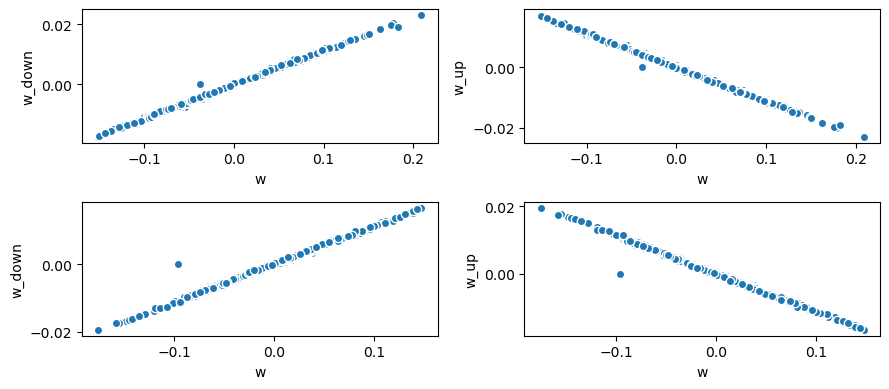

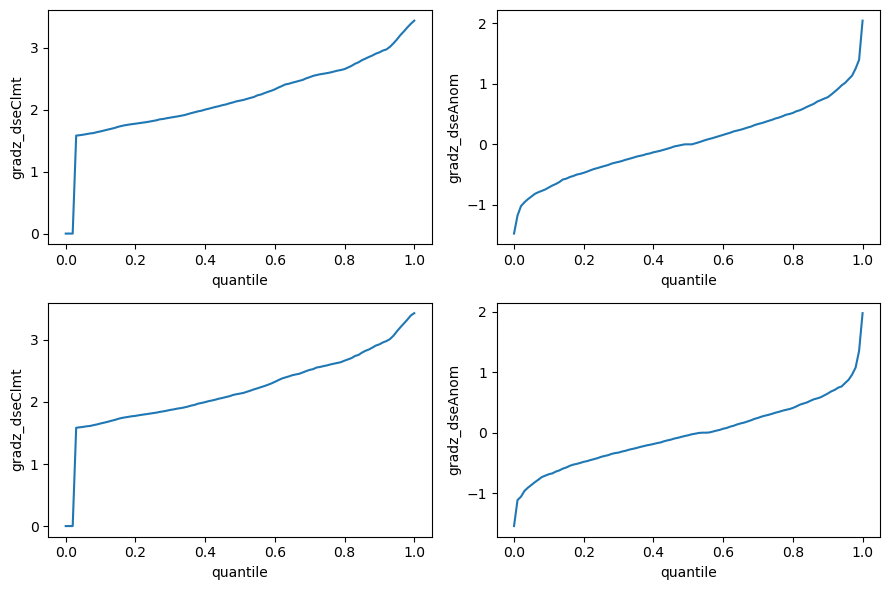

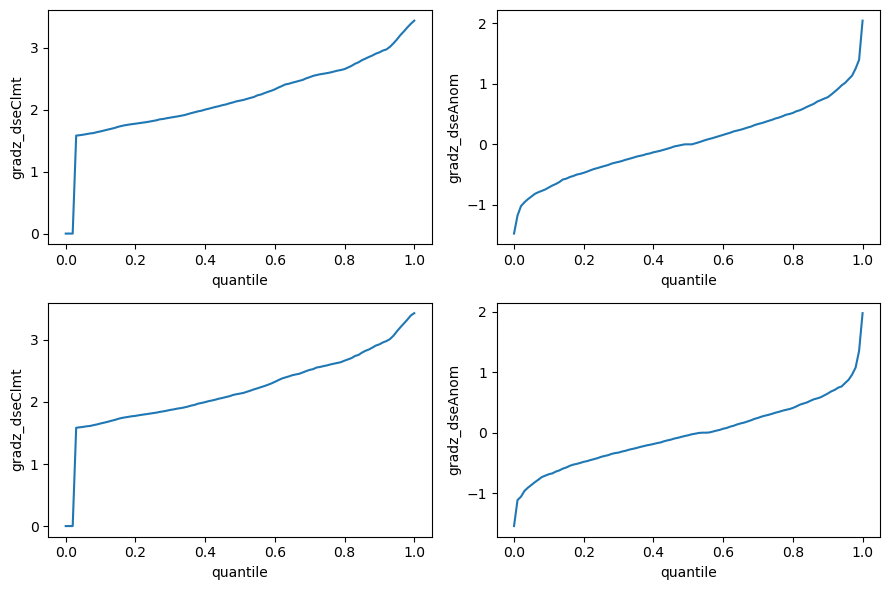

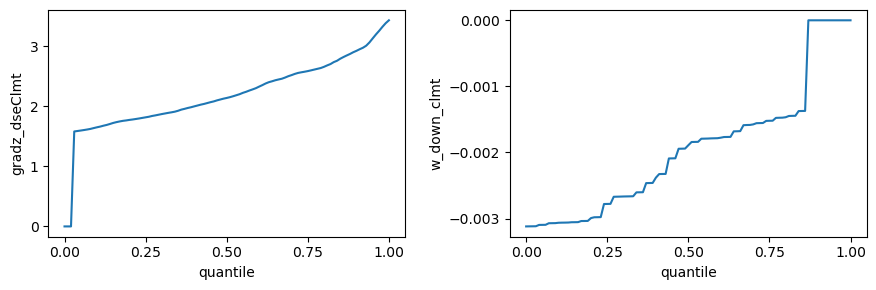

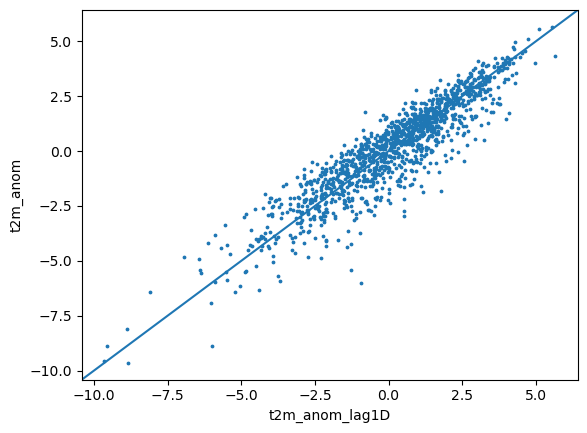

In [4]:
import sys
sys.path.insert(1, '/home/data/lab_hardik/udf/')
sys.path.insert(1, '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/')


import custom_funcs, grad_funcs, variables, composite_funcs, read_data_DSE_Flux_Trees_1980_2022

from read_data_DSE_Flux_Trees_1980_2022 import *
from grad_funcs import *
from custom_funcs import *
from composite_funcs import *

(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

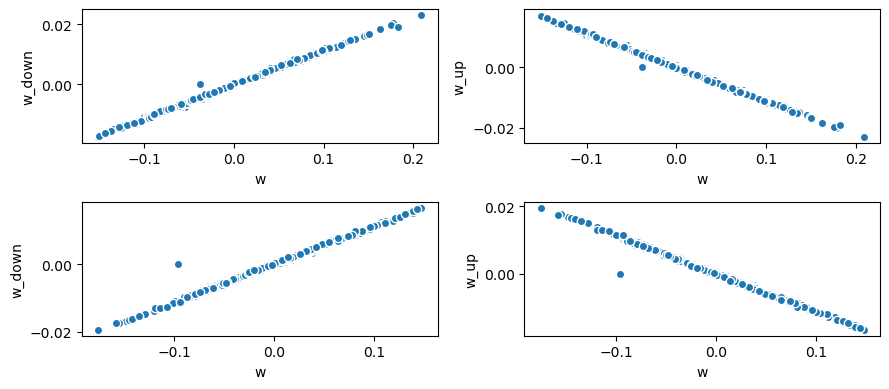

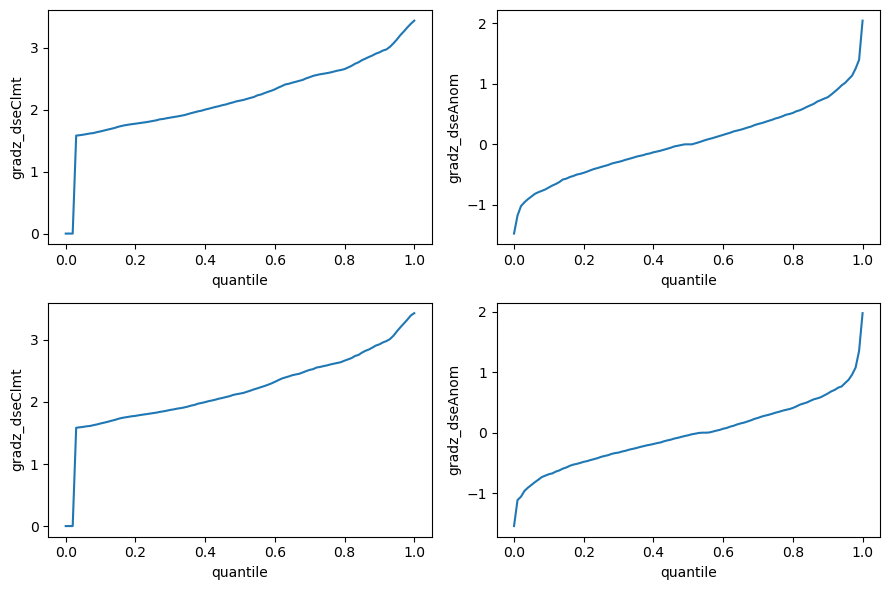

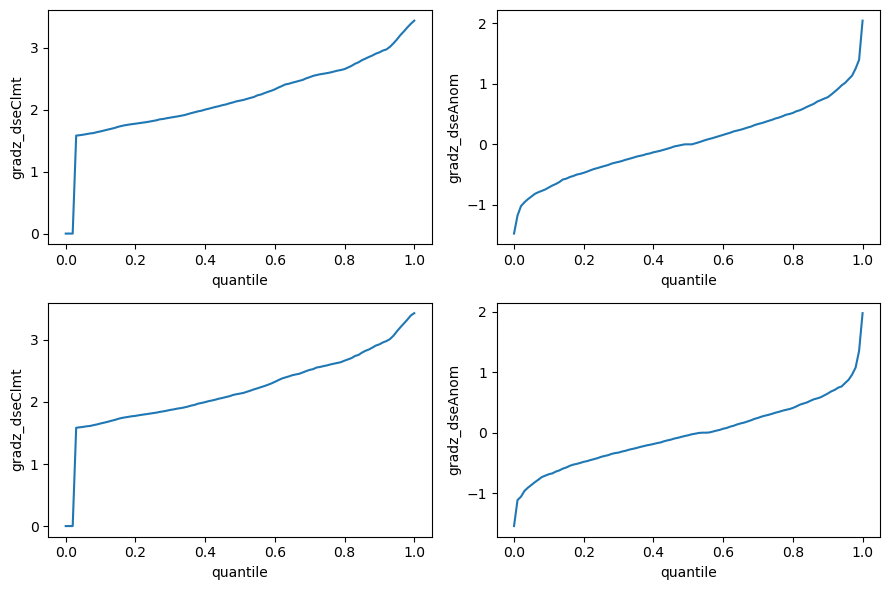

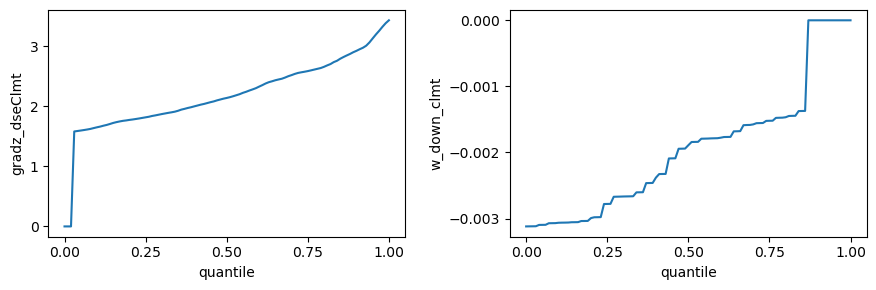

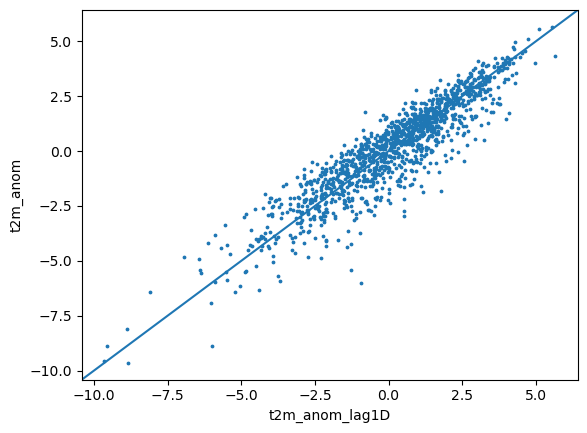

In [5]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *

In [6]:
df_mst= df_mst.dropna()

In [7]:
const_linear_terms =  [s for s in df_mlr0.columns if ('_' + u's\u0305') in s and 'clss' not in s]
const_linear_terms + ['adv_recon']

['adv_recon']

## matplotlib font settings

In [8]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
     'axes.labelsize': 20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
     'axes.titlesize':20, # pot title size
     'xtick.labelsize':20,
     'ytick.labelsize':20 # this controls yticks labelsize of both main plot and colorbar 
}

plt.rcParams.update(params)
# terms_to_use = mean_mean + eddy_mean + mean_eddy # + eddy_eddy  #const_linear_terms 
# terms_to_use = list(name_dict.values())

# for mon in [3,4,5,6]:

In [9]:
mpl.rcParams['mathtext.fontset'] = 'cm'
mpl.rcParams['mathtext.rm'] = 'cmr10'
mpl.rcParams['mathtext.default'] = 'it'
plt.rcParams['font.family'] = 'DejaVu Serif'


In [10]:
# importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
# from read_data_DSE_Flux_Trees_1980_2022 import *

## Color Hex codes

In [11]:
import matplotlib as mpl
codes_3_cat = plt.get_cmap('coolwarm', 3)
for i in range(codes_3_cat.N):
    rgba = codes_3_cat(i)
    # rgb2hex accepts rgb or rgba
    print(mpl.colors.rgb2hex(rgba))
    

#3b4cc0
#dddddd
#b40426


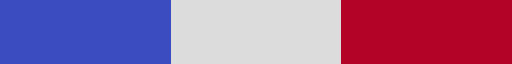

In [12]:
codes_3_cat

In [13]:
import matplotlib
codes_5_cat = plt.get_cmap('coolwarm', 5)
for i in range(codes_5_cat.N):
    rgba = codes_5_cat(i)
    # rgb2hex accepts rgb or rgba
#     print(rgba)
    print(matplotlib.colors.rgb2hex(rgba))
    

#3b4cc0
#8db0fe
#dddddd
#f49a7b
#b40426


In [14]:
## Old codes
# redcolor = '#ca4842'
# bluecolor = '#3884bb'
# grey = '#d3d3d3'

In [15]:
## New codes
redcolor = "#3b4cc0"
grey =  "#808080"#"#4C4C4C" #"#dddddd"
bluecolor = "#b40426"

In [16]:
# df_t1.groupby([df_t1.month, df_t1.day]).mean()
# .iloc[:,1]

## Vertical coherence

In [17]:
df_raw_95_09 = pd.read_csv('/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/df_ni_raw_anoms_1995_2009_vf.csv')
df_raw_95_09.columns

Index(['date', 'Tanom_500', 'Zanom_500', 'Zanom_300', 'Z300_15Dcentanom',
       'Z500_15Dcentanom', 'pv_15Dcentanom', 'dwswanom', 'dwlwanom', 'shfanom',
       'lhfanom', 'blhanom', 'swvl1', 't2m_anom', 'perc_box_hmgnty', 'w_800',
       'w_900', 'w_500', 'w_300', 'w'_800', 'w'_900', 'w'_500', 'w'_300',
       'year', 'month', 'day', 'w'_diff_ML_LL', 'w'_diff_UL_LL',
       'w_diff_ML_LL', 'w_diff_UL_LL', 'w'_800_Lag1', 'w'_900_Lag1',
       'w'_500_Lag1', 'w'_300_Lag1', 'w'_diff_ML_LL_Lag1',
       'w'_diff_UL_LL_Lag1', 'w_diff_ML_LL_Lag1', 'w_diff_UL_LL_Lag1',
       'v'_300', 'v'_500', 'v'_800', 'v'_900', 'v'_diff_ML_LL',
       'v'_diff_ML_LL_Lag1', 'v'_diff_UL_LL', 'v'_diff_UL_LL_Lag1', 'v_300',
       'v_300_Lag1', 'v_500', 'v_500_Lag1', 'v_800', 'v_800_Lag1', 'v_900',
       'v_900_Lag1', 'v_diff_ML_LL', 'v_diff_ML_LL_Lag1', 'v_diff_UL_LL',
       'v_diff_UL_LL_Lag1', 'Tanom_500_Lag1', 'Zanom_500_Lag1',
       'Zanom_300_Lag1', 'Z300_15Dcentanom_Lag1', 'Z500_15Dcentanom_Lag1',


In [18]:
df_raw_80_94 = pd.read_csv('/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/df_ni_raw_anoms_1980_1994_vf.csv')
df_raw_10_22 = pd.read_csv('/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/df_ni_raw_anoms_2010_2022_vf.csv')
df_raw_comb = pd.concat([df_raw_80_94, df_raw_95_09, df_raw_10_22], axis=0)


In [19]:
mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['mathtext.fontset'] = 'cm'  # Use Computer Modern font


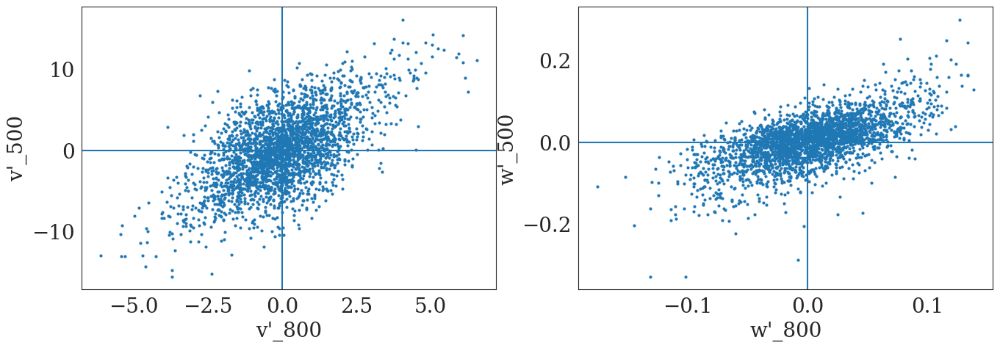

In [20]:
fig, ax = plt.subplots(1,2,figsize=(16,5), squeeze=False)
df_raw_comb.plot.scatter(x='v\'_800', y='v\'_500', s=4, ax=ax[0,0])
df_raw_comb.plot.scatter(x='w\'_800', y='w\'_500', s=4, ax=ax[0,1])

for j in range(2):
    ax[0,j].axhline(0)
    ax[0,j].axvline(0)


## del T2m <-> del DSE <-> Adv DSE plots

(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

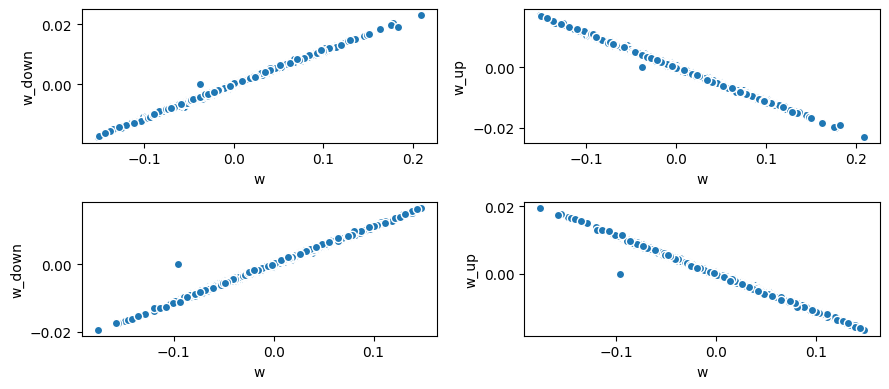

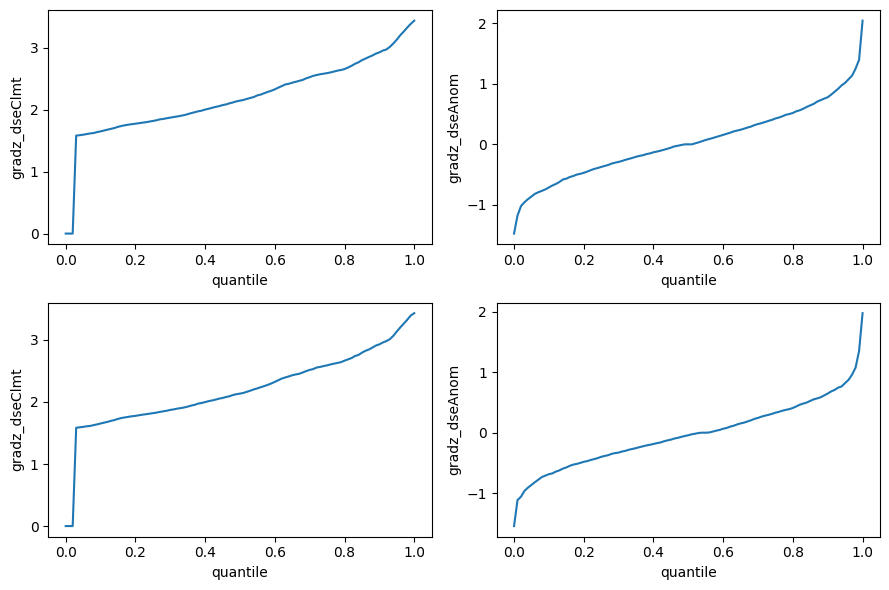

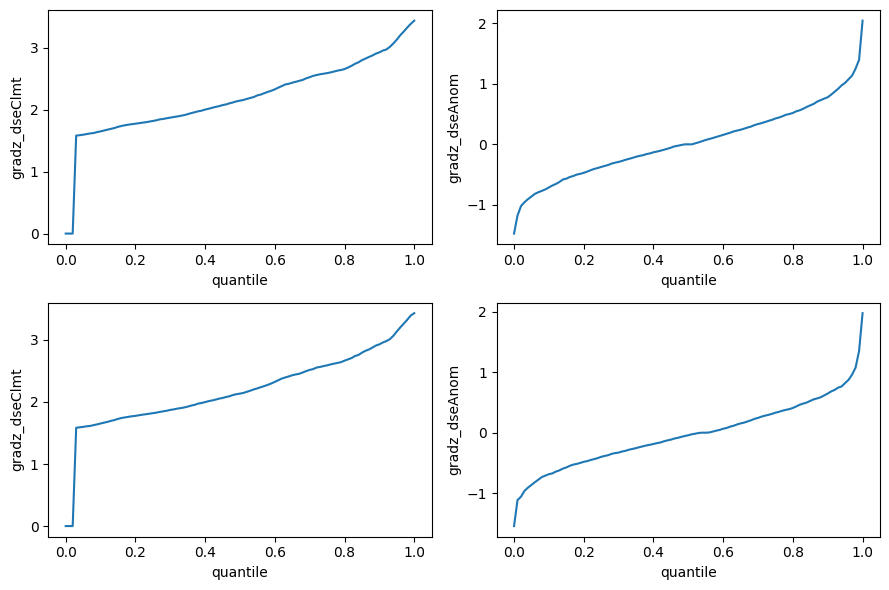

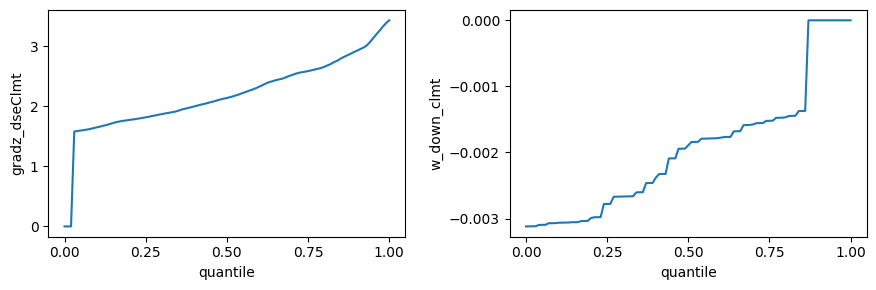

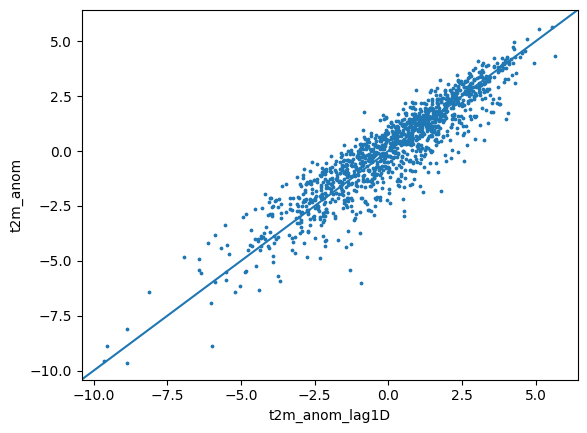

In [698]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *


In [699]:
[s for s in df_t1.columns if 't2m' in s]

['t2m_anom', 't2m_anom_Lag1', 'del_t2m_anom']

In [700]:
[s for s in df_t1.columns if 'dse' in s]

['coready_dse_del1', 'dse_anom', 'dse_clmt', 'dse_anom_Lag1']

In [701]:
df_t1.index
# .lag(1)

DatetimeIndex(['1980-03-04', '1980-03-05', '1980-03-07', '1980-03-08',
               '1980-03-09', '1980-03-10', '1980-03-11', '1980-03-12',
               '1980-03-13', '1980-03-14',
               ...
               '2022-06-06', '2022-06-07', '2022-06-08', '2022-06-09',
               '2022-06-10', '2022-06-11', '2022-06-12', '2022-06-13',
               '2022-06-14', '2022-06-15'],
              dtype='datetime64[ns]', name='date', length=4336, freq=None)

In [702]:
[s for s in df_t1.columns if 'adv' in s]

['adv_recon',
 'adv_recon_Lag1',
 'adv_recon_2Dave',
 'adv_recon_2Dave_nonmain',
 'adv_recon_2']

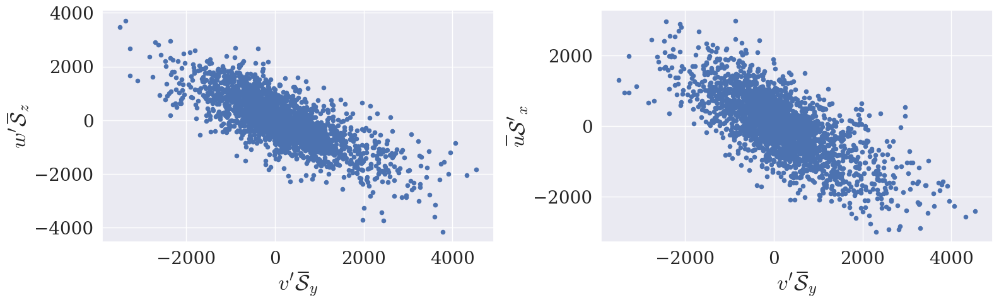

In [767]:
fig,ax = plt.subplots(1,2,figsize=(16,5))
df_plt.plot.scatter(x=y_main, y=z_main,ax=ax[0])
df_plt.plot.scatter(x=y_main, y=x_main,ax=ax[1])
plt.tight_layout()

In [705]:
df_plt.loc[(df_plt[y_main]<-1*df_plt[y_main].std())].shape[0]


244

In [706]:
df_plt.loc[(df_plt[y_main]<-1*df_plt[y_main].std()) & (df_plt[z_main] < 0)].shape[0]


13

In [707]:
df_plt.loc[(df_plt[y_main]<-1*df_plt[y_main].std()) & (df_plt[z_main] > 0)].shape[0]


231

In [708]:
df_plt.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

# Distributional similarities -  del T2m, del S, del Stot

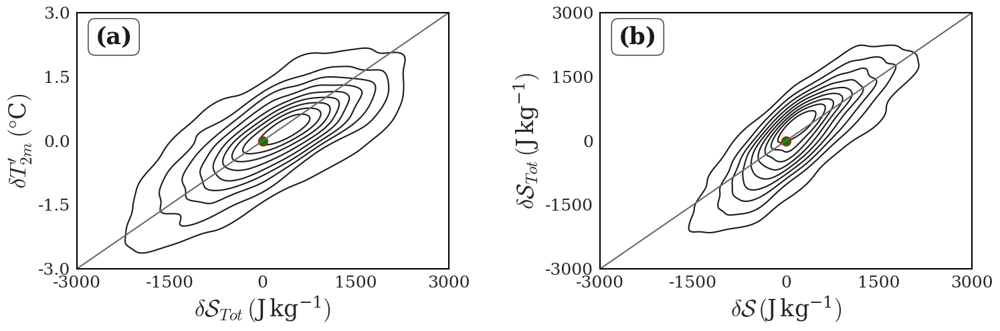

In [195]:
fontname = "DejaVu Serif"
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':30, # pot title size
         'xtick.labelsize':18,
         'ytick.labelsize':18, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': fontname,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(1,2,figsize=(16,6))
df_plt = df_t1.loc[df_t1.month.isin([3,4])]

sns.kdeplot(data=df_plt, x="coready_dse_del1", y="del_t2m_anom", ax=ax[0], legend=True, color='k')
ax[0].plot(0, 0, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")

# df_plt.plot.scatter(x='coready_dse_del1', y='del_t2m_anom', ax=ax[0], s=4, c='k')
# ax[0].axhline(0, c='dimgray', ls='--')
# ax[0].axvline(0, c='dimgray', ls='--')
ax[0].set_ylabel('$\delta T_{2m}\'\,(\degree\mathregular{C})$')
ax[0].set_xlabel('$\delta \mathcal{S}_{Tot}\,(\mathregular{J\,kg^{-1}})$')
ax[0].axline((0,0), slope=1/1000, c='dimgray',)
# ax[0].set_title('$r = {}$'.format(df_plt['coready_dse_del1'].corr(df_plt['del_t2m_anom']).round(2)), fontsize=25)
ax[0].set_xlim(-3000,3000)
ax[0].set_ylim(-3,3)
ax[0].set_xticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), rotation=0)
ax[0].set_yticks(ticks=list(np.arange(-3,4,1.5)), labels= list(np.arange(-3,4,1.5)),)

sns.kdeplot(data=df_plt, x="adv_recon_2Dave", y="coready_dse_del1", ax=ax[1], legend=True, color='k')
ax[1].plot(0, 0, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
# df_plt.plot.scatter(x='adv_recon_2Dave', y='coready_dse_del1', ax=ax[1], s=4, c='k')
# ax[1].axhline(0, c='dimgray', ls='--')
# ax[1].axvline(0, c='dimgray', ls='--')
ax[1].set_ylabel('$\delta \mathcal{S}_{Tot}\,(\mathregular{J\,kg^{-1}})$')
ax[1].set_xlabel('$\delta \mathcal{S}\,(\mathregular{J\,kg^{-1}})$')
ax[1].axline((0,0), slope=1, c='dimgray',)
ax[1].set_xlim(-3000,3000)
ax[1].set_ylim(-3000,3000)
ax[1].set_xticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), rotation=0)
ax[1].set_yticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), )

ax[0].set_facecolor("white")
ax[1].set_facecolor("white")


# Add the index at the left top of the plot 
props = dict(boxstyle='round', facecolor='none', alpha=0.8, edgecolor='black')
ax[0].text(.05, .95, '(a)', transform=ax[0].transAxes, fontsize=25, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1].text(.05, .95, '(b)', transform=ax[1].transAxes, fontsize=25, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')

borderthickness=1.5
for j in range(2):
    ax[j].spines['top'].set_linewidth(borderthickness)
    ax[j].spines['bottom'].set_linewidth(borderthickness)
    ax[j].spines['right'].set_linewidth(borderthickness)
    ax[j].spines['left'].set_linewidth(borderthickness)
    for spine in ax[j].spines.values():
        spine.set_color('black')
# secondar        
plt.tight_layout(pad=4.5)

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_T2m_corrs.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


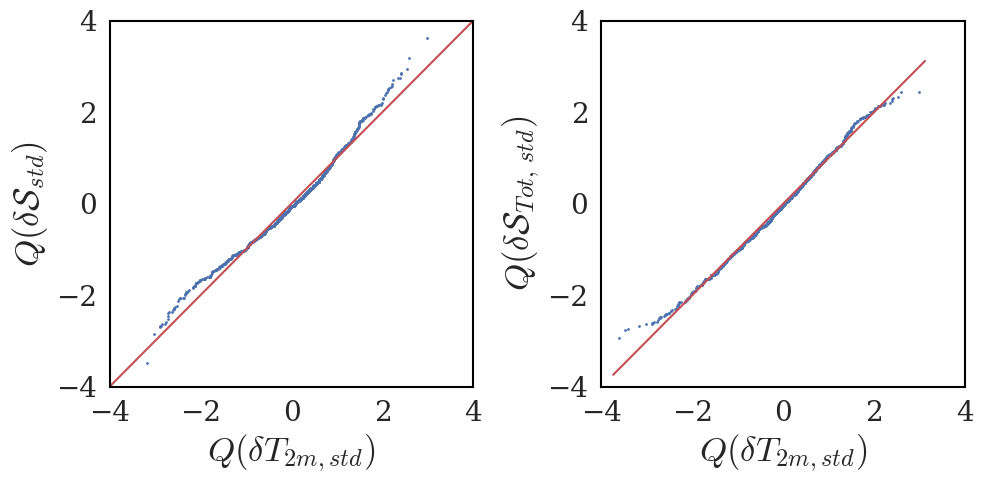

In [784]:
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Standardize variables
x1 = (df_apr.del_t2m_anom - df_apr.del_t2m_anom.mean()) / df_apr.del_t2m_anom.std()
y1 = (df_apr.adv_recon_2Dave - df_apr.adv_recon_2Dave.mean()) / df_apr.adv_recon_2Dave.std()
y2 = (df_apr.coready_dse_del1 - df_apr.coready_dse_del1.mean()) / df_apr.coready_dse_del1.std()

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# First QQ plot
sm.qqplot_2samples(x1, y1, line='45', ax=axes[0])
axes[0].set_xlabel("$Q(\delta T_{2m, std})$")
axes[0].set_ylabel("$Q(\delta \mathcal{S}_{std})$")
axes[0].set_xlim(-4, 4)
axes[0].set_ylim(-4, 4)

# Second QQ plot
sm.qqplot_2samples(x1, y2, line='45', ax=axes[1])
axes[1].set_xlabel("$Q(\delta T_{2m, std})$")
axes[1].set_ylabel("$Q(\delta \mathcal{S}_{Tot,\,std})$")  # Customize label
axes[1].set_xlim(-4, 4)
axes[1].set_ylim(-4, 4)

# Customize marker size for both plots
for ax in axes:
    for line in ax.lines:
        line.set_markersize(1)
    for spine in ax.spines.values():
        spine.set_visible(True)           # Make sure it's visible
        spine.set_color('black')          # Border color
        spine.set_linewidth(1.5)          # Border thickness

    ax.grid(False)
    ax.set_facecolor("white")

plt.tight_layout()
plt.savefig("/home/data/lab_hardik/Manuscript1/qqplots_delT2m_vs_delS_and_delSTot.pdf")
# plt.show()

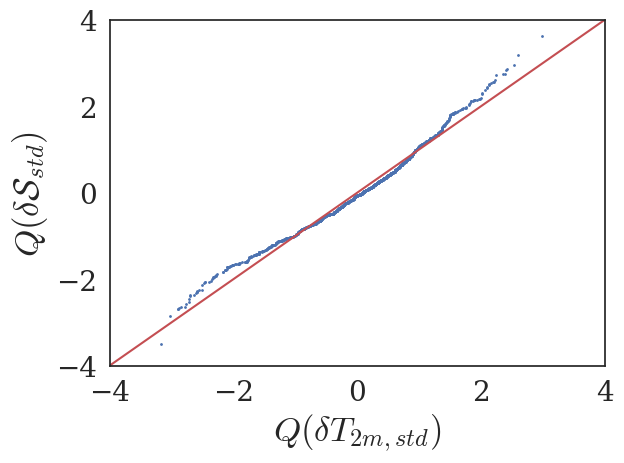

In [785]:
fig = sm.qqplot_2samples(
    (df_apr.del_t2m_anom - df_apr.del_t2m_anom.mean())/df_apr.del_t2m_anom.std(),
    (df_apr.adv_recon_2Dave - df_apr.adv_recon_2Dave.mean())/df_apr.adv_recon_2Dave.std(), 
#     df_apr.adv_recon_2Dave, 
#     df_apr.del_t2m_anom,
    line='45',
    
)

# Customize marker size
ax = fig.axes[0]
for line in ax.lines:
    line.set_markersize(1)  # Change this value as needed

ax.set_xlabel("$Q(\delta T_{2m, std})$")
ax.set_ylabel("$Q(\delta \mathcal{S}_{std})$")
ax.set_xlim(-4,4)
ax.set_ylim(-4,4)
plt.tight_layout()
plt.savefig("/home/data/lab_hardik/Manuscript1/qqplot_LTdelS_delT2m.pdf")
# plt.show()


In [77]:
ds_tcwv_monmeans = xr.open_dataset("/home/data/lab_hardik/data/ERA5/climatology/monthly/ERA5_tcwv_monthly_means_1980_2022.nc")

In [78]:
ds_monmeans_1 = xr.open_dataset("/home/data/lab_hardik/data/ERA5/climatology/monthly/era5_monthly_means_1.nc")
ds_monmeans_2 = xr.open_dataset("/home/data/lab_hardik/data/ERA5/climatology/monthly/era5_monthly_means_2.nc")

In [79]:
ds_cc = xr.open_dataset("/home/data/lab_hardik/data/ERA5/climatology/monthly/era5_cc_monthly_means.nc")

In [80]:
ds_monmeans = xr.merge([ds_monmeans_1, ds_monmeans_2, ds_tcwv_monmeans, ds_cc])

In [81]:
ds_monmeans.data_vars

Data variables:
    tp         (valid_time, latitude, longitude) float32 nan nan nan ... 0.0 0.0
    avg_slhtf  (valid_time, latitude, longitude) float32 nan nan ... -33.1
    tcrw       (valid_time, latitude, longitude) float32 9.155e-05 ... nan
    tcwv       (valid_time, latitude, longitude) float32 4.647 4.883 ... nan nan
    tcc        (valid_time, latitude, longitude) float32 0.319 0.2975 ... nan

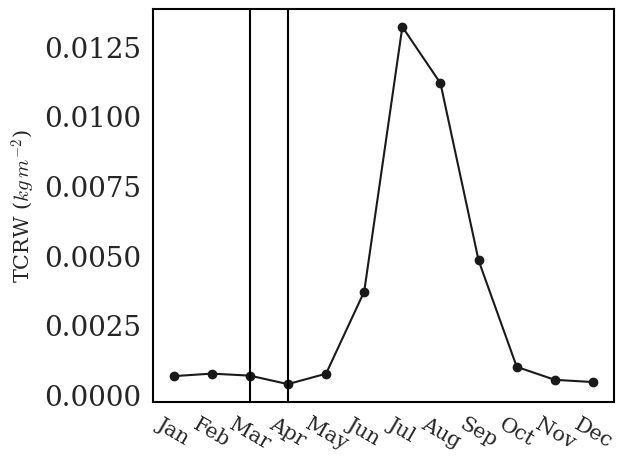

In [82]:
import calendar
dv = 'tcrw'
# dv='avg_slhtf'
# dv='tp'

fig,ax = plt.subplots()
ds_monmeans[dv].drop('number').mean(['latitude',"longitude"])\
.groupby(ds_monmeans.valid_time.dt.month).mean().plot(ax=ax, marker="o",c='k')

ax.set_xticks(ticks=range(1, 13))
ax.set_xticklabels(labels=[calendar.month_abbr[i] for i in range(1, 13)], rotation=-30, fontsize=15)
ax.tick_params(axis='both', which='both', direction='out', length=5, width=5,color='k')

plt.xlabel("")
ax.set_ylabel(f"{dv.upper()}" + " " + "($kg\,m^{-2}$)", fontsize=15)
ax.set_title("")
for spine in ax.spines.values():
    spine.set_visible(True)           # Make sure it's visible
    spine.set_color('black')          # Border color
    spine.set_linewidth(1.5)          # Border thickness

ax.grid(False)
ax.set_facecolor("white")

ax.axvline(3, c='black')
ax.axvline(4, c='black')
plt.tight_layout()
plt.savefig(f"/home/data/lab_hardik/Manuscript1/{dv}_monthly_means.pdf")


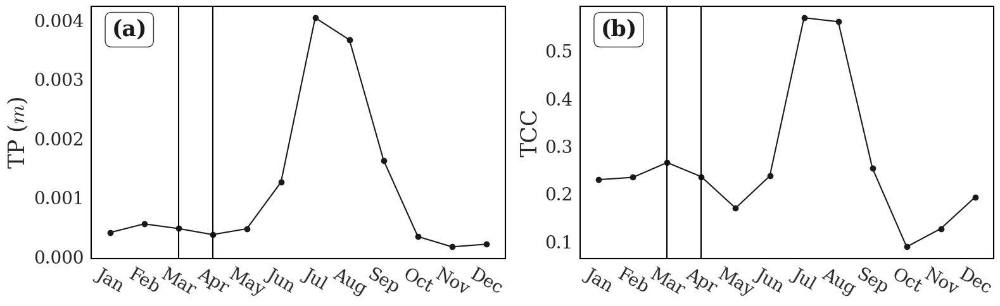

In [84]:
import calendar
# dv = 'tcrw'
# dv='avg_slhtf'

fig,ax = plt.subplots(1,2,figsize=(16,5))
dv='tp'
ds_monmeans[dv].drop('number').mean(['latitude',"longitude"])\
.groupby(ds_monmeans.valid_time.dt.month).mean().plot(ax=ax[0], marker="o",c='k')

ax[0].set_xticks(ticks=range(1, 13))
ax[0].set_xticklabels(labels=[calendar.month_abbr[i] for i in range(1, 13)], rotation=-30, )
ax[0].tick_params(axis='both', which='both', direction='out', length=5, width=5,color='k')

ax[0].set_xlabel("")
ax[0].set_ylabel(f"{dv.upper()}" + " " + "($m$)", )
ax[0].set_title("")
for spine in ax[0].spines.values():
    spine.set_visible(True)           # Make sure it's visible
    spine.set_color('black')          # Border color
    spine.set_linewidth(1.5)          # Border thickness

ax[0].grid(False)
ax[0].set_facecolor("white")

ax[0].axvline(3, c='black')
ax[0].axvline(4, c='black')

dv='tcc'
ds_monmeans[dv].drop('number').mean(['latitude',"longitude"])\
.groupby(ds_monmeans.valid_time.dt.month).mean().plot(ax=ax[1], marker="o",c='k')

ax[1].set_xticks(ticks=range(1, 13))
ax[1].set_xticklabels(labels=[calendar.month_abbr[i] for i in range(1, 13)], rotation=-30,)
ax[1].tick_params(axis='both', which='both', direction='out', length=5, width=5,color='k')

ax[1].set_xlabel("")
ax[1].set_ylabel(f"{dv.upper()}", )
ax[1].set_title("")
for spine in ax[1].spines.values():
    spine.set_visible(True)           # Make sure it's visible
    spine.set_color('black')          # Border color
    spine.set_linewidth(1.5)          # Border thickness

ax[1].grid(False)
ax[1].set_facecolor("white")

ax[1].axvline(3, c='black')
ax[1].axvline(4, c='black')

# Add the index at the left top of the plot 
props = dict(boxstyle='round', facecolor='none', alpha=0.8, edgecolor='black')
ax[0].text(.05, .95, '(a)', transform=ax[0].transAxes, fontsize=25, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1].text(.05, .95, '(b)', transform=ax[1].transAxes, fontsize=25, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')

plt.tight_layout()
plt.savefig("/home/data/lab_hardik/Manuscript1/monthly_means_tp_tcc.pdf")


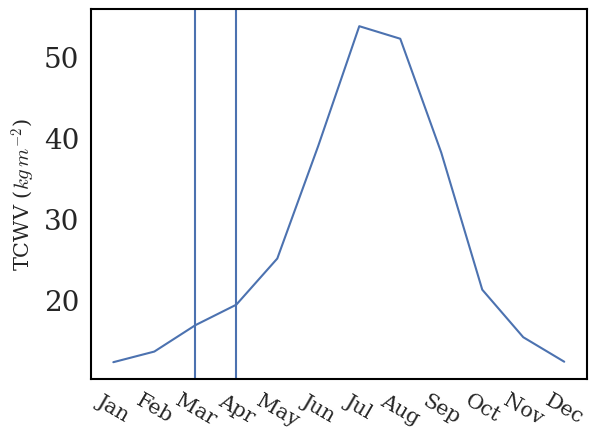

In [557]:
import calendar
fig,ax = plt.subplots()
ds_tcwv_monmeans.drop('number')['tcwv'].mean(['latitude',"longitude"])\
.groupby(ds_tcwv_monmeans.valid_time.dt.month).mean().plot(ax=ax)

ax.set_xticks(ticks=range(1, 13))
ax.set_xticklabels(labels=[calendar.month_abbr[i] for i in range(1, 13)], rotation=-30, fontsize=15)
ax.tick_params(axis='both', which='both', direction='out', length=5, width=5,color='k')

plt.xlabel("")
ax.set_ylabel("TCWV ($kg\,m^{-2}$)", fontsize=15)
ax.set_title("")
for spine in ax.spines.values():
    spine.set_visible(True)           # Make sure it's visible
    spine.set_color('black')          # Border color
    spine.set_linewidth(1.5)          # Border thickness

ax.grid(False)
ax.set_facecolor("white")

ax.axvline(3)
ax.axvline(4)

plt.savefig("/home/data/lab_hardik/Manuscript1/tcwv_monthly_means.pdf")

In [117]:
[180/np.pi*n for n in np.linspace(np.pi/5,2*np.pi + np.pi/5, 5)]

[36.0, 126.0, 216.0, 306.0, 396.0]

## ERA5 w vs QG Omega

In [225]:
df_exclusion_dates = pd.read_csv(
    '/home/data/lab_hardik/heatwaves/ERA5/analyses/DSE/processed_files/1980_2022_exclusion_dates.csv', 
    parse_dates=['date']
)


In [226]:
ds_w_plt =\
xr.open_dataset("/home/data/lab_hardik/heatwaves/ERA5/analyses/RWP/qg_omega/processed_files/daily_qgomega_era5w_1980_2022.nc")

In [227]:
ds_w_plt.date

<xarray.DataArray 'date' (date: 2623)>
array(['1980-03-01T00:00:00.000000000', '1980-03-02T00:00:00.000000000',
       '1980-03-03T00:00:00.000000000', ..., '2022-04-28T00:00:00.000000000',
       '2022-04-29T00:00:00.000000000', '2022-04-30T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * date     (date) datetime64[ns] 1980-03-01 1980-03-02 ... 2022-04-30
    number   int64 ...
    step     timedelta64[ns] ...
    surface  float64 ...

In [228]:
ds_w_plt = ds_w_plt.sel(date = ~(ds_w_plt.date.isin(df_exclusion_dates.date)))

In [229]:
ds_w_plt.date

<xarray.DataArray 'date' (date: 2587)>
array(['1980-03-01T00:00:00.000000000', '1980-03-02T00:00:00.000000000',
       '1980-03-03T00:00:00.000000000', ..., '2022-04-28T00:00:00.000000000',
       '2022-04-29T00:00:00.000000000', '2022-04-30T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * date     (date) datetime64[ns] 1980-03-01 1980-03-02 ... 2022-04-30
    number   int64 ...
    step     timedelta64[ns] ...
    surface  float64 ...

In [230]:
np.linspace(-0.2,0.2,6).round(2)

array([-0.2 , -0.12, -0.04,  0.04,  0.12,  0.2 ])

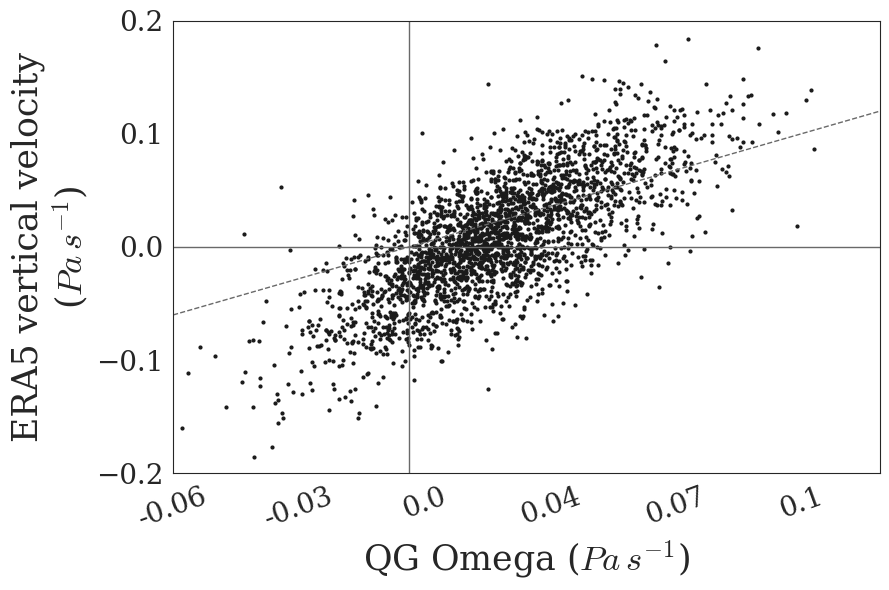

In [245]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':25, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
#         'font.family': 'DejaVu Serif',
}
plt.rcParams.update(params)

fig,ax = plt.subplots(figsize=(9,6))

ds_w_plt.sel(date = ds_w_plt.date.dt.month.isin([3,4])).to_pandas().plot.scatter(x='Omega', y='w',s=4,c='k',ax=ax)

# ax.set_xticks(ticks = [-.2,-.1,0,.1,.2], labels=[-.2,-.1,0,.1,.2], rotation=0)

xlo = -0.06
xhi=0.1
plt.xlim(-0.06,0.12)
plt.ylim(-0.2,0.2)
nticks = 5

ax.set_xticks(ticks = np.linspace(xlo, xhi, 6), labels=np.linspace(xlo, xhi, 6).round(2), rotation=20)
ax.set_yticks([-.2,-.1,0,.1,.2])

ax.set_xlabel('QG Omega ($Pa\,s^{-1}$)', fontfamily='serif')
ax.set_ylabel('ERA5 vertical velocity\n($Pa\,s^{-1}$)')
ax.axhline(0, c='dimgray', ls='-', lw=1)
ax.axvline(0, c='dimgray', ls='-', lw=1)
ax.axline((0,0), slope=1, c='dimgray', ls='--', lw=1)
# xticks = ax.get_xticks().round(3)
# ax.set_xticklabels(xticks, )
plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Supplem_Mar_Apr_Omega_w.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [238]:
np.linspace(-0.06, 0.1, 5).round(2)

array([-0.06, -0.02,  0.02,  0.06,  0.1 ])

In [ ]:
1

In [47]:
importlib.reload(variables)
from variables import *

$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]


In [48]:
cols_pnl1 = [dx_s_anom, dy_s_anom, dx_sbar, dy_sbar] + ['month']
cols_pnl2 = [uanom, vanom, ubar, vbar] + ['month']
cols_pnl3 = [dz_s_anom, dz_sbar] + ['month'] 
cols_pnl4 = [wanom, wbar] + ['month']

In [49]:
data1 = df_t1.loc[df_t1.month.isin([3,4]), cols_pnl1].replace({'month': month_map})
data2 = df_t1.loc[df_t1.month.isin([3,4]), cols_pnl2].replace({'month': month_map})
data3 = df_t1.loc[df_t1.month.isin([3,4]), cols_pnl3].replace({'month': month_map})
data4 = df_t1.loc[df_t1.month.isin([3,4]), cols_pnl4].replace({'month': month_map})

data1_melted = pd.melt(data1, id_vars=['month'], value_vars=[s for s in data1.columns if 'month' not in s])
data2_melted = pd.melt(data2, id_vars=['month'], value_vars=[s for s in data2.columns if 'month' not in s])
data3_melted = pd.melt(data3, id_vars=['month'], value_vars=[s for s in data3.columns if 'month' not in s])
data4_melted = pd.melt(data4, id_vars=['month'], value_vars=[s for s in data4.columns if 'month' not in s])

month_cmap = {
    list(month_map.values())[0]: redcolor, 
    list(month_map.values())[1]: bluecolor, 
}



In [50]:
for key in month_map.keys():
    df_mon = df_mst2.loc[df_mst2.month == key].copy()
    df_iv = df_mon.iloc[:,:12].copy()
#     df_iv = df_iv.iloc[:,(-df_iv.std()).argsort()[:6]]
    filt_vars = df_iv.columns

    globals()[f'df_dists_iv_{month_map[key].lower()}'] = pd.concat(
        [ df_iv.mean().rename('mean'), df_iv.std().rename('sd'), df_iv.skew().rename('skew')
    ], axis=1
    )
    globals()[f'df_dists_iv_{month_map[key].lower()}'].index.name = 'variable'
    globals()[f'df_dists_iv_{month_map[key].lower()}'] = globals()[f'df_dists_iv_{month_map[key].lower()}'].reset_index()


In [51]:
df_dists_mst = df_dists_iv_april.set_index('variable')\
.join(df_dists_iv_march.set_index('variable'), how ='inner', rsuffix='_mar', lsuffix='_apr')\
.join(df_dists_iv_may.set_index('variable').rename(lambda x: x+'_may', axis=1), how ='inner')\
.join(df_dists_iv_june.set_index('variable').rename(lambda x: x+'_jun', axis=1), how ='inner')\
.sort_values('sd_mar', ascending=False).reset_index()

# df_dists_mst

## List available fonts in matplotlib

In [52]:
import matplotlib.font_manager as fm

# Get a list of font names
font_names = sorted([f.name for f in fm.fontManager.ttflist])
print([s for s in font_names if 'Serif' in s])

# # Get a set of unique font families
# font_families = set(f.name for f in fm.fontManager.ttflist)
# print(font_families)

['Bitstream Vera Serif', 'Bitstream Vera Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif', 'DejaVu Serif Display', 'FreeSerif', 'FreeSerif', 'FreeSerif', 'FreeSerif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Liberation Serif', 'Noto Serif CJK JP', 'Noto Serif CJK JP']


In [53]:
# import matplotlib.font_manager as fm

# # Specify the path to Times New Roman font file
# # font_path = '/home/data/lab_hardik/Fonts/times new roman.ttf'
# font_path = '/home/lab_hardik/my_conda/fonts/times.ttf'
# # Create a font object
# times_new_roman_font = fm.FontProperties(fname=font_path)

# print(times_new_roman_font)
# # Set Times New Roman as the font for the plot
# plt.rcParams['font.family'] = times_new_roman_font.get_name()


In [54]:
importlib.reload(custom_funcs)
from custom_funcs import *

(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

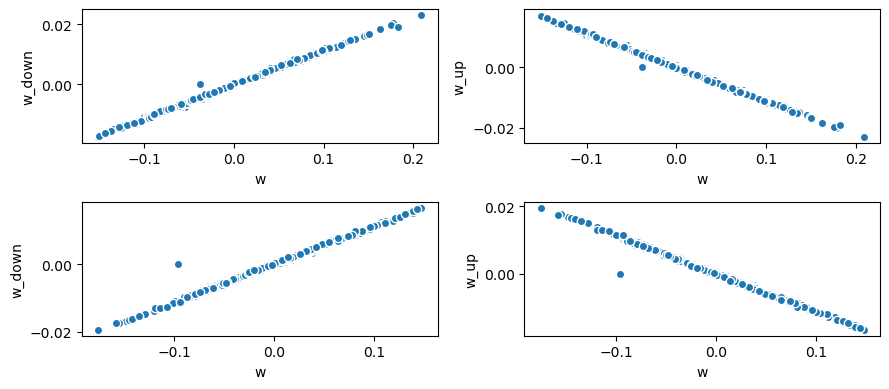

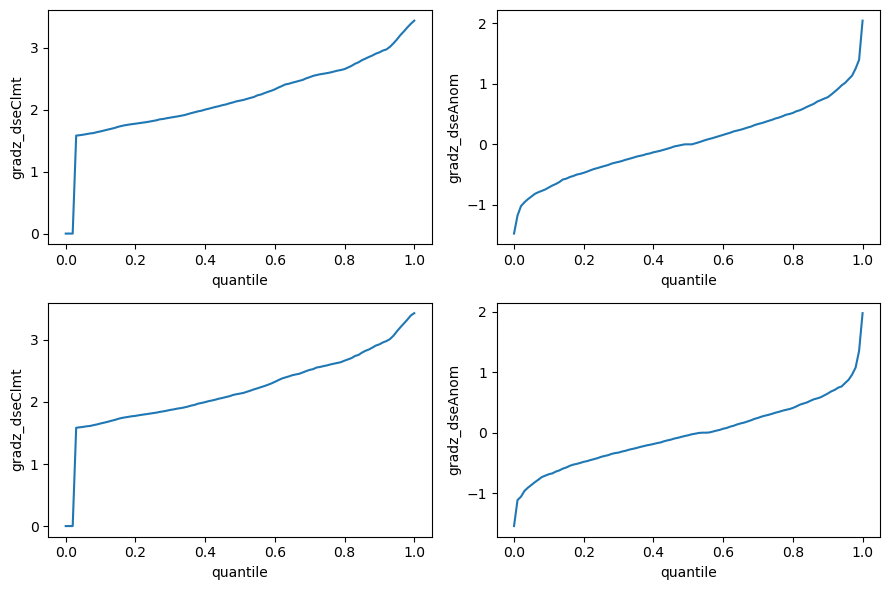

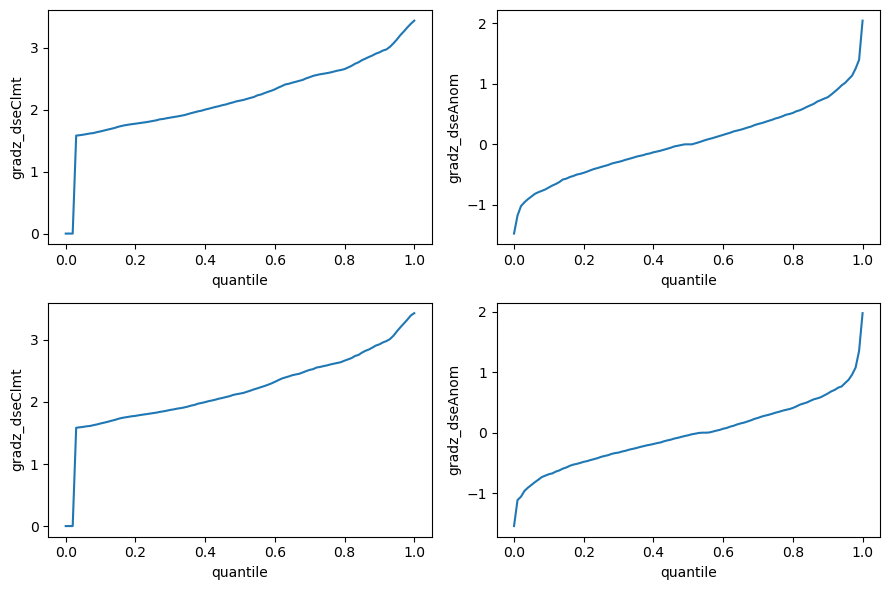

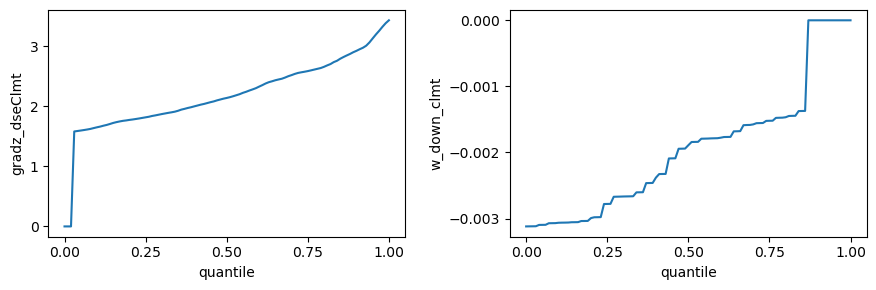

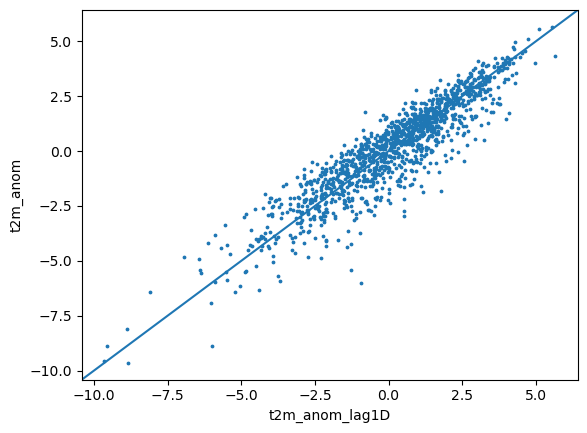

In [55]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *

In [56]:
importlib.reload(plt)

<module 'matplotlib.pyplot' from '/home/lab_hardik/my_conda/lib/python3.9/site-packages/matplotlib/pyplot.py'>

In [57]:
# plt.rcParams['text.usetex'] = False

# plt.rcParams['pgf.texsystem'] = 'lualatex'
# plt.rcParams['text.latex.preamble'] = r'''
# \usepackage{fontspec}
# \setmainfont{DejaVu Serif}
# '''

In [58]:
# plt.rcParams['text.latex.preamble'] = r'\usepackage{DejaVuSerif}'

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif']
mpl.rcParams['mathtext.fontset'] = 'cm'

In [59]:
gc.collect()

53044

In [60]:
df_t1.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

In [170]:
len(df_sigma)

12

In [173]:
march_colors

['green',
 'green',
 'green',
 'yellow',
 'yellow',
 'yellow',
 'grey',
 'grey',
 'grey',
 'grey',
 'grey',
 'grey']

DejaVu Serif
3
0 0
4
0 1


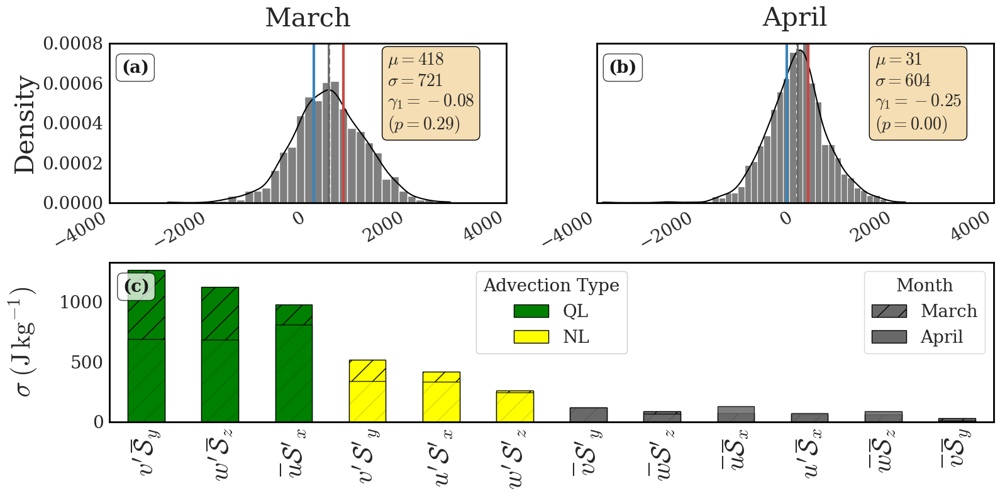

In [223]:
%matplotlib inline
import matplotlib.gridspec as gridspec

# plt.rcParams['font.family'] = fontname
# plt.rcParams['font.family'] = 'Nimbus Roman'

# fontname = times_new_roman_font.get_name()
fontname = 'DejaVu Serif'
print(fontname)

params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':30, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':30, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': fontname,
}

plt.rcParams.update(params)
# plt.rcParams['font.family'] = ['serif']
# plt.rcParams['font.serif'] = ['Times New Roman']

num_classes=3
y_var = 'adv_recon_2Dave'
num_mons = 2
tot_rows = 2
incl_skw_magplot = True
makebold_stats_str = False
props0 = dict(boxstyle='round', facecolor='wheat', alpha=1, edgecolor='black')

fig = plt.figure(figsize = (16,tot_rows*4))
gs = gridspec.GridSpec(tot_rows, 2)

# Create subplots using array-style indexing
ax = [[fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])],
      [fig.add_subplot(gs[1, :])],
#       [fig.add_subplot(gs[2, :])],
#       [fig.add_subplot(gs[3, 0]), fig.add_subplot(gs[3, 1])],
#       [fig.add_subplot(gs[4, 0]), fig.add_subplot(gs[4, 1])]
     ]


for i in range(num_mons):
    mon = i+3
    print(mon)
#     df_mon = df_mst2.loc[df_mst2.month == mon].copy()
    df_mon = df_t1.loc[df_t1.month == mon].copy()
    
    rownum = int(np.floor(i/2))
    colnum = i - 2*rownum
    
    print(rownum, colnum)

    # plot korboe
    sn.histplot(df_mon[y_var], kde=True, stat='density', ax=ax[rownum][colnum], color='black')
    
    mu = round(df_mon[y_var].mean())
    median = round(df_mon[y_var].median())    
    sigma = round(df_mon[y_var].std())
    skew_0 = np.round(scipy.stats.skew(df_mon[y_var], axis=0, bias=False), 2)

    res = scipy.stats.skewtest(df_mon[y_var])
    
    textstr = '\n'.join((
        r'$\boldsymbol{\mu =}$' + str(mu),
        r'$\boldsymbol{\sigma=}$' + str(sigma),
        r'$\boldsymbol{\gamma}_1$' +'$=$' + str(skew_0),
        r'$(p=%.2f)$' % (res.pvalue)
    )) if makebold_stats_str==True else '\n'.join((
        r'$\mu=%.0f$' % (mu, ),
        r'$\sigma=%.0f$' % (sigma),
        r'$\gamma_{1}=%.2f$' % (skew_0),
        r'$(p=%.2f)$' % (res.pvalue)
    ))
    
    ax[rownum][colnum].text(
        0.7, 0.95, textstr, 
        transform=ax[rownum][colnum].transAxes, 
        fontsize=20,
        verticalalignment='top', bbox=props0, 
        fontname =fontname, 
        fontweight='bold'
    )

    ax[rownum][colnum].axvline(df_mon[y_var].quantile(0.34), c=bluecolor, lw=3)
    ax[rownum][colnum].axvline(df_mon[y_var].quantile(0.5), c='dimgray', lw=2)
    ax[rownum][colnum].axvline(df_mon[y_var].mean(), c='dimgray', ls ='--', lw=2)
    ax[rownum][colnum].axvline(df_mon[y_var].quantile(0.67), c=redcolor, lw=3)
    
    ax[rownum][colnum].set_xlim(-4000,4000)
    ax[rownum][colnum].set_ylim(0,0.0008)
    

    ax[rownum][colnum].set_title(month_map[mon], pad=20, fontname=fontname)
    ax[rownum][colnum].set_xlabel('')
    
    ax[rownum][colnum].set_xticks(ax[rownum][colnum].get_xticks(), ax[rownum][colnum].get_xticklabels(), rotation=30, ha='right')

ax[0][0].set_ylabel('Density')
ax[0][1].set_ylabel('')
ax[0][1].set_yticks([])

## ROW 2
kind = 'bar'

df_dists_mar_apr = df_dists_mst[[s for s in df_dists_mst.columns if any([t in s for t in ['mar','apr','variable']])]].copy()
labels = list(df_dists_mar_apr.variable)
xlabs = labels

df_sigma = df_dists_mar_apr[[s for s in df_dists_mar_apr.columns if 'sd' in s]]\
.rename({'sd_mar':'March', 'sd_apr':'April'}, axis=1)
df_sigma = df_sigma[['March','April']]


import matplotlib.patches as patches
incl_skw_magplot = False
if incl_skw_magplot == True:
    ax[1][0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)  # Remove xticks and labels
    ax[1][0].set_xticks([])
    
    axi = ax[1][0]
    df_skew = df_dists_mar_apr[[s for s in df_dists_mar_apr.columns if 'skew' in s]]\
    .rename({'skew_mar':'March', 'skew_apr':'April'}, axis=1)
    kind = 'bar'
    df_skew = df_skew[['March','April']]

    kind='line'
    sct2 = df_sigma[['March']].plot(kind=kind, ax=axi, legend=False, ls='-', color='dimgray') 
    sct2 = df_sigma[['April']].plot(kind=kind, ax=axi, legend=False, ls='-', color='black') 

    axi.grid(False)  # Turn off grid

    ax2 = axi.twinx()
    kind = 'bar'
    df_skew = df_skew[['March','April']]

    skw2 = df_skew.plot(
        kind=kind, ax=ax2, **{'legend':False,'alpha':1}, 
    #     color='dimgray', # hatch='/', 
        color = ['dimgray', 'black']
    )

    # Create custom legend handles
    hatch_patch = mpatches.Patch(facecolor='dimgray', label="March")
    normal_patch = mpatches.Patch(facecolor='black', label="April")

    # Add legend manually
    axi.legend(handles=[hatch_patch, normal_patch], title="", loc="lower right", fontsize=20,)

    ax2.axhline(0, ls='-', c='dimgray', lw=.5)

    border_thickness=1
    # axi.set_facecolor('white')
    axi.spines["top"].set_linewidth(border_thickness)
    axi.spines["right"].set_linewidth(border_thickness)
    axi.spines["bottom"].set_linewidth(border_thickness)
    axi.spines["left"].set_linewidth(border_thickness)

    # Customize border color
    for spine in axi.spines.values():
        spine.set_color("black")
    axi.set_ylabel('$\sigma\;(J\,kg^{-1})$\n(Line)')
    xlabs = list(df_dists_mar_apr.variable)
    axi.set_xticks(ticks = range(len(xlabs)), labels = xlabs, rotation=90)
    ax2.set_ylabel('(Bar)\n$\gamma_1$', fontname = fontname)
else: 
#     sct2 = df_sigma['March'].plot(kind=kind, ax=ax[1][0], legend=False, hatch='/', color='dimgray')\
#     .legend(loc='upper right', fontsize=25)
    ax[1][0].set_ylabel(r'$\sigma\;\mathrm{(J\,kg^{-1})}$')

#     df_sigma['April'].plot(kind=kind, ax=ax[1][0], legend=False, color='dimgray')\
#     .legend(loc='upper right', fontsize=25)
    # Define custom colors
    march_colors = ['green'] * 3 + ['yellow'] * 3 + ['dimgray'] * (len(df_sigma) - 6)
    april_colors = ['green'] * 3 + ['yellow'] * 3 + ['dimgray'] * (len(df_sigma) - 6)

    # Plot March bars
    df_sigma['March'].plot(
        kind=kind, ax=ax[1][0], legend=False, 
        color=march_colors, hatch='/', edgecolor='black', 
    )

    # Plot April bars
    df_sigma['April'].plot(
        kind=kind, ax=ax[1][0], legend=False, 
        color=april_colors, edgecolor='black', alpha=0.85
    )

#     ax[1][0].legend(loc='upper right', fontsize=25)


    # Legend for month encoding
    month_patch_march = patches.Patch(facecolor='dimgray', edgecolor='black', hatch='/', label='March')
    month_patch_april = patches.Patch(facecolor='dimgray', edgecolor='black', label='April')

    # Add to plot
    mon_legend = ax[1][0].legend(handles=[month_patch_march, month_patch_april], 
                                 title='Month', loc='upper right', fontsize=20, frameon=True, )
    ax[1][0].add_artist(mon_legend)

    # Legend for color encoding
    ql_patch = patches.Patch(facecolor='green', edgecolor='black', label='QL')
    nl_patch = patches.Patch(facecolor='yellow', edgecolor='black', label='NL')

    # Add second legend manually
    # Create a second legend and add it to the axis using `add_artist`
    color_legend = ax[1][0].legend(handles=[ql_patch, nl_patch], title='Advection Type', loc='upper center', fontsize=20, frameon=True)
    ax[1][0].add_artist(color_legend)
    ax[1][0].set_ylabel(r'$\sigma\;\mathrm{(J\,kg^{-1})}$')

    ax[1][0].set_xticks(ticks = range(len(xlabs)), labels = xlabs, rotation=90, fontname =fontname)
    ax[1][0].tick_params(axis='x', labelsize=30)

    
# Add the index at the left top of the plot 
props = dict(boxstyle='round', facecolor='white', alpha=.75, edgecolor='black')
ax[0][0].text(.03, .9, '(a)', transform=ax[0][0].transAxes, fontsize=20, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[0][1].text(.03, .9, '(b)', transform=ax[0][1].transAxes, fontsize=20, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1][0].text(.015, .9, '(c)', transform=ax[1][0].transAxes, fontsize=20, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')


border_thickness=2
for r in range(2):
    for c in range(2):
        if not ((r==1) and (c==1)):
            ax[r][c].set_facecolor('white')
            ax[r][c].spines["top"].set_linewidth(border_thickness)
            ax[r][c].spines["right"].set_linewidth(border_thickness)
            ax[r][c].spines["bottom"].set_linewidth(border_thickness)
            ax[r][c].spines["left"].set_linewidth(border_thickness)
            # Optional: Customize border color
            for spine in ax[r][c].spines.values():
                spine.set_color("black")

        
fig.subplots_adjust(hspace=0.05)
fig.align_ylabels()
plt.tight_layout(w_pad = 3.5)

pdf_path = '/home/data/lab_hardik/Manuscript1/Supplem_PDF_Scales_wo_Boxs.pdf' if incl_skw_magplot == False else \
'/home/data/lab_hardik/Manuscript1/Adv_PDFs_Comps_SD_Skew.pdf'
# 
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF



## Apr only

## Only the scale analysis boxplots

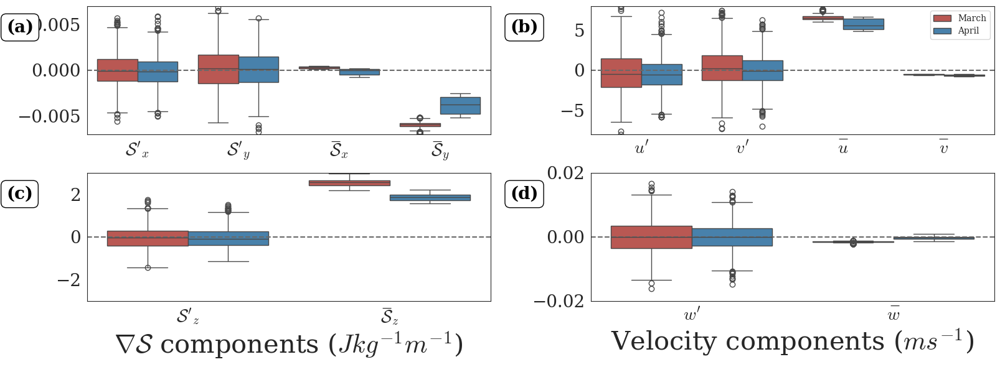

In [62]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':30, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': fontname,
}

fig,ax = plt.subplots(2,2,figsize=(16,6))
sns.boxplot(data = data1_melted, x='variable', y='value', hue='month', ax=ax[0,0], 
            palette=month_cmap, legend=None).tick_params(labelsize=20)
sns.boxplot(data = data2_melted, x='variable', y='value', hue='month', ax=ax[0,1], 
            palette=month_cmap, legend=True).tick_params(labelsize=20)
sns.boxplot(data = data3_melted, x='variable', y='value', hue='month', ax=ax[1,0], 
            palette=month_cmap, legend=None).tick_params(labelsize=20)
sns.boxplot(data = data4_melted, x='variable', y='value', hue='month', ax=ax[1,1], 
            palette=month_cmap, legend=None).tick_params(labelsize=20)

ax[0,1].legend(title='')

ax[0,0].set_ylim(-0.007, 0.007)
ax[0,1].set_ylim(-8, 8)
ax[1,0].set_ylim(-3, 3)
ax[1,1].set_ylim(-0.02, 0.02)

ax[1,0].set_xlabel(r'$\mathbf{\nabla} \mathcal{S}$ components ($J kg^{-1} m^{-1}$)')
ax[1,1].set_xlabel('Velocity components ($m s^{-1}$)')
ax[0,0].set_xlabel('')
ax[0,1].set_xlabel('')

for i in range(2):
    for j in range(2):
        ax[i,j].axhline(0, lw=1.5, ls='--', c='dimgray')
        ax[i,j].set_ylabel('')

        
props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')
ax[0,0].text(-.2, .9, '(a)', transform=ax[0,0].transAxes, fontsize=20, #fontname ='Liberation Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[0,1].text(-.2, .9, '(b)', transform=ax[0,1].transAxes, fontsize=20, #fontname ='Liberation Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1,0].text(-.2, .9, '(c)', transform=ax[1,0].transAxes, fontsize=20, #fontname ='Liberation Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1,1].text(-.2, .9, '(d)', transform=ax[1,1].transAxes, fontsize=20, #fontname ='Liberation Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')


fig.align_ylabels()
plt.tight_layout(w_pad = 3.5)

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Scales_only_Boxs.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [63]:
importlib.reload(variables) 
from variables import *

$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]


In [64]:
{'Mar':redcolor, 'Apr':bluecolor}

{'Mar': '#ca4842', 'Apr': '#3884bb'}

DejaVu Serif


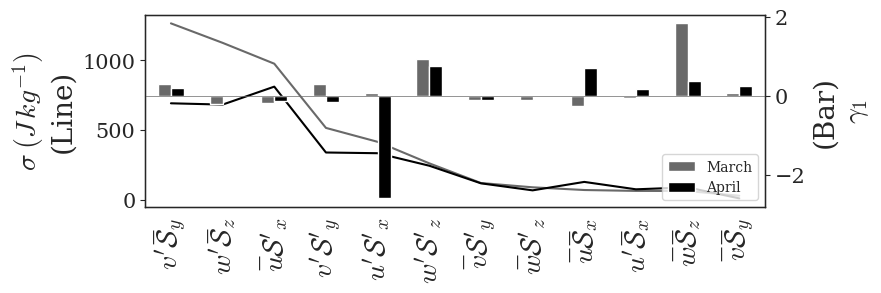

In [65]:
fontname = 'DejaVu Serif'
print(fontname)

params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'xtick.labelsize':20,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': fontname,
}

plt.rcParams.update(params)

df_dists_mar_apr = df_dists_mst[[s for s in df_dists_mst.columns if any([t in s for t in ['mar','apr','variable']])]].copy()
df_sigma = df_dists_mar_apr[[s for s in df_dists_mar_apr.columns if 'sd' in s]].rename({'sd_mar':'Mar', 'sd_apr':'Apr'}, axis=1)
df_sigma = df_sigma[['Mar','Apr']]
df_skew = df_dists_mar_apr[[s for s in df_dists_mar_apr.columns if 'skew' in s]]\
.rename({'skew_mar':'Mar', 'skew_apr':'Apr'}, axis=1)

fig,ax = plt.subplots(figsize=(8,2.5))
kind = 'line'

sct2 = df_sigma[['Mar']].plot(kind=kind, ax=ax, legend=False, ls='-', color='dimgray') # color = [redcolor, bluecolor]
sct2 = df_sigma[['Apr']].plot(kind=kind, ax=ax, legend=False, ls='-', color='black') # color = [redcolor, bluecolor]

ax.grid(False)  # Turn off grid

ax2 = ax.twinx()
kind = 'bar'
df_skew = df_skew[['Mar','Apr']]

skw2 = df_skew.plot(
    kind=kind, ax=ax2, **{'legend':False,'alpha':1}, 
#     color='dimgray', # hatch='/', 
    color = ['dimgray', 'black']
)

# Create custom legend handles
hatch_patch = mpatches.Patch(facecolor='dimgray', label="March")
normal_patch = mpatches.Patch(facecolor='black', label="April")

# Add legend manually
ax.legend(handles=[hatch_patch, normal_patch], title="", loc="lower right")

ax2.axhline(0, ls='-', c='dimgray', lw=.5)

border_thickness=1
# ax.set_facecolor('white')
ax.spines["top"].set_linewidth(border_thickness)
ax.spines["right"].set_linewidth(border_thickness)
ax.spines["bottom"].set_linewidth(border_thickness)
ax.spines["left"].set_linewidth(border_thickness)

# Customize border color
for spine in ax.spines.values():
    spine.set_color("black")

ax.set_ylabel('$\sigma\;(J\,kg^{-1})$\n(Line)')
xlabs = list(df_dists_mar_apr.variable)
ax.set_xticks(ticks = range(len(xlabs)), labels = xlabs, rotation=90)
ax2.set_ylabel('(Bar)\n$\gamma_1$', fontname = fontname)

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_RD_sd_skew.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## Primary contributions


In [29]:
df_apr = df_t1.loc[df_t1.month==4].copy()
df_mar = df_t1.loc[df_t1.month==3].copy()

data_apr = df_apr.adv_recon_2Dave
data_mar = df_mar.adv_recon_2Dave

df_apr['ql_y_z_sum'] = df_apr[y_main] + df_apr[z_main]
df_mar['ql_y_z_sum'] = df_mar[y_main] + df_mar[z_main]

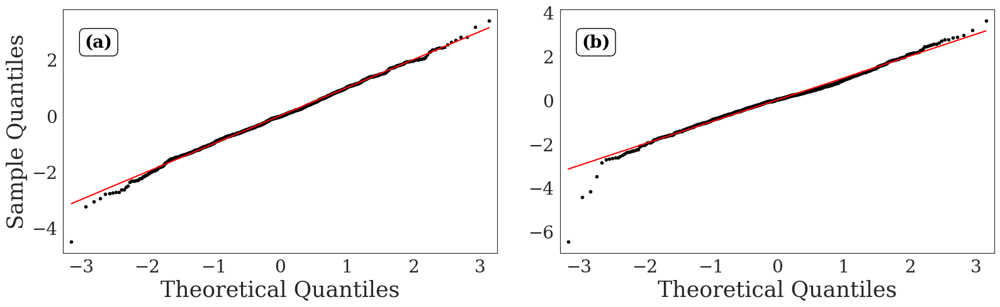

In [31]:
fontname = 'DejaVu Serif'
math_font = 'cm'

params = {
    'legend.fontsize': 15,
          'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':25, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': fontname,
    'mathtext.fontset': math_font,
    'axes.grid': False
#    'lines.markersize': 1,
}

plt.rcParams.update(params)
props = dict(boxstyle='round', facecolor='none', alpha=1, edgecolor='black')

import statsmodels.api as sm
fig,ax = plt.subplots(1,2,figsize=(16,5))
res0 = sm.qqplot(
    ((data_mar-data_mar.mean())/data_mar.std()), ax=ax[0], 
    line='s', markerfacecolor='black', markeredgecolor='k',markersize=3
)
res1 = sm.qqplot(
    ((data_apr-data_apr.mean())/data_apr.std()), ax=ax[1],
#     line='45', color='k'
    line='s', markerfacecolor='black', markeredgecolor='k',markersize=3
)
ax[1].set_ylabel('')

for i in range(2):
    ax[i].text(.05, .9, '({})'.format(chr(i+97)), transform=ax[i].transAxes, fontsize=20, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
#     ax[i].set_xlim(-6.5, 4)
#     ax[i].set_ylim(-6.5, 4)

fig.align_ylabels()
plt.tight_layout(w_pad = 3.5)

pdf_path = '/home/data/lab_hardik/Manuscript1/Supplem_qqplots.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

pylab.show()



# Primary tree

(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

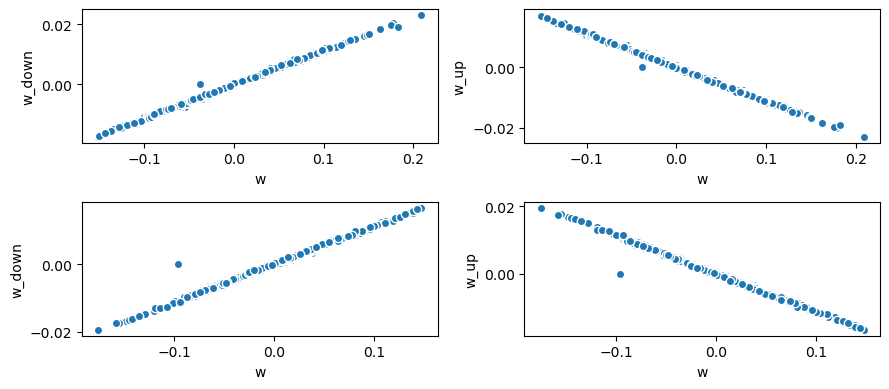

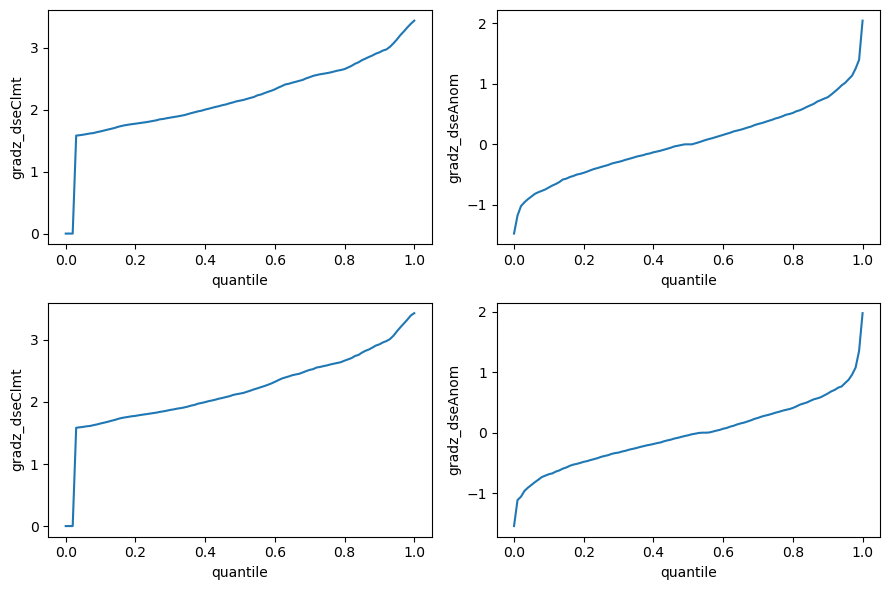

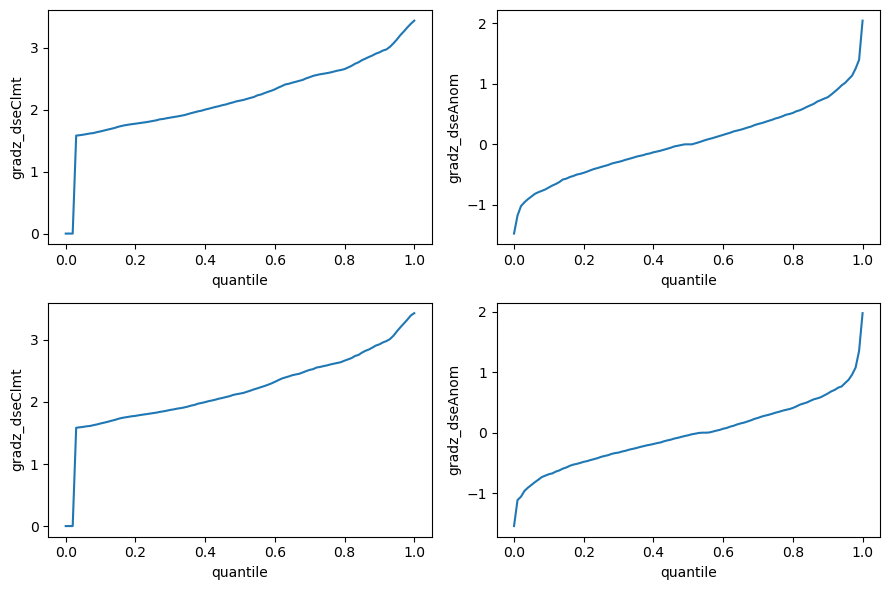

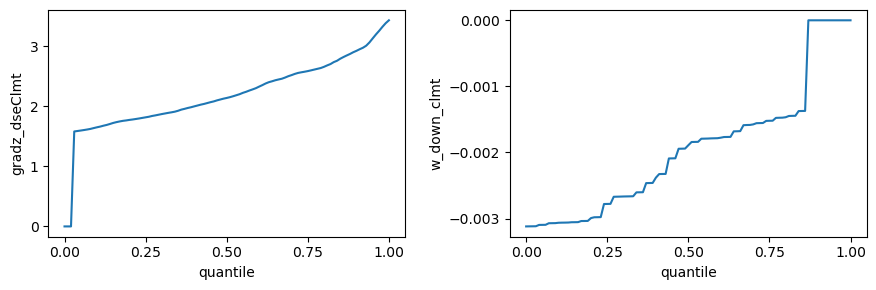

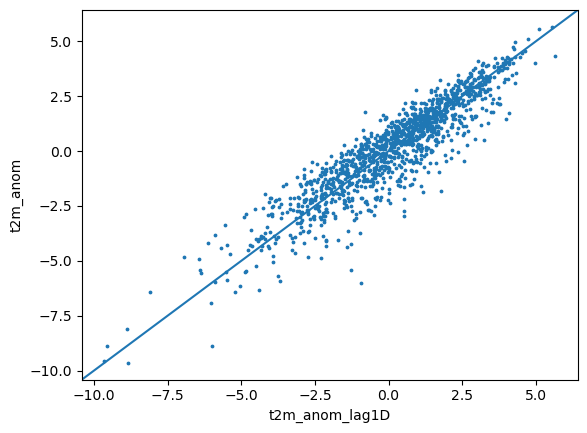

In [32]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *


In [33]:
df_mar = df_t1.loc[df_t1.month == 3].copy()
df_apr = df_t1.loc[df_t1.month == 4].copy()
df_mar_apr = df_t1.loc[df_t1.month.isin([3,4])].copy()
df_apr.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

## Apr Tree


In [34]:
mon_lst=[4]
print(mon_lst)


[4]


[0, 1, 2] [0.0, 0.33, 0.67, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    407
1    420
2    407
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-3877.6,-189.1]', 1: '(-189.1,259.8]', 2: '(259.8,2221.1]'}
['(-3877.6,-189.1]', '(-189.1,259.8]', '(259.8,2221.1]']
Index(['$w'$$\mathcal{S}̅_z$', '${u̅}$$\mathcal{S}'_x$',
       'adv_recon_2Dave_clss'],
      dtype='object')
Index(['$w'$$\mathcal{S}̅_z$', '${u̅}$$\mathcal{S}'_x$'], dtype='object')
mod accuracy score with criterion entropy: 0.6216
              precision    recall  f1-score   support

           0       0.80      0.54      0.65       407
           1       0.48      0.72      0.58       420
           2       0.74      0.60      0.66       407

    accuracy                           0.62      1234
   macro avg       0.67      0.62      0.63      1234
weighted avg       0.67      0.62      0.63      1234

[[221 171  15]
 [ 47 303  70]
 [  9 155 243]]
df_vi =                   var_name  imp
0    

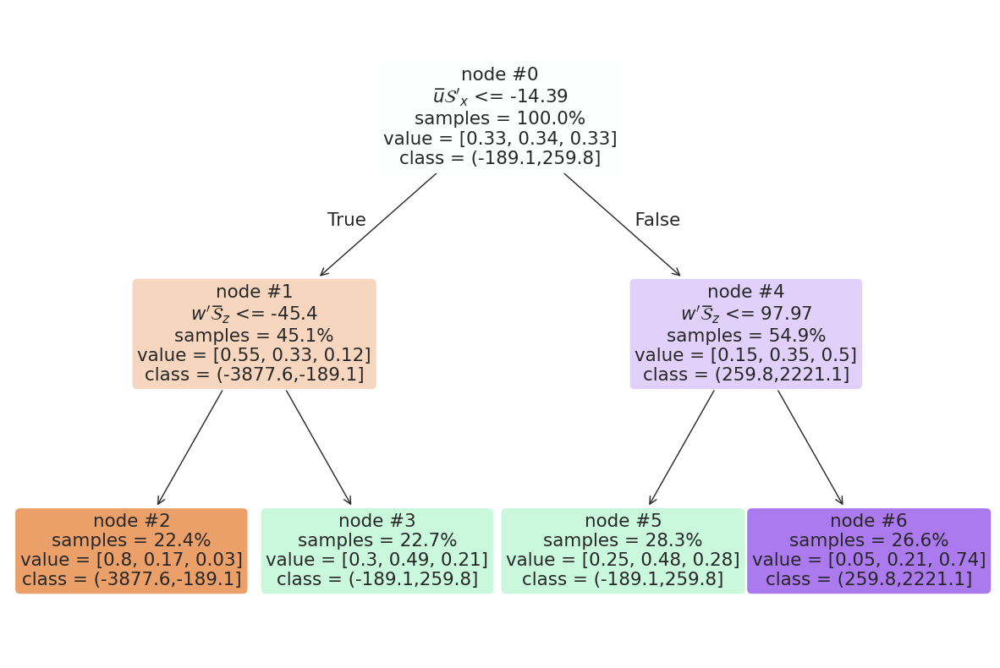

LL_dse_flxs_April_DSEdiff_3Cat_depth2_modified
mon_str = 4


In [35]:
import random

k = random.randint(0, 2**20)
# global df_vi

df_vi = pd.DataFrame()

dir_mods = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/mar_apr/' if any([s in mon_lst for s in [3,4]]) else \
'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/may_jun/' if any([s in mon_lst for s in [5,6]]) else np.nan
os.chdir(dir_mods)

df_to_use = 'df_t1'

# df = globals()[f'{df_to_use}'].dropna().copy()

# df_apr = df.loc[df.month.isin(mon_lst)].copy()
# df_apr['T1'] = df_apr[set_main].sum(axis=1)
# sec_terms =['T1']+ list(df_t2.columns[:3]) 

y_var = 'adv_recon_2Dave' if df_to_use in ['df_mst2', 'df_t1'] else 'adv_recon' if df_to_use == 'df_mst' else np.nan 

#     col_arr = [s for s in list(name_dict.values())[4:9] if y_var not in s] + ['NL_sum'] #  and 'w' not in s
#     col_arr = [s for s in list(name_dict.values())[:9] if y_var not in s] #  and 'w' not in s
#     col_arr = ['v\'_' + u's\u0305'] #  and 'w' not in s
#     y_var = 'w\'_' + u's\u0305' #coready_dse_del1

col_arr_apr = [set_main[1]] + [set_main[2]] #+ eddy_eddy #[:2] # + ['month'] # 
# col_arr_apr = set_main + eddy_eddy #[:2] # + ['month'] # 

df_apr2 = df_apr.copy()

X = df_apr2[col_arr_apr]
standardize = False

# X_iv, y_dv = X, y

# df_apr = df_apr.assign(y_var = ((df_apr[y_var] - df_apr[y_var].mean())/df_apr[y_var].std()).values)

if standardize == True:
    df_apr2.loc[:,y_var] = ((df_apr2[y_var] - df_apr2[y_var].mean())/df_apr2[y_var].std()).values
    X_iv = standardize_df(X)
else:
    X_iv = X.copy()

num_classes = 3

df_apr2, globals()[f'{y_var}_class_map_apr'] = create_classes(df_apr2, y_var = y_var, num_classes = num_classes)
y = df_apr2['{}_clss'.format(y_var)].copy()
y_dv = y

df_mod = pd.concat([X_iv, y_dv], axis=1)
# df_apr = df_apr.loc[df_mlr.coready_dse_del1>500]

labels_apr = list(globals()[f'{y_var}_class_map_apr'].values())
print(labels_apr)
print(df_mod.columns)

iv_list_apr, df_vi_apr, expected_y_apr, predicted_y_apr, x_train_apr, y_train_apr, tree_mod_apr = \
make_tree(
    df_iv = df_mod[col_arr_apr], 
    df_comb = df_mod,
    y_var = '{}_clss'.format(y_var),  
    month = '_'.join([month_map[key] for key in mon_lst]), 

    entropy_decrease_thresh=0.01, 
    ccp_alpha=0.01,
    min_samples= round(0.1*df_mod.shape[0]),
    min_samples_split = round(0.25*df_mod.shape[0]),

    precision = 2,
    depth_param=2, 
    fontsize=None,
    vert_lev_str_append='LL_dseChange' if y_var == 'coready_dse_del1' else \
    'LL_dse_flxs' if 'adv_recon' in y_var else np.nan,
    k = k, 
    num_classes=num_classes,
    rotation=False,
    labels = labels_apr, 
    dir_mods = dir_mods, 

    show_proportn = True,
    nodes_add_class = False, 
    nodes_add_samples = True,
    nodes_add_value = True,

    node_id_show = True, 

    testing='off',
    test_size=0.25,
    col_param=True,
    return_vimps = True,
         )
#     print('outside func', df_vi)

mon_str = '_'.join([str(key) for key in mon_lst])
print('mon_str =', mon_str)
globals()[f'df_vi_{mon_str}'] = df_vi.copy()
globals()[f'df_vi_{mon_str}']['month'] = mon_lst[0]


In [36]:
df_apr.rename(columns = name_dict_final, inplace=True)
print(df_apr.columns)


Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

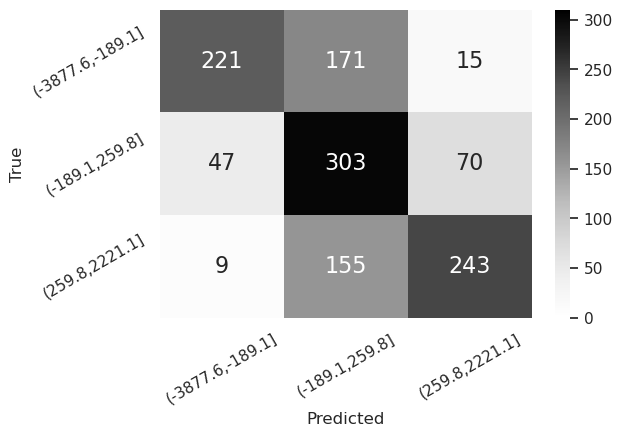

In [37]:
import seaborn as sn
sn.set(font_scale=1) # for label size

df_htmp = pd.DataFrame(confusion_matrix(expected_y_apr, predicted_y_apr))\
.rename(
    index= dict(zip(range(len(labels_apr)), labels_apr)), 
    columns= dict(zip(range(len(labels_apr)), labels_apr))
)

# cmap = sn.cm.rocket_r
cmap = 'Greys'
fig, ax = plt.subplots(figsize= (6,4))
sn.heatmap(df_htmp, annot=True, annot_kws={"size": 16}, cmap=cmap, fmt='g',ax=ax, vmin=0, vmax=310) # font size
plt.yticks(rotation=30)
plt.xticks(rotation=30)
plt.ylabel('True')
plt.xlabel('Predicted')

plt.show()


In [38]:
expected_y_apr

[2, 2, 2, 1, 2, ..., 2, 2, 1, 1, 2]
Length: 1234
Categories (3, int64): [0 < 1 < 2]

In [39]:
import cairosvg
import IPython.display as display

In [40]:
dict(zip([str(s) for s in adv_recon_2Dave_class_map_apr.values()], ['#FF0000', '#00FF00', '#0000FF']))

{'(-3877.6,-189.1]': '#FF0000',
 '(-189.1,259.8]': '#00FF00',
 '(259.8,2221.1]': '#0000FF'}

In [41]:
dtreeviz.colors.YELLOW = '#0000FF'

In [42]:
import matplotlib.font_manager
available_fonts = sorted([f.name for f in matplotlib.font_manager.fontManager.ttflist])
print(available_fonts[:10])


['Abyssinica SIL', 'Ani', 'AnjaliOldLipi', 'Bitstream Vera Sans', 'Bitstream Vera Sans', 'Bitstream Vera Sans', 'Bitstream Vera Sans', 'Bitstream Vera Sans Mono', 'Bitstream Vera Sans Mono', 'Bitstream Vera Sans Mono']


In [43]:
adv_recon_2Dave_class_map_apr[0] = 'Negative: ' + adv_recon_2Dave_class_map_apr[0]
adv_recon_2Dave_class_map_apr[1] = 'Neutral: ' + adv_recon_2Dave_class_map_apr[1]
adv_recon_2Dave_class_map_apr[2] = 'Positive: ' + adv_recon_2Dave_class_map_apr[2]

adv_recon_2Dave_class_map_apr.values()


dict_values(['Negative: (-3877.6,-189.1]', 'Neutral: (-189.1,259.8]', 'Positive: (259.8,2221.1]'])

In [44]:
from dtreeviz import colors
from dtreeviz.colors import *
from io import BytesIO

In [45]:
## This changes class colors 
color_blind_friendly_colors[3] = [bluecolor, grey, redcolor]


In [46]:
# import matplotlib as mpl
# # print(mpl.get_cachedir())
# from matplotlib import font_manager as fm
# print([f.split('/')[-1] for f in fm.findSystemFonts()])


In [47]:
# col_arr_apr
[s.replace("\u2212", "-") for s in col_arr_apr]

["$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]

In [48]:
adv_recon_2Dave_class_map_apr

{0: 'Negative: (-3877.6,-189.1]',
 1: 'Neutral: (-189.1,259.8]',
 2: 'Positive: (259.8,2221.1]'}

In [49]:
# import matplotlib.font_manager
# available_fonts = sorted([f.name for f in matplotlib.font_manager.fontManager.ttflist])
# print(available_fonts)


In [50]:
os.getcwd()

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/mar_apr'

In [51]:
mpl.rcParams['mathtext.fontset'] = 'cm'
mpl.rcParams['mathtext.rm'] = 'cmr10'
mpl.rcParams['mathtext.default'] = 'it'
plt.rcParams['font.family'] = 'DejaVu Serif'

# dtreeviz.colors.COLORS['tick_label'] = GREY

viz_apr = dtreeviz.model(
    tree_mod_apr, 
    x_train_apr, 
    y_train_apr, 
    target_name='Tercile based Classes\n of Standardized $\delta \mathcal{S}$',
    feature_names=col_arr_apr,
#     feature_names=[s.replace("\u2212", "-") for s in col_arr_apr],
    class_names=adv_recon_2Dave_class_map_apr,
)

# instance = X.iloc[10]
# path = clf.decision_path([instance]).indices
# viz_apr.view(path)

v_apr = viz_apr.view(scale=1.8, 
             precision=1,
             label_fontsize=18, 
             ticks_fontsize=16, 
#              title_fontsize=20,
             leaftype= 'pie', #'barh', 
             histtype='barstacked', 
             fontname='serif',
#              colors=dict(zip([str(s) for s in adv_recon_2Dave_class_map.values()], ['#FF0000', '#00FF00', '#0000FF'])),
#              colors={'classes': ['#FF0000', '#00FF00', '#0000FF']},
             orientation='TD',
             show_root_edge_labels=True,
             show_node_labels=True,
#              highlight_path= [2,3]
#              x= x_train[0], #['Node 0', 'Node 8', 'Node 9'], 
#              show_just_path=1
#              depth_range_to_display = range(0,6)
            )

with open("tree_raw.svg", "w") as f:
    f.write(v_apr.svg())

p_apr = cairosvg.svg2png(v_apr.svg().encode(), scale=2)
# display.Image(p, retina=True) # this used to be the command for plotting 

# Use BytesIO to handle the byte stream 
image_stream_apr = BytesIO(p_apr)
image_apr = plt.imread(image_stream_apr, format='png') 

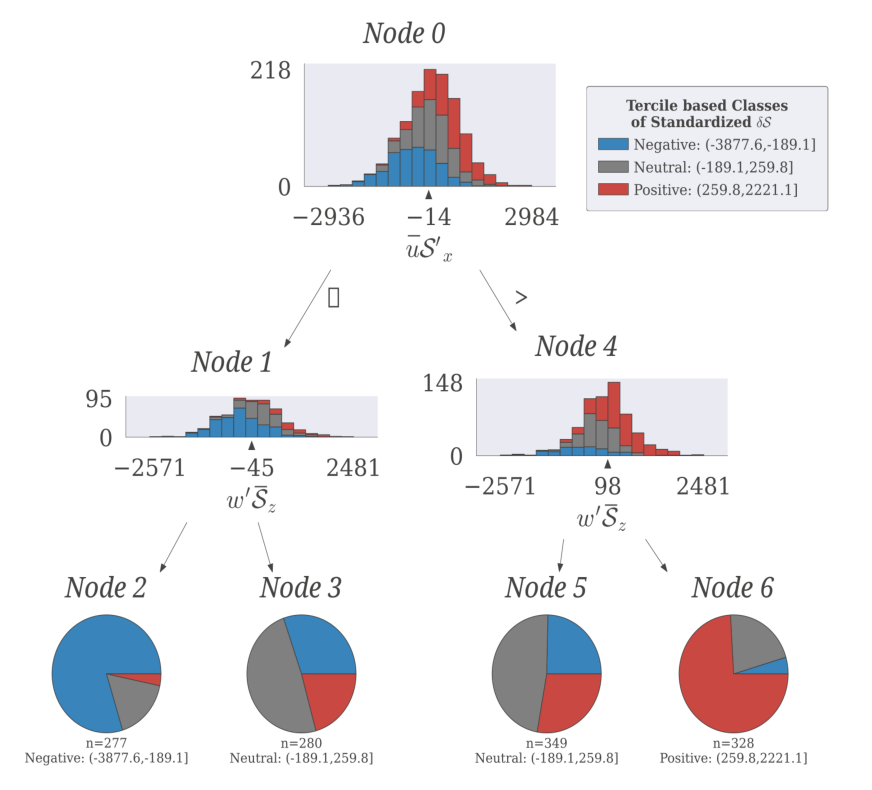

In [52]:

# Create a matplotlib figure 
fig, ax = plt.subplots(figsize=(11, 10)) 
ax.imshow(image_apr, aspect='auto') 
ax.axis('off') 

pdf_path = '/home/data/lab_hardik/Manuscript1/Apr_prim_dt_viz.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

plt.show()

## Combined Mar-Apr Tree

In [53]:
importlib.reload(variables)
from variables import *

$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]


In [54]:
# tst = xr.open_dataset("/home/data/lab_hardik/data/ERA5/daily_means/u_component_of_wind/data/era5_u_component_of_wind_2009_3_23.nc")
# tst

In [55]:
importlib.reload(custom_funcs)
from custom_funcs import *

[3, 4]
[0, 1, 2] [0.0, 0.33, 0.67, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    1431
1    1474
2    1431
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-7.4,-0.4]', 1: '(-0.4,0.4]', 2: '(0.4,3.6]'}
['(-7.4,-0.4]', '(-0.4,0.4]', '(0.4,3.6]']
Index(['$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '$u'$$\mathcal{S}'_x$',
       '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$', 'adv_recon_2Dave_clss'],
      dtype='object')
Index(['$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '$u'$$\mathcal{S}'_x$',
       '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$'],
      dtype='object')
mod accuracy score with criterion entropy: 0.5664
              precision    recall  f1-score   support

           0       0.75      0.50      0.60      1431
           1       0.43      0.70      0.53      1474
           2       0.72      0.49      0.58      1431

    accuracy                           0.57      4336

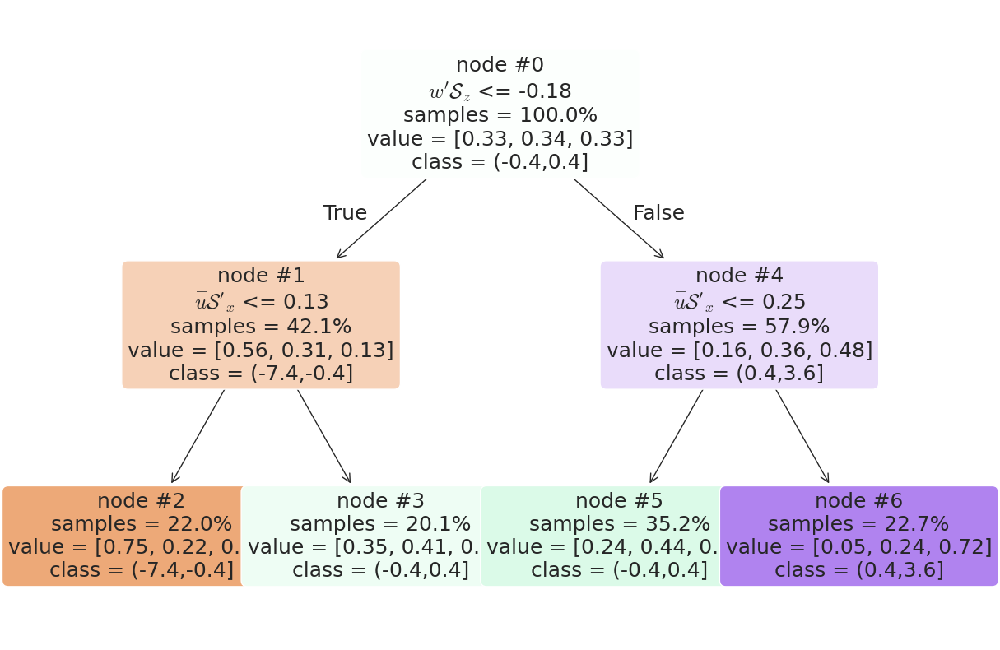

nan_March_April_DSEdiff_3Cat_depth3_modified
mon_str = 3_4


In [56]:
import random

k = random.randint(0, 2**20)
# global df_vi

# for mon in [3]:
df_vi = pd.DataFrame()
mon_lst=[3,4]
print(mon_lst)

dir_mods = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/mar_apr/' if any([s in mon_lst for s in [3,4]]) else \
'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/may_jun/' if any([s in mon_lst for s in [5,6]]) else np.nan
os.chdir(dir_mods)

df_to_use = 'df_t1'
df = globals()[f'{df_to_use}'].copy()
# df = globals()[f'{df_to_use}'].dropna().copy()

y_var = 'adv_recon_2Dave'
  
col_arr_mar_apr = set_main + eddy_eddy

X = df[col_arr_mar_apr]

standardize = True
if standardize == True:
    vars_to_standardize = col_arr_mar_apr + [y_var]
    df[vars_to_standardize] = df.groupby('month')[vars_to_standardize].transform(
        lambda x: (x - x.mean()) / x.std()
    )
    X_iv = df[col_arr_mar_apr].copy()
#     df.loc[:,y_var] = ((df[y_var] - df_mar_apr[y_var].mean())/df_mar_apr[y_var].std()).values
#     X_iv = standardize_df(X)
else:
    X_iv = X.copy()

num_classes = 3

df, globals()[f'{y_var}_class_map_mar_apr'] = create_classes(df, y_var = y_var, num_classes = num_classes)

y = df['{}_clss'.format(y_var)].copy()
y_dv = y

df_mod = pd.concat([X_iv,y_dv], axis=1)

labels = list(globals()[f'{y_var}_class_map_mar_apr'].values())
print(labels)
print(df_mod.columns)

iv_list_mar_apr, df_vi_mar_apr, expected_y_mar_apr, predicted_y_mar_apr, x_train_mar_apr, y_train_mar_apr, tree_mod_mar_apr = \
make_tree(
    df_iv = df_mod[col_arr_mar_apr], 
    df_comb = df_mod,
    y_var = '{}_clss'.format(y_var),  
    month = '_'.join([month_map[key] for key in mon_lst]), 

    entropy_decrease_thresh=0.03, 
    ccp_alpha=0.03,
    min_samples= round(0.2*df_mod.shape[0]),
    min_samples_split = round(0.4*df_mod.shape[0]),
    
    precision = 2,
    depth_param=3, 
    
    fontsize=18,
    vert_lev_str_append='LL_dseChange' if y_var == 'coready_dse_del1' else \
    'LL_dse_flxs' if y_var == 'adv_recon' else np.nan, 
    k = k, 
    num_classes=num_classes,
    rotation=False,
    labels = labels, 
    dir_mods = dir_mods, 

    show_proportn = True,
    nodes_add_class=False, 
    nodes_add_samples=True,
    nodes_add_value=True,

    node_id_show=True,

    testing='off',
    test_size=0.25,
    col_param=True,
    return_vimps = True,
         )

#     print('outside func', df_vi)

mon_str = '_'.join([str(key) for key in mon_lst])
print('mon_str =', mon_str)
globals()[f'df_vi_{mon_str}'] = df_vi.copy()
globals()[f'df_vi_{mon_str}']['month'] = mon_lst[0]


In [57]:

adv_recon_2Dave_class_map_mar_apr[0] = 'Negative: ' + adv_recon_2Dave_class_map_mar_apr[0]
adv_recon_2Dave_class_map_mar_apr[1] = 'Neutral: ' + adv_recon_2Dave_class_map_mar_apr[1]
adv_recon_2Dave_class_map_mar_apr[2] = 'Positive: ' + adv_recon_2Dave_class_map_mar_apr[2]

adv_recon_2Dave_class_map_mar_apr.values()

dict_values(['Negative: (-7.4,-0.4]', 'Neutral: (-0.4,0.4]', 'Positive: (0.4,3.6]'])

In [58]:
mpl.rcParams['mathtext.fontset'] = 'cm'
mpl.rcParams['mathtext.rm'] = 'cmr10'
mpl.rcParams['mathtext.default'] = 'it'

viz_mar_apr = dtreeviz.model(
    tree_mod_mar_apr, 
    x_train_mar_apr, 
    y_train_mar_apr, 
    target_name='$\mathbf{\delta \mathcal{S}}$ Classes',
    feature_names=col_arr_mar_apr,
    class_names=adv_recon_2Dave_class_map_mar_apr,
)

v_mar_apr = viz_mar_apr.view(
    scale=1.8, 
    label_fontsize=16, 
    ticks_fontsize=12, 
    leaftype= 'pie', #'barh', 
    histtype='barstacked', 
    fontname='DejaVu Serif',
#              colors=dict(zip([str(s) for s in adv_recon_2Dave_class_map.values()], ['#FF0000', '#00FF00', '#0000FF'])),             
    orientation='TD',
    show_root_edge_labels=True,
    show_node_labels=True,
#              highlight_path= [3,7,10,14]
#              x= x_train[0], #['Node 0', 'Node 8', 'Node 9'], 
#              show_just_path=2
#              depth_range_to_display = range(0,6)
)

# Convert dtreeviz output to SVG string
# Export for removing node labels
svg_text = v_mar_apr.svg()
with open("/home/data/lab_hardik/Manuscript1/mar_apr_comb_tree_raw.svg", "w") as f:
    f.write(v_mar_apr.svg())


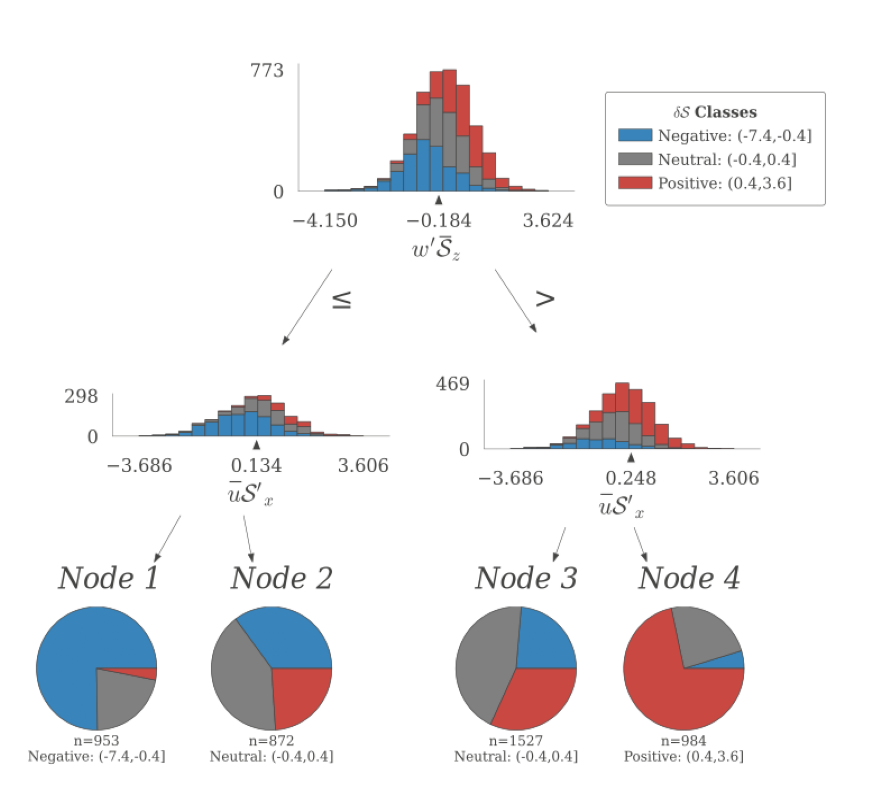

In [59]:
# v_apr = 
file = "treated_mar_apr_comb_tree_raw" # "NoClasslabs_mar_apr_comb_tree_raw_shortlegendlab"

with open(f"/home/data/lab_hardik/Manuscript1/{file}.svg", "r") as f:
    svg_text = f.read()

# Modify the SVG to update legend's font size
svg_text = svg_text.replace('class="legend"', 'class="legend" style="font-size:50pt;"')  # Adjust the legend font size

# Render the updated SVG using Matplotlib
from PIL import Image
import cairosvg
from io import BytesIO

# Convert SVG to PNG
p_mar_apr = cairosvg.svg2png(bytestring=svg_text.encode('utf-8'))
# p_mar_apr = cairosvg.svg2png(v_mar_apr.svg().encode(), scale=2)
# display.Image(p, retina=True)

# Use BytesIO to handle the byte stream 
image_stream_mar_apr = BytesIO(p_mar_apr)
image_mar_apr = plt.imread(image_stream_mar_apr, format='png') 

# Create a matplotlib figure 
fig, ax = plt.subplots(figsize=(11, 10)) 
ax.imshow(image_mar_apr, aspect='auto') 
ax.axis('off') 
# Add the index at the left top of the plot 
# props = dict(boxstyle='round', facecolor='none', alpha=0.5, edgecolor='black')
# ax.text(0, 1, 'a)', transform=ax.transAxes, fontsize=16, fontname ='Liberation Serif', verticalalignment='top', 
#         c=GREY, bbox=props)


pdf_path = '/home/data/lab_hardik/Manuscript1/Comb_Mar_Apr_prim_dt_viz.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

plt.show()

In [27]:
from pylab import *


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl


from matplotlib.colors import ListedColormap

In [60]:
ncat = 3

grey_sctr_rgba = [0.6,0.6,0.6,1]

df_plt_apr = df_apr[[x_main,y_main,z_main, 'T_main','NL_sum','adv_recon_2Dave']].copy()
df_plt_mar = df_mar[[x_main,y_main,z_main, 'T_main','NL_sum','adv_recon_2Dave']].copy()
df_plt_mar_apr = df_mar_apr[[x_main,y_main,z_main, 'T_main','NL_sum','adv_recon_2Dave']].copy()

cvar_prim = z_main
# interval_arr = [-2500, -850, -150, 150, 850, 2500] if cvar==z_main else [-3000, -300, 300, 3000] if cvar=='adv_recon' else np.nan
interval_arr_apr = df_plt_apr[cvar_prim].quantile(np.linspace(0,1,ncat+1)).round().astype(int).values
interval_arr_apr = np.round(interval_arr_apr/100)*100
cmap_apr0 = plt.get_cmap('coolwarm', ncat)
colors = cmap_apr0(np.linspace(0, 1, 3))
colors[1] = grey_sctr_rgba
cmap_apr = ListedColormap(colors)
norm_apr = mpl.colors.BoundaryNorm(interval_arr_apr, cmap_apr.N) 
# ticks_arr = [-2.5, -0.55, 0, .55, 2.5] if cvar==z_main else [-1650, 0, 1650] if cvar=='adv_recon_2Dave' else np.nan
    
# cvar_prim = z_main
# # interval_arr_mar = [-4000, -1500, -300, 300, 1500, 4000] if cvar_prim==z_main else [-3000, -300, 300, 3000] if cvar_prim=='adv_recon' else np.nan
# interval_arr_mar = df_plt_mar[cvar_prim].quantile(np.linspace(0,1,ncat+1)).round().astype(int).values
# interval_arr_mar = np.round(interval_arr_mar/100)*100
# cmap_mar = plt.get_cmap('coolwarm', ncat)
# cmap_mar0 = plt.get_cmap('coolwarm', ncat)
# colors = cmap_mar0(np.linspace(0, 1, 3))
# colors[1] = grey_sctr_rgba
# cmap_mar = ListedColormap(colors)
# norm_mar = mpl.colors.BoundaryNorm(interval_arr_mar, cmap_mar.N)

cvar_prim = z_main
# interval_arr_mar_apr = [-4000, -1500, -300, 300, 1500, 4000] if cvar_prim==z_main else [-3000, -300, 300, 3000] if cvar_prim=='adv_recon' else np.nan
interval_arr_mar_apr = df_plt_mar_apr[cvar_prim].quantile(np.linspace(0,1,ncat+1)).round().astype(int).values
interval_arr_mar_apr = np.round(interval_arr_mar_apr/100)*100
cmap_mar_apr = plt.get_cmap('coolwarm', ncat)
cmap_mar_apr0 = plt.get_cmap('coolwarm', ncat)
colors = cmap_mar_apr0(np.linspace(0, 1, 3))
colors[1] = grey_sctr_rgba
cmap_mar_apr = ListedColormap(colors)
norm_mar_apr = mpl.colors.BoundaryNorm(interval_arr_mar_apr, cmap_mar_apr.N)


In [61]:
cmap_mar_apr.colors

array([[0.2298057 , 0.29871797, 0.75368315, 1.        ],
       [0.6       , 0.6       , 0.6       , 1.        ],
       [0.70567316, 0.01555616, 0.15023281, 1.        ]])

# Variant 1

In [62]:
# border_thickness = 2
# ax1.spines["top"].set_linewidth(border_thickness)
# ax1.spines["right"].set_linewidth(border_thickness)
# ax1.spines["bottom"].set_linewidth(border_thickness)
# ax1.spines["left"].set_linewidth(border_thickness)
# # Optional: Customize border color
# for spine in ax1.spines.values():
#     spine.set_color("black")




In [63]:
mpl.rcParams['text.usetex'] = False

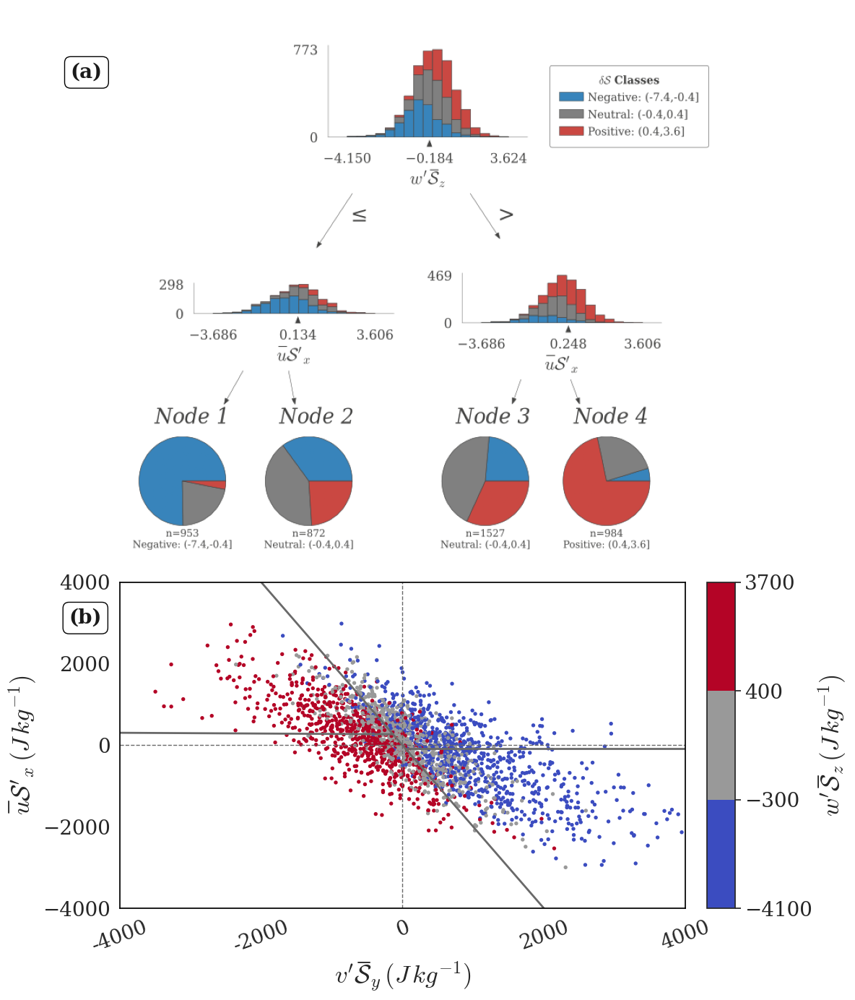

In [75]:
fontname = 'DejaVu Serif'
params = {
    'legend.fontsize': 15,
          'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':25, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': fontname,
#    'lines.markersize': 1,
}

plt.rcParams.update(params)

# Define the overall figure size
fig = plt.figure(figsize=(12, 14))  # Adjust the total size

# Create a GridSpec with 2 rows and 2 columns
gs = gridspec.GridSpec(2, 1, width_ratios=[1], height_ratios=[1, 1/1.7])

# First row plots with size (11, 10)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])

# In a GridSpec layout, it's tricky to assign individual sizes to subplots directly.
# Instead, we manage their relative ratios affecting the overall figure aspect.

ax1.imshow(image_mar_apr, aspect='auto') 
ax1.axis('off') 
ax1.set_xticks([])
ax1.set_yticks([])
ptsize = 15
pt_edgethick = 0

df_plt_mar_apr.plot.scatter(
    x=y_main, y=x_main, s=ptsize, 
    c= cvar_prim,
    linewidths=pt_edgethick, 
    edgecolor='k',
    cmap=cmap_mar_apr, colorbar=False,
    norm = norm_mar_apr, 
    ax=ax2, 
)

# Create a divider for the existing axes instance 
divider = make_axes_locatable(ax2)
# Append axes to the bottom of ax, with 5% height of ax 
cax = divider.append_axes("right", size="5%", pad=0.3) 

# Add colorbar and set it to the bottom 
cbar = fig.colorbar(ax2.collections[0], cax=cax, orientation='vertical') 
cbar.set_label(z_main + '$\,(J\,kg^{-1})$')


ax2.set_facecolor("white")
# ax2.set_border('black')

ax2.set_xlim([-4000,4000])
ax2.set_ylim([-4000,4000])
ax2.set_xlabel(y_main + '$\,(J\,kg^{-1})$', fontname='DejaVu Serif')
ax2.set_ylabel(x_main + '$\,(J\,kg^{-1})$', fontname='DejaVu Serif')

ax2.axhline(0, c='dimgrey', ls='--', lw=1)
ax2.axvline(0, c='dimgrey', ls='--', lw=1)
# ax2.axline((0,0), slope=-2, c='dimgray', ls='--', lw=1)
ax2.axline((0,0), slope=-2, c='dimgray', ls='-', lw=2)

ax2.set_xticks(np.linspace(-4000, 4000, 5))
ax2.set_yticks(np.linspace(-4000, 4000, 5))
ax2.set_xticklabels([int(s) for s in ax2.get_xticks()], rotation = 20)

ax2.hlines(y=-0.1*df_plt_mar_apr[x_main].std(), xmin = 0.05*df_plt_mar_apr[y_main].std() , xmax=4*df_plt_mar_apr[y_main].std(), color='dimgray', lw=2)
ax2.plot((-4*df_plt_mar_apr[y_main].std(), -0.15*df_plt_mar_apr[x_main].std()), (0.3*df_plt_mar_apr[y_main].std(),0.3*df_plt_mar_apr[x_main].std()), c='dimgray', lw=2)

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black',)
annot_size = 14

# ax2.text(0.05, 0.94, 'Node 4\nP(Positive)=0.75', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
# ax2.text(0.74, 0.15, 'Node 1\nP(Negative)=0.75', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
# ax2.text(0.74, 0.94, 'Node 2\nP(Neutral)=0.5', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
# ax2.text(0.05, 0.2, 'Node 3\nP(Neutral)=0.5', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)

# annot_size = 12
# ax2.text(0.3, 0.3, 'Neutral2', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)
# ax2.text(.64, 0.74, 'Neutral2', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)
# ax2.text(0.34, 0.94, 'Neutral1', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)
# ax2.text(.53, 0.17, 'Neutral1', transform=ax2.transAxes, 
#         fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)

ax2.grid(False)
# for ax in axes:
#     ax2.tick_params(color='green', labelcolor='green')
for spine in ax2.spines.values():
    spine.set_edgecolor('black')

ax2.xaxis.set_tick_params(which='both', width=1, color='black') 
ax2.yaxis.set_tick_params(which='both', width=1, color='black') 

base_size = 20
ax1.text(-.08, .9, '(a)', transform=ax1.transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax2.text(-.09, .92, '(b)', transform=ax2.transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_prim_mech_mar_apr.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

plt.show()


Text(0.5, 1.0, 'April')

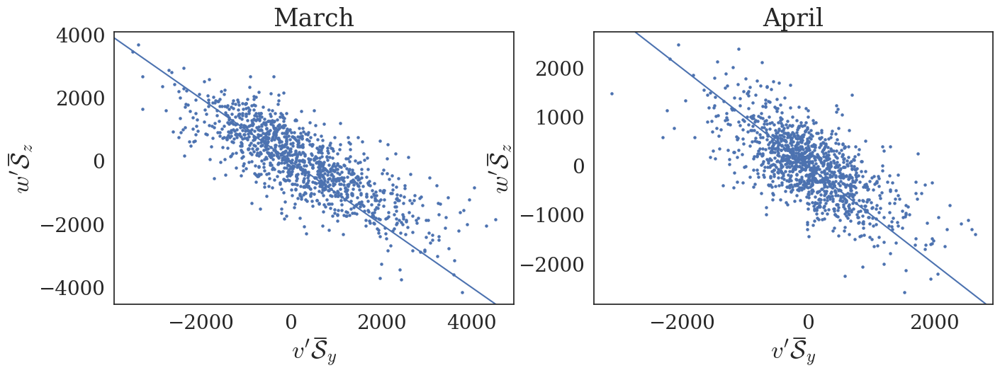

In [65]:
fig,ax = plt.subplots(1,2,figsize=(16,5))
df_plt_mar.plot.scatter(x = y_main, y = z_main, s=5, ax=ax[0])
ax[0].axline((0,0), slope=-1)
ax[0].set_title('March')

df_plt_apr.plot.scatter(x = y_main, y = z_main, s=5, ax=ax[1])
ax[1].axline((0,0), slope=-1)
ax[1].set_title('April')

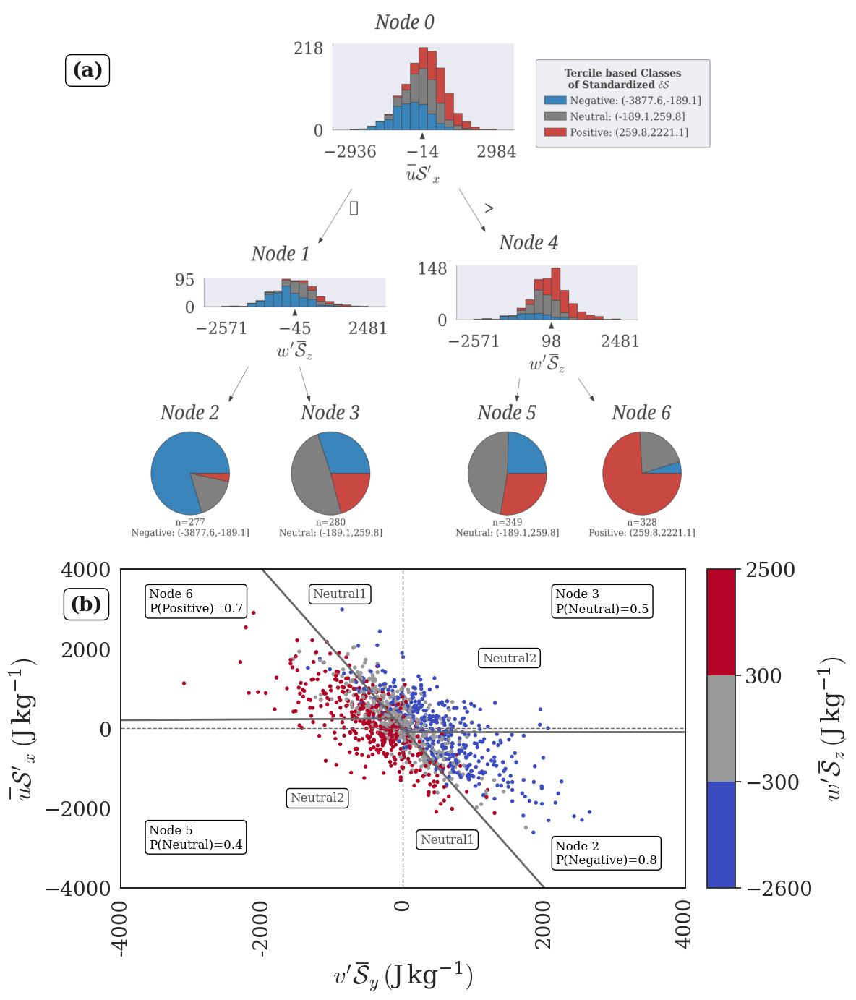

In [66]:
# Define the overall figure size
fig = plt.figure(figsize=(12, 14))  # Adjust the total size

import matplotlib.gridspec as gridspec
# Create a GridSpec with 2 rows and 2 columns
gs = gridspec.GridSpec(2, 1, width_ratios=[1], height_ratios=[1, 1/1.7])

# First row plots with size (11, 10)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])

# In a GridSpec layout, it's tricky to assign individual sizes to subplots directly.
# Instead, we manage their relative ratios affecting the overall figure aspect.

# Example data for plotting
# ax1.plot([0, 1, 2], [0, 1, 0])
ax1.imshow(image_apr, aspect='auto') 
ax1.axis('off') 

# ax2.plot([0, 1, 2], [1, 2, 1])
df_plt_apr.plot.scatter(
    x=y_main, y=x_main, ax=ax2, c= cvar_prim, s=ptsize, 
    linewidths=pt_edgethick, edgecolor='k',
    cmap=cmap_apr, colorbar=False,
    norm = norm_apr
)

# Create a divider for the existing axes instance 
divider = make_axes_locatable(ax2)
# Append axes to the bottom of ax, with 5% height of ax 
cax = divider.append_axes("right", size="5%", pad=0.3) 

# Add colorbar and set it to the bottom 
cbar = fig.colorbar(ax2.collections[0], cax=cax, orientation='vertical') 
cbar.set_label(z_main + '$\,(\mathregular{J\,kg^{-1}})$', fontname='DejaVu Serif')

ax2.set_facecolor("white")
# ax2.set_border('black')
ax2.set_xlim([-4000,4000])
ax2.set_ylim([-4000,4000])
ax2.set_xlabel(y_main + '$\,(\mathregular{J\,kg^{-1}})$', fontname='DejaVu Serif')
ax2.set_ylabel(x_main + '$\,(\mathregular{J\,kg^{-1}})$', fontname='DejaVu Serif')

ax2.axhline(0, c='dimgrey', ls='--', lw=1)
ax2.axvline(0, c='dimgrey', ls='--', lw=1)
# ax2.axline((0,0), slope=-2, c='dimgray', ls='--', lw=1)
ax2.axline((0,0), slope=-2, c='dimgray', ls='-', lw=2)

ax2.set_xticks(np.linspace(-4000, 4000, 5))
ax2.set_yticks(np.linspace(-4000, 4000, 5))
ax2.set_xticklabels([int(s) for s in ax2.get_xticks()], rotation = 90)

ax2.hlines(y=-0.1*df_plt_apr[x_main].std(), 
           xmin = 0.05*df_plt_apr[y_main].std(), 
           xmax=4000, color='dimgray', lw=2)

ax2.plot((-4000, -0.15*df_plt_apr[x_main].std()), 
         (0.3*df_plt_apr[y_main].std(),0.3*df_plt_apr[x_main].std()), c='dimgray', lw=2)

ax2.text(0.05, 0.94, 'Node 6\nP(Positive)=0.7', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
ax2.text(0.77, 0.15, 'Node 2\nP(Negative)=0.8', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
ax2.text(0.77, 0.94, 'Node 3\nP(Neutral)=0.5', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
ax2.text(0.05, 0.2, 'Node 5\nP(Neutral)=0.4', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', bbox=props)
ax2.text(0.3, 0.3, 'Neutral2', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)
ax2.text(.64, 0.74, 'Neutral2', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)

ax2.text(0.34, 0.94, 'Neutral1', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)
ax2.text(.53, 0.17, 'Neutral1', transform=ax2.transAxes, 
        fontsize=annot_size, fontname =fontname, verticalalignment='top', c='black', alpha=0.7, bbox=props)

ax2.grid(False)
# for ax in axes:
#     ax2.tick_params(color='green', labelcolor='green')
for spine in ax2.spines.values():
    spine.set_edgecolor('black')

ax2.xaxis.set_tick_params(which='both', width=1, color='black') 
ax2.yaxis.set_tick_params(which='both', width=1, color='black') 

base_size = 20
ax1.text(-.08, .9, '(a)', transform=ax1.transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax2.text(-.09, .92, '(b)', transform=ax2.transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_prim_mech_Apr.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

plt.show()

/tmp/ipykernel_1110259/3613840369.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


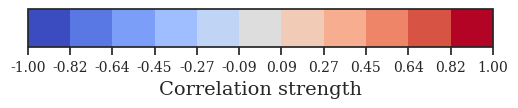

In [73]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import BoundaryNorm
from matplotlib.colorbar import ColorbarBase
from matplotlib import cm

# Define the boundaries and colormap
bounds = np.linspace(-1, 1, 12)  # 11 intervals → 12 boundaries
cmap = cm.get_cmap('coolwarm', len(bounds) - 1)
norm = BoundaryNorm(boundaries=bounds, ncolors=cmap.N)

# Create the colorbar
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cbar = ColorbarBase(ax, cmap=cmap, norm=norm,
                    boundaries=bounds, ticks=bounds,
                    spacing='proportional', orientation='horizontal')
cbar.set_label('Correlation strength', fontsize=14)
ax.set_xticklabels([f'{b:.2f}' for b in bounds], rotation=0, fontsize=10)

plt.show()

In [599]:
# import matplotlib.font_manager as fm

# # Get a list of font names
# font_names = sorted([f.name for f in fm.fontManager.ttflist])

# # Print the font names
# for font_name in font_names:
#     print(font_name)

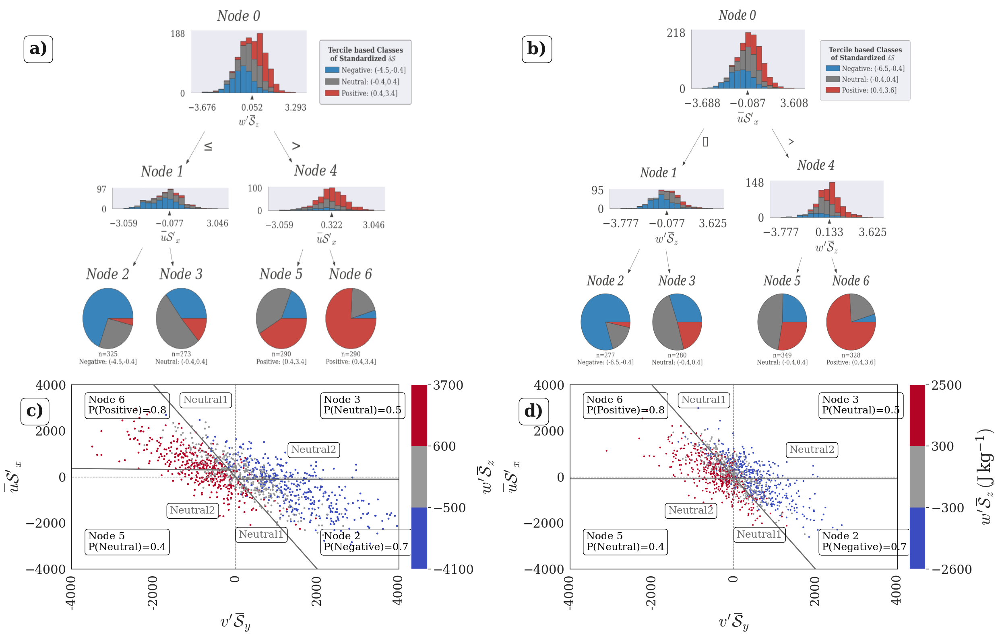

In [226]:
params = {
    'legend.fontsize': 15,
          'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':30, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':30, # pot title size
         'xtick.labelsize':22,
         'ytick.labelsize':22, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': 'DejaVu Serif',
#    'lines.markersize': 1,
}

plt.rcParams.update(params)
props = dict(boxstyle='round', facecolor='none', alpha=1, edgecolor='black')

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the overall figure size
fig = plt.figure(figsize=(25, 16))  # Adjust the total size

# Create a GridSpec with 2 rows and 2 columns
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], height_ratios=[1, 6/12])

# First row plots with size (11, 10)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Second row plots with size (9, 6)
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])

# In a GridSpec layout, it's tricky to assign individual sizes to subplots directly.
# Instead, we manage their relative ratios affecting the overall figure aspect.

# Example data for plotting
# ax1.plot([0, 1, 2], [0, 1, 0])
ax1.imshow(image_mar, aspect='auto') 
ax1.axis('off') 

# ax2.plot([0, 1, 2], [0.5, 1.5, 0.5])
ax2.imshow(image_apr, aspect='auto') 
ax2.axis('off') 

# ax3.plot([0, 1, 2], [1, 2, 1])
df_plt_mar.plot.scatter(x=y_main, y=x_main, ax=ax3, c= cvar_prim, s=6, 
                    cmap=cmap_mar, colorbar=False,
                    norm = norm_mar
)

# Create a divider for the existing axes instance 
divider = make_axes_locatable(ax3)
# Append axes to the bottom of ax, with 5% height of ax 
cax = divider.append_axes("right", size="5%", pad=0.3) 

# Add colorbar and set it to the bottom 
cbar = fig.colorbar(ax3.collections[0], cax=cax, orientation='vertical') 
cbar.set_label(z_main)

# fig.colorbar(
#     ax3.collections[0], 
# #     ticks= ticks_arr,
#     label = cvar_prim
# )

# ax3.set_xlabel(x)

ax3.set_facecolor("white")
# ax3.set_border('black')

ax3.set_xlim([-4000,4000])
ax3.set_ylim([-4000,4000])

ax3.axhline(0, c='dimgrey', ls='--', lw=1)
ax3.axvline(0, c='dimgrey', ls='--', lw=1)
# ax3.axline((0,0), slope=-2, c='dimgray', ls='--', lw=1)
ax3.axline((0,0), slope=-2, c='dimgray', ls='-', lw=2)


ax3.set_xticks(np.linspace(-4000, 4000, 5))
ax3.set_yticks(np.linspace(-4000, 4000, 5))
ax3.set_xticklabels([int(s) for s in ax3.get_xticks()], rotation = 90)

ax3.hlines(y=-0.1*df_plt_mar[x_main].std(), xmin = 0.05*df_plt_mar[y_main].std() , xmax=4*df_plt_mar[y_main].std(), color='dimgray', lw=2)
ax3.plot((-4*df_plt_mar[y_main].std(), -0.15*df_plt_mar[x_main].std()), (0.3*df_plt_mar[y_main].std(),0.3*df_plt_mar[x_main].std()), c='dimgray', lw=2)

annot_size = 18
for axi in [ax3, ax4]:
    axi.text(coords_node6[0], coords_node6[1], 'Node 6\nP(Positive)=0.8', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='black', bbox=props)
    axi.text(coords_node2[0], coords_node2[1], 'Node 2\nP(Negative)=0.7', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='black', bbox=props)
    axi.text(coords_node3[0], coords_node3[1], 'Node 3\nP(Neutral)=0.5', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='black', bbox=props)
    axi.text(coords_node5[0], coords_node5[1], 'Node 5\nP(Neutral)=0.4', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='black', bbox=props)

    axi.text(coords_neut2_q3[0], coords_neut2_q3[1], 'Neutral2', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='dimgray', bbox=props)
    axi.text(coords_neut2_q1[0], coords_neut2_q1[1], 'Neutral2', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='dimgray', bbox=props)

    axi.text(coords_neut1_q2[0], coords_neut1_q2[1], 'Neutral1', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='dimgray', bbox=props)
    axi.text(coords_neut1_q4[0], coords_neut1_q4[1], 'Neutral1', transform=axi.transAxes, 
            fontsize=annot_size, fontname ='DejaVu Serif', verticalalignment='top', c='dimgray', bbox=props)

    axi.grid(False)
    # for ax in axes:
    #     ax3.tick_params(color='green', labelcolor='green')
    for spine in axi.spines.values():
        spine.set_edgecolor('black')

    axi.xaxis.set_tick_params(which='both', width=1, color='black') 
    axi.yaxis.set_tick_params(which='both', width=1, color='black') 
    axi.set_facecolor("white")

# ax4.plot([0, 1, 2], [1.5, 0.5, 1.5])
df_plt_apr.plot.scatter(x=y_main, y=x_main, ax=ax4, c= cvar_prim, s=4, 
                    cmap=cmap_apr, 
                    norm = norm_apr,
                             colorbar=False
)

# Create a divider for the existing axes instance 
divider = make_axes_locatable(ax4)
# Append axes to the bottom of ax, with 5% height of ax 
cax2 = divider.append_axes("right", size="5%", pad=0.3) 

# Add colorbar and set it to the bottom 
cbar2 = fig.colorbar(ax4.collections[0], cax=cax2, orientation='vertical') 
cbar2.set_label(z_main + '$\,(\mathregular{J\,kg^{-1}})$', fontname='DejaVu Serif')

ax4.set_xlim([-4000,4000])
ax4.set_ylim([-4000,4000])

ax4.axhline(0, c='dimgrey', ls='--', lw=1)
ax4.axvline(0, c='dimgrey', ls='--', lw=1)

ax4.set_xticks(np.linspace(-4000, 4000, 5))
ax4.set_yticks(np.linspace(-4000, 4000, 5))
#     ax4.set_title(month_map[mon_num])

# ax4.set_xticklabels([s for s in ax4.get_xticks()],rotation = 90)
ax4.set_xticklabels([int(s) for s in ax4.get_xticks()],rotation = 90)

ax4.axhline(-0.1*df_plt_apr[x_main].std(), alpha=0.8, lw=2, c='dimgray')
ax4.axline((0,0), slope=-2, lw=2, c='dimgray')

# props = dict(boxstyle='round', facecolor='none', alpha=0.5, edgecolor='black')
# ax4.text(-.28, 1, 'd)', transform=ax4.transAxes, fontsize=16, fontname ='DejaVu Serif', verticalalignment='top', 
#         c=GREY, bbox=props)

base_size = 30
ax1.text(-.12, .9, 'a)', transform=ax1.transAxes, fontsize=base_size, fontname ='DejaVu Serif', 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax2.text(-.12, .9, 'b)', transform=ax2.transAxes, fontsize=base_size, fontname ='DejaVu Serif', 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax3.text(-.14, .9, 'c)', transform=ax3.transAxes, fontsize=base_size, fontname ='DejaVu Serif', 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax4.text(-.14, .9, 'd)', transform=ax4.transAxes, fontsize=base_size, fontname ='DejaVu Serif', 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')


plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_prim_mech.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

plt.show()


In [243]:
ylabel_pos = ax.yaxis.label.get_position() 
ylabel_pos_axes = ax.transAxes.transform(ylabel_pos)
ylabel_pos_axes

array([40353.21428571,   297.        ])

-0.325341632309847


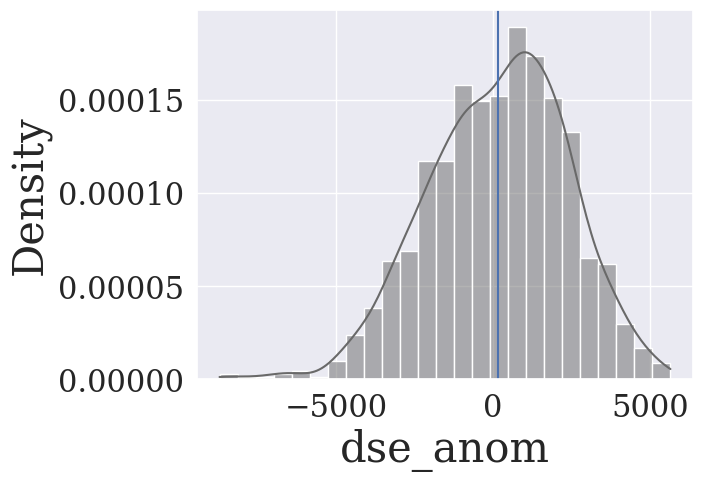

In [266]:
sn.histplot(df_apr.dse_anom, kde=True, stat='density', color='dimgray')
plt.axvline(df_apr.dse_anom.mean())
print(scipy.stats.skew(df_apr.dse_anom))


-0.045585997816099094


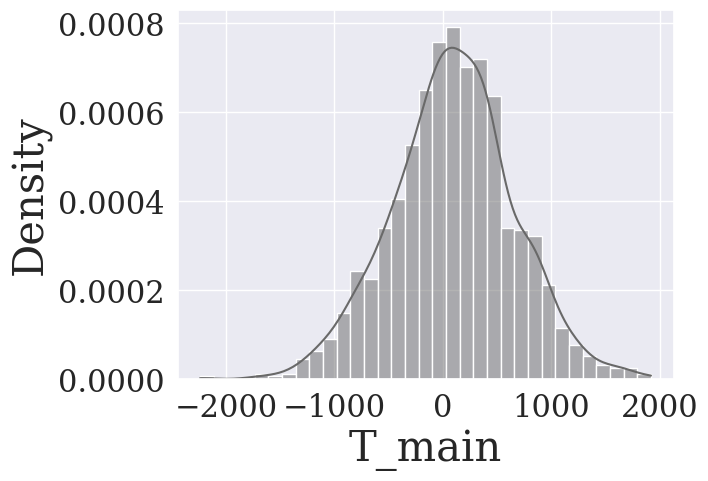

In [265]:
sn.histplot(df_apr.T_main, kde=True, stat='density', color='dimgray')
print(scipy.stats.skew(df_apr.T_main))


-0.05425675382090871


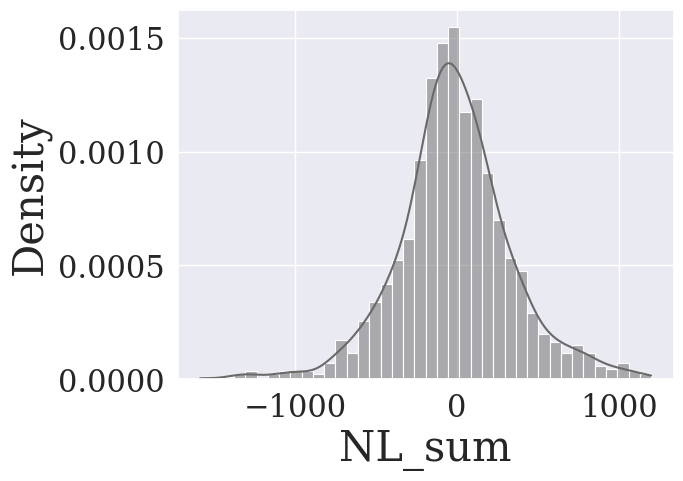

In [264]:
sn.histplot(df_apr.NL_sum, kde=True, stat='density', color='dimgray')
print(scipy.stats.skew(df_apr.NL_sum))


-0.031789595668094264


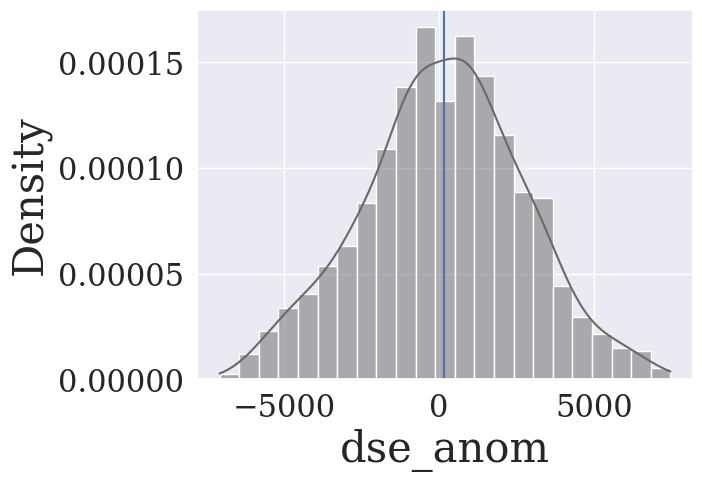

In [263]:
sn.histplot(df_mar.dse_anom, kde=True, stat='density', color='dimgray')
plt.axvline(df_mar.dse_anom.mean())
print(scipy.stats.skew(df_mar.dse_anom))

-0.2909777485187354


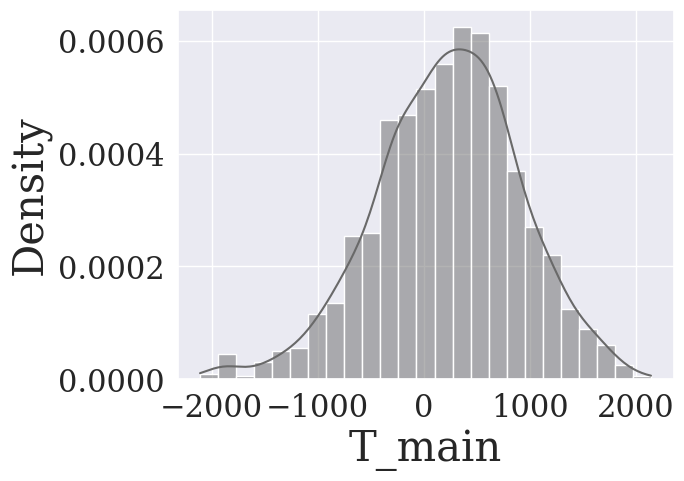

In [262]:
sn.histplot(df_mar.T_main, kde=True, stat='density', color='dimgray')
print(scipy.stats.skew(df_mar.T_main))

0.16075793484650372


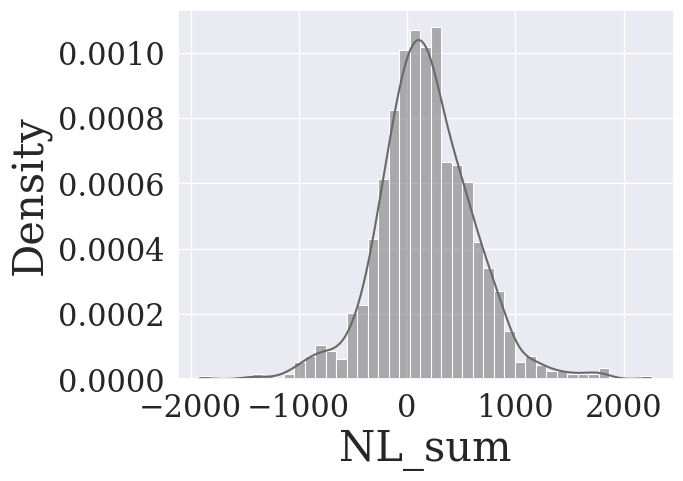

In [261]:
sn.histplot(df_mar.NL_sum, kde=True, stat='density', color='dimgray')
print(scipy.stats.skew(df_mar.NL_sum))


## QLi vs QLSum

$r = 0.73$
$r = -0.58$
$r = 0.54$


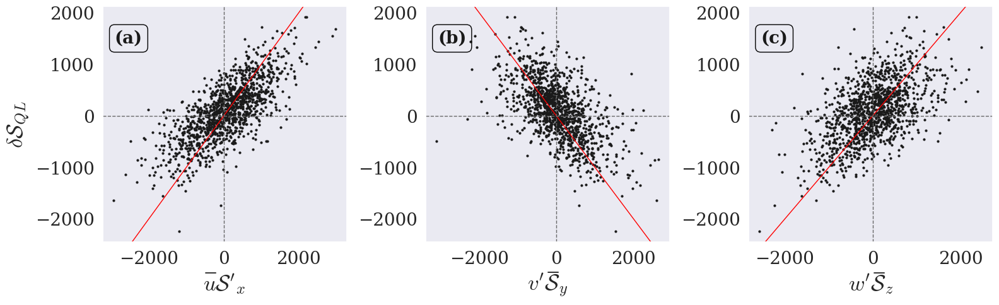

In [644]:
mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['mathtext.fontset'] = 'cm'  # Use Computer Modern font

params = {
    'legend.fontsize': 15,
          'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':25, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': fontname,
            'axes.grid': False,

#    'lines.markersize': 1,
}

plt.rcParams.update(params)
props = dict(boxstyle='round', facecolor='none', alpha=1, edgecolor='black')

fig,ax = plt.subplots(1,3, figsize=(16,5))
df_apr.plot.scatter(x=Tmain_easy['x_main'], y='T_main', ax=ax[0], s=4, c='k')
print('$r = {}$'.format(df_apr[Tmain_easy['x_main']].corr(df_apr['T_main']).round(2)))

df_apr.plot.scatter(x=Tmain_easy['y_main'], y='T_main', ax=ax[1], s=4, c='k')
print('$r = {}$'.format(df_apr[Tmain_easy['y_main']].corr(df_apr['T_main']).round(2)))

df_apr.plot.scatter(x=Tmain_easy['z_main'], y='T_main', ax=ax[2], s=4, c='k')
print('$r = {}$'.format(df_apr[Tmain_easy['z_main']].corr(df_apr['T_main']).round(2)))

ax[1].axline((0,0), slope=-1, c='red', lw=1, )
for c in [0,2]:
    ax[c].axline((0,0), slope=1, c='red', lw=1, )

for c in range(3):
    ax[c].axhline(0, c='dimgray', lw=1, ls='--')
    ax[c].axvline(0, c='dimgray', lw=1, ls='--')
    ax[c].text(.05, .9, '({})'.format(chr(c+97)), transform=ax[c].transAxes, fontsize=base_size, 
               fontname ='DejaVu Serif', verticalalignment='top', c='k', bbox=props, fontweight='bold')
    if c!=0:
        ax[c].set_ylabel('')        
    else:
        ax[c].set_ylabel('$\delta \mathcal{S}_{QL}$')

        
plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Supplem_Apr_QLi_QLSum.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


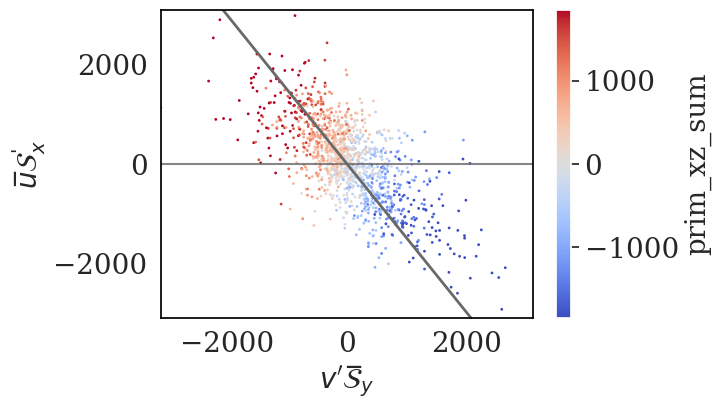

In [246]:
fig,ax = plt.subplots(1,1, figsize = (6,4))

# df = globals()[f'{df_to_use}']
# df_mon = df.loc[df.month == 4].copy()

df_mon['prim_xz_sum'] = df_mon[[x_main,z_main]].sum(axis=1)
df_mon['prim_sum'] = df_mon[[x_main,y_main,z_main]].sum(axis=1)
df_mon['nl_sum'] = df_mon[[nl_us, nl_vs, nl_ws]].sum(axis=1)
df_mon['prim_nl_sum'] = df_mon['prim_sum'] + df_mon['nl_sum']

standardize=False
if standardize == True:
    df_plt = standardize_df(df_mon[[x_main,y_main,z_main, 'prim_sum','nl_sum','prim_nl_sum', 'prim_xz_sum','adv_recon_2Dave']]).copy()
else:
    df_plt = df_mon[[x_main,y_main,z_main, 'prim_sum','nl_sum','prim_nl_sum', 'prim_xz_sum','adv_recon_2Dave']].copy()

# cvar = z_main
# cvar = 'prim_sum'
# cvar = 'prim_nl_sum'
cvar = 'prim_xz_sum'

# cvar = 'adv_recon'

low_qty = np.round(df_plt[cvar].quantile(0.05))
hi_qty = np.round(df_plt[cvar].quantile(0.95))

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

x = y_main
y = x_main

xrng_lo = df_plt[x].quantile(0)
xrng_hi = df_plt[x].quantile(1)

yrng_lo = df_plt[y].quantile(0)
yrng_hi = df_plt[y].quantile(1)

xyrng_min = np.min([xrng_lo, yrng_lo])
xyrng_max = np.max([xrng_hi, yrng_hi])

xylim_lo = xyrng_min if np.abs(xyrng_min) > np.abs(xyrng_max) else -1*xyrng_max
xylim_hi = -1*xylim_lo

df_plt.plot.scatter(x=x, y=y, ax=ax, c= cvar, s=1, 
                    colormap= 'coolwarm', vmin=vmin, vmax=vmax,
#                     colorbar=True, cmap='coolwarm', vmin=vmin,vmax=vmax
#                     cmap=cmap, colorbar=False,
#                     norm = norm
)

ax.set_facecolor("white")

ax.set_xlim([xylim_lo, xylim_hi])
ax.set_ylim([xylim_lo, xylim_hi])

# ax.axhline(0, c='dimgrey', ls='--', lw=1)
# ax.axvline(0, c='dimgrey', ls='--', lw=1)
# ax.set_xticklabels([s for s in ax.get_xticks()],rotation = 90)

# ax.axvline(-0.1, c=bluecolor, alpha=0.8, lw=2)
# ax.axvline(-0.5, c=redcolor, alpha=0.8, lw=2)

# ax.hlines(y=-0.9, xmin = -0.1 , xmax=4, color=bluecolor, lw=2)
# ax.plot((-0.1, 0.5), (0.2,-1), c=bluecolor, lw=2)
# ax.plot((-2.5, -0.5), (4,0), c=redcolor, lw=2)

ax.axhline(-0.1, alpha=0.8, lw=1.5, c='dimgray')
ax.axline((0,0), slope=-1.5, lw=2, c='dimgray')
# ax.axline((0,0), slope=1, lw=2, c='dimgray')
for spine in ax.spines.values():
    spine.set_edgecolor('black')

ax.grid(None)

In [247]:
df_mon['prim_sum'].quantile(np.linspace(0,1,11))

0.0   -2239.024243
0.1    -628.430534
0.2    -359.517894
0.3    -164.474068
0.4     -31.111462
0.5      94.699169
0.6     239.748057
0.7     372.425235
0.8     521.173668
0.9     819.147914
1.0    1917.682272
Name: prim_sum, dtype: float64

In [248]:
df_mon['x_main_dom'] = 0
df_mon.loc[df_mon[x_main] > 0,'x_main_dom'] = 1
df_mon['prim_sum_fl'] = np.where(df_mon.prim_sum>0, 1, -1)

df_mon.groupby(['x_main_dom', 'prim_sum_fl'])['prim_sum_fl'].count()/\
df_mon.groupby(['x_main_dom',])['prim_sum_fl'].count()

x_main_dom  prim_sum_fl
0           -1             0.697715
             1             0.302285
1           -1             0.177444
             1             0.822556
Name: prim_sum_fl, dtype: float64

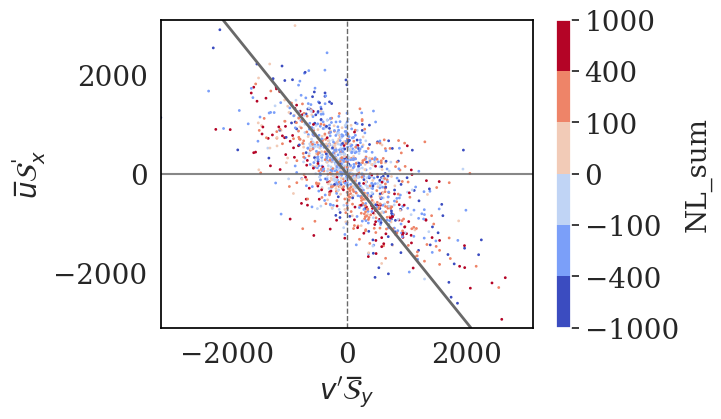

In [250]:
fig,ax = plt.subplots(1,1, figsize = (6,4))

# df = globals()[f'{df_to_use}']
# df_mon = df.loc[df.month == 4].copy()

df_mon['prim_sum'] = df_mon[[x_main,y_main,z_main]].sum(axis=1)
df_mon['NL_sum'] = df_mon[[nl_us, nl_vs, nl_ws]].sum(axis=1)

standardize=False
if standardize == True:
    df_plt = standardize_df(df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']]).copy()
else:
    df_plt = df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']].copy()
    
# cvar = z_main
cvar = 'NL_sum'
# cvar = 'adv_recon'

low_qty = np.round(df_plt[cvar].quantile(0.05))
hi_qty = np.round(df_plt[cvar].quantile(0.95))

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

x = y_main
y = x_main

xrng_lo = df_plt[x].quantile(0)
xrng_hi = df_plt[x].quantile(1)

yrng_lo = df_plt[y].quantile(0)
yrng_hi = df_plt[y].quantile(1)

xyrng_min = np.min([xrng_lo, yrng_lo])
xyrng_max = np.max([xrng_hi, yrng_hi])

xylim_lo = xyrng_min if np.abs(xyrng_min) > np.abs(xyrng_max) else -1*xyrng_max
xylim_hi = -1*xylim_lo

interval_arr = [-1000, -400, -100, 0, 100, 400, 1000]
df_mon['NL_sum'].quantile(np.linspace(0,1,11))
ncat = len(interval_arr) - 1
# 3 if cvar == 'adv_recon' else 6 if cvar == z_main else np.nan
cmap = plt.get_cmap('coolwarm', ncat)
norm = mpl.colors.BoundaryNorm(interval_arr, cmap.N) 


df_plt.plot.scatter(x=x, y=y, ax=ax, c= cvar, s=1, #s=np.abs(df_mon['prim_sum'])/50, 
#                     colormap= 'coolwarm', vmin=vmin, vmax=vmax,
#                     colorbar=True, cmap='coolwarm', vmin=vmin,vmax=vmax
#                     cmap=cmap, colorbar=False,
#                     norm = norm
#                     **(dict(facecolors='none', edgecolors = 'dimgray')),
                    cmap=cmap, colorbar=False,
                    norm = norm

)
fig.colorbar(
    ax.collections[0], 
#     ticks= ticks_arr,
    label = cvar
)

ax.set_facecolor("white")

ax.set_xlim([xylim_lo, xylim_hi])
ax.set_ylim([xylim_lo, xylim_hi])

# ax.axhline(0, c='dimgrey', ls='--', lw=1)
ax.axvline(0, c='dimgrey', ls='--', lw=1)
# ax.set_xticklabels([s for s in ax.get_xticks()],rotation = 90)

# ax.axvline(900, c=bluecolor, alpha=0.8, lw=1.5)
# ax.axvline(-800, c=redcolor, alpha=0.8, lw=1.5)

# ax.hlines(y=-0.9, xmin = -0.1 , xmax=4, color=bluecolor, lw=2)
# ax.plot((-0.1, 0.5), (0.2,-1), c=bluecolor, lw=2)
# ax.plot((-2.5, -0.5), (4,0), c=redcolor, lw=2)
ax.axhline(-0.1, alpha=0.8, lw=1.5, c='dimgray')
ax.axline((0,0), slope=-1.5, lw=2, c='dimgray')

for spine in ax.spines.values():
    spine.set_edgecolor('black')

ax.grid(None)

In [251]:
df_mon['nl_sum'].quantile(np.linspace(0,1,11))

0.0   -1588.047050
0.1    -418.490069
0.2    -250.814083
0.3    -160.038467
0.4     -90.286215
0.5     -24.472154
0.6      51.181964
0.7     127.829478
0.8     234.129095
0.9     403.145184
1.0    1199.551816
Name: nl_sum, dtype: float64

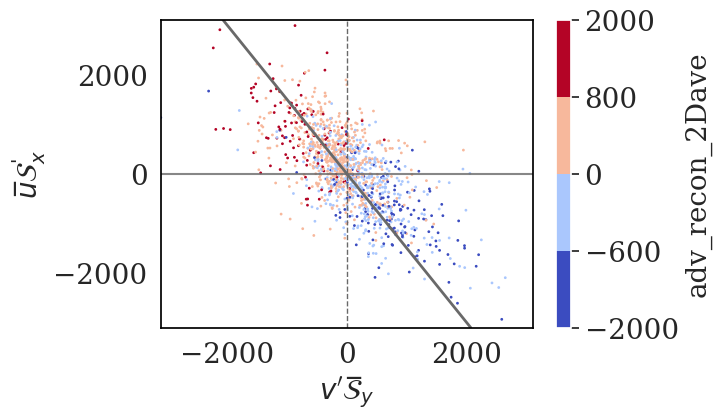

In [252]:
fig,ax = plt.subplots(1,1, figsize = (6,4))

# df = globals()[f'{df_to_use}']
# df_mon = df.loc[df.month == 4].copy()

df_mon['prim_sum'] = df_mon[[x_main,y_main,z_main]].sum(axis=1)
df_mon['NL_sum'] = df_mon[[nl_us, nl_vs, nl_ws]].sum(axis=1)

standardize=False
if standardize == True:
    df_plt = standardize_df(df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']]).copy()
else:
    df_plt = df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']].copy()
    
# cvar = z_main
# cvar = 'prim_sum'
cvar = 'adv_recon_2Dave'

low_qty = np.round(df_plt[cvar].quantile(0.05))
hi_qty = np.round(df_plt[cvar].quantile(0.95))

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

x = y_main
y = x_main

xrng_lo = df_plt[x].quantile(0)
xrng_hi = df_plt[x].quantile(1)

yrng_lo = df_plt[y].quantile(0)
yrng_hi = df_plt[y].quantile(1)

xyrng_min = np.min([xrng_lo, yrng_lo])
xyrng_max = np.max([xrng_hi, yrng_hi])

xylim_lo = xyrng_min if np.abs(xyrng_min) > np.abs(xyrng_max) else -1*xyrng_max
xylim_hi = -1*xylim_lo

interval_arr = [-2000, -600, 0, 800, 2000]
# df_mon['NL_sum'].quantile(np.linspace(0,1,11))
ncat = len(interval_arr) - 1
# 3 if cvar == 'adv_recon' else 6 if cvar == z_main else np.nan
cmap = plt.get_cmap('coolwarm', ncat)
norm = mpl.colors.BoundaryNorm(interval_arr, cmap.N) 

df_plt.plot.scatter(x=x, y=y, ax=ax, c= cvar, s=1, #s=np.abs(df_mon['prim_sum'])/50, 
#                     colormap= 'coolwarm', vmin=vmin, vmax=vmax,
#                     colorbar=True, cmap='coolwarm', vmin=vmin,vmax=vmax
#                     cmap=cmap, colorbar=False,
#                     norm = norm
#                     **(dict(facecolors='none', edgecolors = 'dimgray')),
                    cmap=cmap, colorbar=False,
                    norm = norm

)
fig.colorbar(
    ax.collections[0], 
#     ticks= ticks_arr,
    label = cvar
)

ax.set_facecolor("white")

ax.set_xlim([xylim_lo, xylim_hi])
ax.set_ylim([xylim_lo, xylim_hi])

# ax.axhline(0, c='dimgrey', ls='--', lw=1)
ax.axvline(0, c='dimgrey', ls='--', lw=1)
# ax.set_xticklabels([s for s in ax.get_xticks()],rotation = 90)

# ax.axvline(800, c=bluecolor, alpha=0.8, lw=1.5)
# ax.axvline(-600, c=redcolor, alpha=0.8, lw=1.5)

# ax.hlines(y=-0.9, xmin = -0.1 , xmax=4, color=bluecolor, lw=2)
# ax.plot((-0.1, 0.5), (0.2,-1), c=bluecolor, lw=2)
# ax.plot((-2.5, -0.5), (4,0), c=redcolor, lw=2)
ax.axhline(-0.1, alpha=0.8, lw=1.5, c='dimgray')
ax.axline((0,0), slope=-1.5, lw=2, c='dimgray')

for spine in ax.spines.values():
    spine.set_edgecolor('black')

ax.grid(None)

In [253]:
df_mon[wanom] = -1*df_mon['w_down_anom']

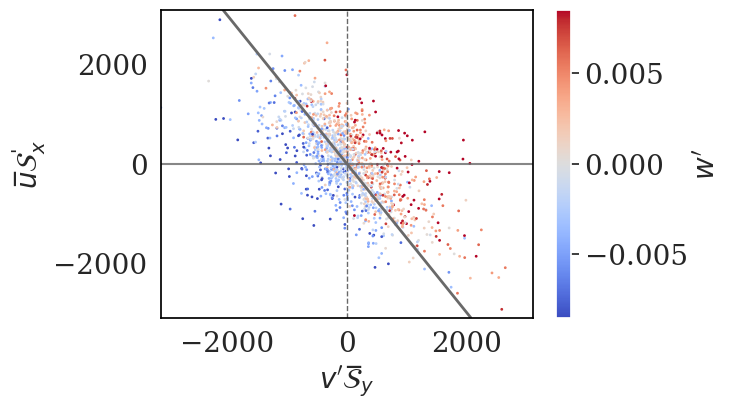

In [254]:
fig,ax = plt.subplots(1,1, figsize = (6,4))

# df = globals()[f'{df_to_use}']
# df_mon = df.loc[df.month == 4].copy()

df_mon['prim_sum'] = df_mon[[x_main,y_main,z_main]].sum(axis=1)
df_mon['NL_sum'] = df_mon[[nl_us, nl_vs, nl_ws]].sum(axis=1)

standardize=False
if standardize == True:
    df_plt = standardize_df(df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave',wanom]]).copy()
else:
    df_plt = df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave',wanom]].copy()
    
# cvar = z_main
cvar = wanom
# cvar = 'adv_recon'

low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

x = y_main
y = x_main

xrng_lo = df_plt[x].quantile(0)
xrng_hi = df_plt[x].quantile(1)

yrng_lo = df_plt[y].quantile(0)
yrng_hi = df_plt[y].quantile(1)

xyrng_min = np.min([xrng_lo, yrng_lo])
xyrng_max = np.max([xrng_hi, yrng_hi])

xylim_lo = xyrng_min if np.abs(xyrng_min) > np.abs(xyrng_max) else -1*xyrng_max
xylim_hi = -1*xylim_lo

# interval_arr = [-2000, -600, 0, 800, 2000]
interval_arr = [-4, -1, -0.1, 0.1, 1, 4]

# df_mon['NL_sum'].quantile(np.linspace(0,1,11))
ncat = len(interval_arr) - 1
# 3 if cvar == 'adv_recon' else 6 if cvar == z_main else np.nan
cmap = plt.get_cmap('coolwarm', ncat)
norm = mpl.colors.BoundaryNorm(interval_arr, cmap.N) 

df_plt.plot.scatter(x=x, y=y, ax=ax, c= cvar, s=1, #s=np.abs(df_mon['prim_sum'])/50, 
                    colormap= 'coolwarm', vmin=vmin, vmax=vmax,
#                     colorbar=True, cmap='coolwarm', vmin=vmin,vmax=vmax
#                     cmap=cmap, colorbar=False,
#                     norm = norm
#                     **(dict(facecolors='none', edgecolors = 'dimgray')),
#                     cmap='coolwarm', 
                    colorbar=True,
#                     norm = norm

)
# fig.colorbar(
#     ax.collections[0], 
# #     ticks= ticks_arr,
#     label = cvar
# )

ax.set_facecolor("white")

ax.set_xlim([xylim_lo, xylim_hi])
ax.set_ylim([xylim_lo, xylim_hi])

# ax.axhline(0, c='dimgrey', ls='--', lw=1)
ax.axvline(0, c='dimgrey', ls='--', lw=1)
# ax.set_xticklabels([s for s in ax.get_xticks()],rotation = 90)

# ax.axvline(800, c=bluecolor, alpha=0.8, lw=1.5)
# ax.axvline(-600, c=redcolor, alpha=0.8, lw=1.5)

# ax.hlines(y=-0.9, xmin = -0.1 , xmax=4, color=bluecolor, lw=2)
# ax.plot((-0.1, 0.5), (0.2,-1), c=bluecolor, lw=2)
# ax.plot((-2.5, -0.5), (4,0), c=redcolor, lw=2)
ax.axhline(-0.1, alpha=0.8, lw=1.5, c='dimgray')
ax.axline((0,0), slope=-1.5, lw=2, c='dimgray')

for spine in ax.spines.values():
    spine.set_edgecolor('black')

ax.grid(None)

In [255]:
df_mon['prim_sum'].quantile(np.linspace(0,1,11))

0.0   -2239.024243
0.1    -628.430534
0.2    -359.517894
0.3    -164.474068
0.4     -31.111462
0.5      94.699169
0.6     239.748057
0.7     372.425235
0.8     521.173668
0.9     819.147914
1.0    1917.682272
Name: prim_sum, dtype: float64

In [256]:
num_classes = 3
df_mon, globals()[f'adv_recon_2Dave_class_map'] = create_classes(df_mon, y_var = 'adv_recon_2Dave', num_classes = num_classes)
adv_recon_2Dave_class_map

[0, 1, 2] [0.0, 0.33, 0.67, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    407
1    420
2    407
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-3877.6,-189.1]', 1: '(-189.1,259.8]', 2: '(259.8,2221.1]'}


{0: '(-3877.6,-189.1]', 1: '(-189.1,259.8]', 2: '(259.8,2221.1]'}

In [258]:
df_mon['quadrant'] = np.where((df_mon[y_main]>0) & (df_mon[x_main]>0), 1, 
                              np.where((df_mon[y_main]<0) & (df_mon[x_main]>0), 2, 
                                       np.where((df_mon[y_main]<0) & (df_mon[x_main]<0), 3, 4)
            )
)

slope = -1.5

# df_mon['region'] = np.where((df_mon['quadrant'] == 2) & (df_mon[x_main] > slope*df_mon[y_main]), 2.1, 
#                            np.where((df_mon['quadrant'] == 2) & (df_mon[x_main] < slope*df_mon[y_main]), 2.2, 
#                                    np.where((df_mon['quadrant'] == 4) & (df_mon[x_main] < slope*df_mon[y_main]), 4.1, 
#                                            np.where((df_mon['quadrant'] == 4) & (df_mon[x_main] > slope*df_mon[y_main]), 4.2, 
#                                                    df_mon['quadrant']))
                                   
#                                    ))


# df_mon['region'] = \
# np.where(df_mon['quadrant'].isin([1,3]), df_mon['quadrant'], 
#          np.where(
#     (df_mon[x_main] < -0.1*df_mon[x_main].std()) & (df_mon[z_main] > -0.1*df_mon[z_main].std()), 4.1, 
#     np.where((df_mon[x_main] < -0.1*df_mon[x_main].std()) & (df_mon[z_main] < -0.1*df_mon[z_main].std()), 4.2,
            
#             np.where((df_mon[x_main] > -0.1*df_mon[x_main].std()) & (df_mon[z_main] > 0.1*df_mon[z_main].std()), 2.2, 
                    
#                     np.where((df_mon[x_main] > -0.1*df_mon[x_main].std()) & (df_mon[z_main] < 0.1*df_mon[z_main].std()), 2.1, np.nan))))

        
#         )

In [259]:
df_mon['region'] = \
np.where(df_mon['quadrant'].isin([1,3]), df_mon['quadrant'], 
         np.where(
             (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
             (df_mon[z_main] > -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 4.1, 
                  np.where(
                      (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                      (df_mon[z_main] < -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 4.2,
                           np.where(
                               (df_mon[x_main] > ((-0.09*df_mon[x_main].std() + df_mon[x_main].mean()))) & 
                               (df_mon[z_main] > ((0.075*df_mon[z_main].std() + df_mon[z_main].mean()))), 2.2, 
                                    np.where(
                                        (df_mon[x_main] > (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                                        (df_mon[z_main] < (0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 2.1, np.nan
                                    )
                           )
                  )
         )
        )

In [260]:
df_mon['dspc'] = \
     np.where(
         (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
         (df_mon[z_main] > -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node #3', 
              np.where(
                  (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                  (df_mon[z_main] < -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node #2',
                       np.where(
                           (df_mon[x_main] > ((-0.09*df_mon[x_main].std() + df_mon[x_main].mean()))) & 
                           (df_mon[z_main] > ((0.075*df_mon[z_main].std() + df_mon[z_main].mean()))), 'Node #6', 
                                np.where(
                                    (df_mon[x_main] > (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                                    (df_mon[z_main] < (0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node #5', np.nan
                                )
                       )
              )
     )

In [261]:
df_mon = df_mon.assign(**{'y_main_classed': pd.qcut(df_mon[y_main], q=10)})
df_mon['y_main_classed'] =\
df_mon['y_main_classed'].apply(lambda x: pd.Interval(left=round(x.left, 2), right=round(x.right,2)))


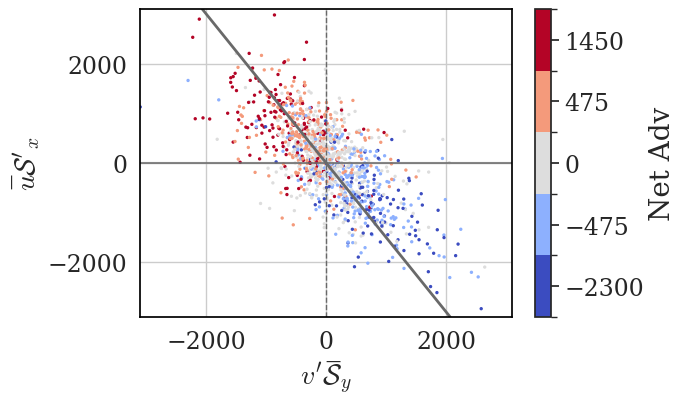

In [761]:
fig,ax = plt.subplots(1,1, figsize = (6,4))

# df = globals()[f'{df_to_use}']
# df_mon = df.loc[df.month == 4].copy()

df_mon['prim_sum'] = df_mon[[x_main,y_main,z_main]].sum(axis=1)
df_mon['NL_sum'] = df_mon[[nl_us, nl_vs, nl_ws]].sum(axis=1)

standardize=False
if standardize == True:
    df_plt = standardize_df(df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']]).copy()
else:
    df_plt = df_mon[[x_main,y_main,z_main, 'prim_sum','NL_sum','adv_recon_2Dave']].copy()
    
# cvar = z_main
# cvar = 'NL_sum'
cvar = 'adv_recon_2Dave'

low_qty = np.round(df_plt[cvar].quantile(0.05))
hi_qty = np.round(df_plt[cvar].quantile(0.95))

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

x = y_main
y = x_main

xrng_lo = df_plt[x].quantile(0)
xrng_hi = df_plt[x].quantile(1)

yrng_lo = df_plt[y].quantile(0)
yrng_hi = df_plt[y].quantile(1)

xyrng_min = np.min([xrng_lo, yrng_lo])
xyrng_max = np.max([xrng_hi, yrng_hi])

xylim_lo = xyrng_min if np.abs(xyrng_min) > np.abs(xyrng_max) else -1*xyrng_max
xylim_hi = -1*xylim_lo



cmap = plt.get_cmap('coolwarm', 5)
cbar_bnds = [-3900, -700, -250, 250, 700, 2200]
cbar_ticks = np.convolve(cbar_bnds, [0.5,0.5], "valid")    
norm = mpl.colors.BoundaryNorm(cbar_bnds, cmap.N) 

df_plt.plot.scatter(
    x=y_main, y=x_main, s=2, c=cvar,  colorbar=False,
    cmap=cmap, norm = norm, ax=ax

)

fig.colorbar(
    ax.collections[0], 
    ticks= cbar_ticks,
    label = 'Net Adv'
)

ax.set_facecolor("white")

ax.set_xlim([xylim_lo, xylim_hi])
ax.set_ylim([xylim_lo, xylim_hi])

# ax.axhline(0, c='dimgrey', ls='--', lw=1)
ax.axvline(0, c='dimgrey', ls='--', lw=1)
# ax.set_xticklabels([s for s in ax.get_xticks()],rotation = 90)

# ax.axvline(900, c=bluecolor, alpha=0.8, lw=1.5)
# ax.axvline(-800, c=redcolor, alpha=0.8, lw=1.5)

# ax.hlines(y=-0.9, xmin = -0.1 , xmax=4, color=bluecolor, lw=2)
# ax.plot((-0.1, 0.5), (0.2,-1), c=bluecolor, lw=2)
# ax.plot((-2.5, -0.5), (4,0), c=redcolor, lw=2)
ax.axhline(-0.1, alpha=0.8, lw=1.5, c='dimgray')
ax.axline((0,0), slope=-1.5, lw=2, c='dimgray')

for spine in ax.spines.values():
    spine.set_edgecolor('black')

ax.grid(None)

In [263]:
df = df_apr.copy()
# .loc[
#     df_mon[z_main].between(df_mon[z_main].quantile(0.025), df_mon[z_main].quantile(0.975)) & 
#     df_mon[y_main].between(df_mon[y_main].quantile(0.025), df_mon[y_main].quantile(0.975))
#                ].copy()

mlr(X = df[z_main].to_frame(), y = df[y_main], plot_coefs=False, standardize=False)

                             OLS Regression Results                             
Dep. Variable:     $v'$$\mathcal{S}̅_y$   R-squared:                       0.451
Model:                              OLS   Adj. R-squared:                  0.450
Method:                   Least Squares   F-statistic:                     909.3
Date:                  Fri, 07 Mar 2025   Prob (F-statistic):          2.40e-146
Time:                          15:25:03   Log-Likelihood:                -8500.4
No. Observations:                  1110   AIC:                         1.700e+04
Df Residuals:                      1108   BIC:                         1.701e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
Index(['pvals', 'coeff', 'conf_lower', 'conf_higher'], dtype='object')
                              pvals      coeff  conf_lower  conf_higher
const                  2.756269e-02  33.963490 

(                              pvals      coeff  conf_lower  conf_higher
 const                  2.756269e-02  33.963490    3.760026    64.166955
 $w'$$\mathcal{S}̅_z$  2.399482e-146  -0.684734   -0.729288    -0.640180,
                               pvals      coeff  conf_lower  conf_higher
 const                  2.756269e-02  33.963490    3.760026    64.166955
 $w'$$\mathcal{S}̅_z$  2.399482e-146  -0.684734   -0.729288    -0.640180,
 date
 1999-04-23    -241.703933
 2010-04-29     413.772955
 1995-04-28     489.237046
 1997-04-03     794.956144
 2018-04-05     108.641858
                  ...     
 2010-04-10      62.843936
 2009-04-14    1162.124428
 1986-04-30     148.823198
 2010-04-01    -270.735645
 2022-04-25    -174.086909
 Name: $v'$$\mathcal{S}̅_y$, Length: 1110, dtype: float64)

## Prim efficacy plot

In [619]:
(np.round(df_mon.NL_sum.quantile(np.linspace(0,1,8))/100, 1)*100).values + 20

array([-1570.,  -330.,  -150.,   -50.,    40.,   160.,   340.,  1220.])

In [59]:
df_t1.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL',
       '$\del

In [60]:
df_t1['$\delta \mathcal{S}_{QL}$'] = \
df_t1[set_main].sum(axis=1)

In [61]:
df_t1['$\delta \mathcal{S}_{NL}$'] = \
df_t1[eddy_eddy].sum(axis=1)

In [62]:
importlib.reload(custom_funcs)
from custom_funcs import *

In [63]:
pd.DataFrame(index = pd.MultiIndex.from_product([['Apr'], iter_lst_lab], names=['Month', 'Term']), 
                  data=range(len(iter_lst_lab)), columns=['r2'])

r2
Month Term                         
Apr   $\delta \mathcal{S}_{QL}$   0
      $\delta \mathcal{S}_{NL}$   1

k= 0
['$\\delta \\mathcal{S}_{QL}$']
Index(['pvals', 'coeff', 'conf_lower', 'conf_higher'], dtype='object')
[0.622]
r2.astype 0.622
k= 1
['$\\delta \\mathcal{S}_{QL}$', '$\\delta \\mathcal{S}_{NL}$']
Index(['pvals', 'coeff', 'conf_lower', 'conf_higher'], dtype='object')
[0.622, 0.942]
r2.astype 0.942
0
1
2
2
a
b
c
d


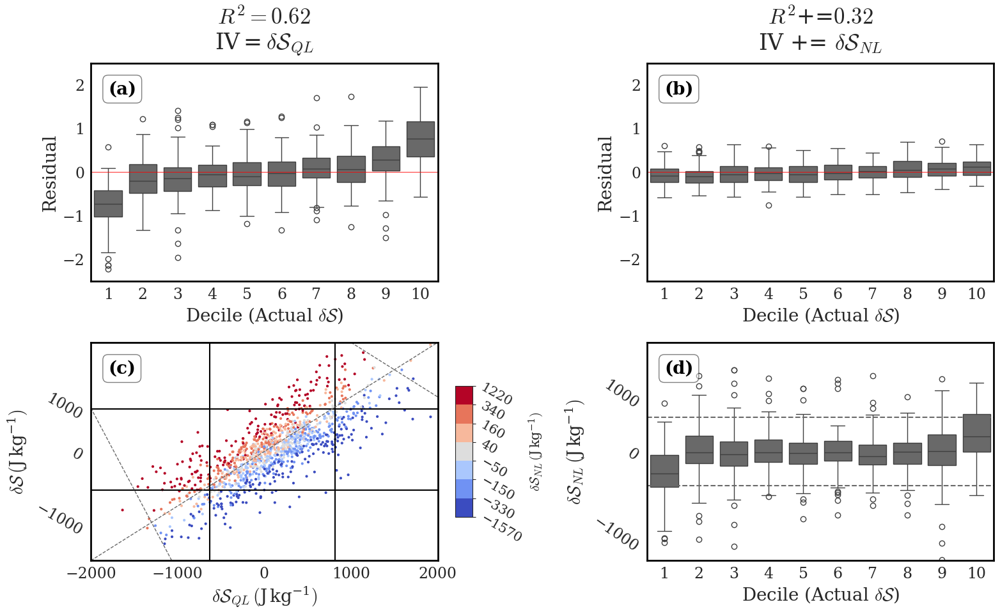

In [64]:
# plt.rcParams.update({'axes.titlesize': 20, 'xtick.labelsize': 13, 'axes.labelsize':20})

# iter_lst = [
#     set_main, 
#     set_main + eddy_eddy, 
# #     set_insig + eddy_eddy + set_main, 
# #     mean_mean + set_insig + eddy_eddy + set_main, 
# ]

iter_lst = [
    ['$\delta \mathcal{S}_{QL}$'], 
    ['$\delta \mathcal{S}_{QL}$', '$\delta \mathcal{S}_{NL}$'], 
#     set_insig + eddy_eddy + set_main, 
#     mean_mean + set_insig + eddy_eddy + set_main, 
]

iter_lst_lab = \
[
    '$\delta \mathcal{S}_{QL}$',
    '$\delta \mathcal{S}_{NL}$',
#     '$\mathregular{T_{QL\_other}}$',
#     '$\mathregular{T_{clmt}}$',   
]

iter_lst_map = dict(zip(iter_lst_lab, iter_lst))

plt.rcParams['font.family'] = 'DejaVu Serif'
# rc('text', usetex=False)

df_t1['$\delta \mathcal{S}$'] = df_t1['adv_recon_2Dave'].copy()
y_var = '$\delta \mathcal{S}$'

df = pd.DataFrame(index = pd.MultiIndex.from_product([['Apr'], iter_lst_lab], names=['Month', 'Term']), 
                  data=range(len(iter_lst_lab)), columns=['r2'])

df_r2 = df.pivot_table(index='Month',columns = 'Term', values = 'r2', aggfunc='sum')
df_red_rmse = df.pivot_table(index='Month',columns = 'Term', values = 'r2', aggfunc='sum')

df_r2 = df_r2.reindex(iter_lst_lab, axis=1)
df_r2 = df_r2.astype('float64')

r2_arr = list()

mon = 4
for k in range(len(iter_lst)):
    print('k=',k)
    var_lst = iter_lst[k]
#     var_lst = iter_lst_lab[k]

    #     df_mon = df_mst2.loc[df_mst2.month==mon].copy()
    df_mon = df_t1.loc[df_t1.month==mon].copy()
    terms_to_use = var_lst # mean_mean + set_main + [eddy_eddy[0]] #+ [eddy_eddy[1]] + [eddy_eddy[2]]  #const_linear_terms 
    print(terms_to_use)
    X = df_mon[terms_to_use] # + ['u\'_s\'', 'v\'_s\'', 'w\'_s\'']
    
#     X = X.to_frame()
    
    globals()[f'results_df_{mon}_{k}'], globals()[f'results_df_mlr_add_{mon}_{k}'], globals()[f'lmod{k}'], globals()[f'y_act{k}'] = \
    mlr(X, df_mon[y_var], test_size=0.25, figsize=(16,5), standardize=True, print_res=False, coef_thresh=0, plot_coefs=False)

    r2 = globals()[f'lmod{k}'].rsquared_adj.round(3)
    r2_arr.append(r2)
    print(r2_arr)
    
    print('r2.astype',r2.astype('float64'))
    df_r2.loc[df_r2.index=='Apr',iter_lst_lab[k]] = r2.astype('float64')
    
    globals()[f'y_preds{k}'] = globals()[f'lmod{k}'].predict()
    globals()[f'errors_{k}'] = pd.Series(globals()[f'y_preds{k}'] - globals()[f'y_act{k}'].values.flatten())\
        .rename(iter_lst_lab[k])
    
    rse = np.sqrt(globals()[f'lmod{k}'].mse_resid)
    globals()[f'stan_errors_{k}'] = globals()[f'errors_{k}']/rse

    globals()[f'results_df_{mon}_{k}'].loc[:,'month'] = mon
    mlr_results = globals()[f'results_df_{mon}_{k}'] # if mon==3 else pd.concat([mlr_results, globals()[f'results_df_{mon}']])    

# print(r2_arr)

mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['mathtext.fontset'] = 'cm'  # Use Computer Modern font

params = {
#     'legend.fontsize': 15,
#           'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':25, # pot title size
         'xtick.labelsize':17,
         'ytick.labelsize':17, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': fontname,
            'axes.grid': False,

#    'lines.markersize': 1,
}

plt.rcParams.update(params)
# nrow=1; ncol=len(iter_lst_lab)
nrow=2; ncol=len(iter_lst_lab)

fig,ax = plt.subplots(nrow,ncol,figsize=(16,5*nrow), squeeze=False)

k=0
for i in range(nrow):
    for j in range(ncol):
        print(k)

        if i==0:
            df_box = pd.DataFrame(
            {
                'act': globals()[f'y_act{k}'].values.flatten(),
                'preds': globals()[f'y_preds{k}'],
                'resid': globals()[f'errors_{k}']*-1
            })

            globals()[f'df_box_{k}'] = df_box.copy()

            df_box2 = df_box.assign(
            **{
                'acts_classed': pd.qcut(df_box['act'], q=10)
                }
            )

            df_box2['acts_classed'] =\
            df_box2['acts_classed'].apply(lambda x: pd.Interval(left=round(x.left, 2), right=round(x.right,2)))
    
            g = sn.boxplot(
                y = df_box2['resid'], 
    #             y=globals()[f'y_preds{k}'], 
                x = df_box2['acts_classed'], 
                ax = ax[i,j],
                color='dimgray',
                dodge=False,
#                 xticklabels = range(1, 11),
                **{'manage_ticks': True, },
#                 **{'xticks': range(1, 11)}
                )

    #         labels = [g.get_xticklabels()[i].get_text() for i in range(len(g.get_xticklabels()))]
            labels = range(1, 11)
            g.set_xticklabels(labels) # , rotation=0, horizontalalignment='right'

            ax[i,j].axhline(0, c='red', lw='0.6')
    #         ax[i,j].axvline(0)
    #         ax[i,j].set_xlim([-6.5,2.5])
            ax[i,j].set_ylim([-2.5,2.5])
    #         ax[i,j].axline((0,0), slope=1, )

    #         ax[i,j].set_title('{}, $\mathregular{R^{2}}$ = {}'.format(iter_lst_lab[k],r2_arr[k].round(2)))
            ax[i,j].set_title(
                (r'$R^{2}=%.2f$' %(r2_arr[k].round(2)) if k==0 #  '= {}'.format(r2_arr[k].round(2))
                 else r'$R^{2}$' + '+=' + '$%.2f$' %(r2_arr[k] - r2_arr[k-1]).round(2)) + 
                ('\n$\mathregular{IV = }$' if k==0 else '\n$\mathregular{IV}$ += ')  + '{}'.format(iter_lst_lab[k]), 
                pad = 15
            )

            ax[i,j].set_xlabel('Decile (Actual $\delta \mathcal{S}$)')
            ax[i,j].set_ylabel('')

            k=k+1
            if j==j:
                ax[i,j].set_ylabel('Residual')

ncat = 7
interval_arr = (np.round(df_mon.NL_sum.quantile(np.linspace(0,1,ncat+1))/100, 1)*100).values + 20
cmap = plt.get_cmap('coolwarm', ncat)
norm = mpl.colors.BoundaryNorm(interval_arr, cmap.N)

sc = ax[1,0].scatter(df_mon['T_main'], df_mon['adv_recon_2Dave'], s=4, c=df_mon['NL_sum'], 
                     cmap=cmap, norm=norm, )

ax[1,0].axvline(df_mon['T_main'].quantile(0.9),c="black")
ax[1,0].axvline(df_mon['T_main'].quantile(0.1),c="black")
ax[1,0].axhline(df_mon['adv_recon_2Dave'].quantile(0.9),c="black")
ax[1,0].axhline(df_mon['adv_recon_2Dave'].quantile(0.1),c="black")

# Add colorbar and set it to the bottom
# cbar = plt.colorbar(sc, ax=ax[2,0], orientation='horizontal', pad=0.25) 
# cbar.set_label('$\mathregular{\mathcal{S}_{NL}}$')

# Create a divider for the existing axes instance 
# divider = make_axes_locatable(ax[1,0])
# # Append axes to the bottom of ax, with 5% height of ax 
# cax = divider.append_axes("bottom", size="3%", pad=1) 
# # Shrink width by modifying position
# pos = cax.get_position()
# cax.set_position([pos.x0 + 0.1, pos.y0, pos.width * 0.5, pos.height])

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# cax = ax[1,0].inset_axes([0.3, -0.55, 0.4, 0.05])
cax = ax[1,0].inset_axes([1.05, 0.2, 0.05, 0.6])
cbar = fig.colorbar(sc, cax=cax, orientation='vertical') 
cbar.set_label('$\delta \mathcal{S}_{NL}\,(\mathregular{J\,kg^{-1}}) $', fontsize=15)
cbar.ax.tick_params(labelsize=15,labelrotation=-30)

ax[1,0].set_xlabel('$\delta \mathcal{S}_{QL}\,(\mathregular{J\,kg^{-1}})$')
ax[1,0].set_ylabel('$\delta \mathcal{S}\,(\mathregular{J\,kg^{-1}})$')

ax[1,0].axline((0,0), slope=1,ls='--',lw=1,c='dimgrey')
ax[1,0].axline((-1300,-1300),slope=-3,ls='--',lw=1,c='dimgrey')
ax[1,0].axline((1500,1500),slope=-1,ls='--',lw=1,c='dimgrey')

ax[1,0].set_ylim(-2000,2000)
ax[1,0].set_xlim(-2000,2000)
ax[1,0].set_yticks([-1000,0,1000])
ax[1,0].tick_params(axis="y",labelrotation=-30)
# ax[1,0].tick_params(axis="x",labelrotation=-15)

ax[1,0].set_facecolor("white")
for spine in ax[1,0].spines.values():
    spine.set_edgecolor('dimgrey')

df_box = df_mon[['NL_sum', y_var]]

df_box2 = df_box.assign(
**{
    '{}_classed'.format(y_var): pd.qcut(df_box[y_var], q=10)
    }
)

df_box2['{}_classed'.format(y_var)] =\
df_box2['{}_classed'.format(y_var)].apply(lambda x: pd.Interval(left=round(x.left, 2), right=round(x.right,2)))

g = sn.boxplot(
    y = df_box2['NL_sum'], 
    x = df_box2['{}_classed'.format(y_var)], 
    ax = ax[1,1],
    color='dimgray',
    )
ax[1,1].set_ylim(-1600,1600)
ax[1,1].axhline(500, lw=1.5,ls='--',c='dimgray')
ax[1,1].axhline(-500, lw=1.5,ls='--',c='dimgray')
ax[1,1].set_xlabel('Decile (Actual $\delta \mathcal{S}$)')
ax[1,1].set_ylabel('$\delta \mathcal{S}_{NL}\,(\mathregular{J\,kg^{-1}})$')
ax[1,1].set_yticks([-1000,0,1000])
ax[1,1].tick_params(axis="y",labelrotation=-35)


labels = range(1, 11)
g.set_xticks(range(0,10),labels) # , rotation=0, horizontalalignment='right'

props = dict(boxstyle='round', facecolor='white', alpha=0.5, edgecolor='k')

base_size = 20
fontname = 'DejaVu Serif'

k=0
for r in range(nrow):
    for c in range(ncol):
        print(chr(k+97))
        ax[r,c].text(.05, .92, '({})'.format(chr(k+97)), transform=ax[r,c].transAxes, 
                     fontsize=base_size, fontname = fontname, verticalalignment='top', 
                     c='k', bbox=props, fontweight='bold') 
        
        border_thickness = 2
        ax[r,c].set_facecolor('white')
        ax[r,c].spines["top"].set_linewidth(border_thickness)
        ax[r,c].spines["right"].set_linewidth(border_thickness)
        ax[r,c].spines["bottom"].set_linewidth(border_thickness)
        ax[r,c].spines["left"].set_linewidth(border_thickness)
        # Optional: Customize border color
        for spine in ax[r,c].spines.values():
            spine.set_color("black")

        k += 1

# fig.align_ylabels()
plt.tight_layout(pad=2)

# plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Apr_efficacy_v2.pdf', format='pdf', bbox_inches='tight')


In [152]:
# globals()[f'results_df_{mon}_{k}'], globals()[f'results_df_mlr_add_{mon}_{k}'], globals()[f'lmod{k}']
lmod0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     $\delta \mathcal{S}$   R-squared:                       0.627
Model:                              OLS   Adj. R-squared:                  0.627
Method:                   Least Squares   F-statistic:                     1552.
Date:                  Fri, 03 Oct 2025   Prob (F-statistic):          6.19e-200
Time:                          17:33:06   Log-Likelihood:                -830.78
No. Observations:                   925   AIC:                             1666.
Df Residuals:                       923   BIC:                             1675.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.0090      0.020     -0.462      0.644      -0.047       0.029
$\delta \mathcal{S}_{QL}$     0.7760      0.020     39.401      0.000       0.737       0.815
==============================================================================
Omnibus:                       21.245   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.296
Skew:                          -0.025   Prob(JB):                     3.97e-10
Kurtosis:                       4.059   Cond. No.                         1.01
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [148]:
results_df_4_0

,pvals,coeff,conf_lower,conf_higher,month
$\delta \mathcal{S}_{QL}$,6.186573e-200,0.78,0.74,0.81,4
const,6.441054e-01,-0.01,-0.05,0.03,4


In [149]:
results_df_4_1

,pvals,coeff,conf_lower,conf_higher,month
$\delta \mathcal{S}_{QL}$,0.000000,0.97,0.95,0.98,4
$\delta \mathcal{S}_{NL}$,0.000000,0.57,0.56,0.59,4
const,0.771804,-0.00,-0.02,0.01,4


In [ ]:
# del ds_basic_vars0, ds_basic_vars1, ds_basic_vars2
ds_analysis00

In [ ]:
gc.collect()

In [473]:
def reform_df(dft):
    # quick and dirty stacking of cols 2,3 on 0,1
    dfl = dft[[0,1]]
    dfr = dft[[2,3]]
    dfr.columns = 0,1
    dfout = pd.concat([dfl,dfr])
    dfout.columns=['Parameter','Value']
    return dfout

def model_summary_to_dataframe(model):
    global metrics_df, results_df
    # first the middle table
    results_df = pd.DataFrame(model.summary().tables[1])
    results_df = results_df.set_index(0)
    results_df.columns = results_df.iloc[0]
    results_df = results_df.iloc[1:]
    results_df.index.name='Parameter'

    # now for the surrounding information
    metrics_top = reform_df(pd.DataFrame(model.summary().tables[0]))
    metrics_bot = reform_df(pd.DataFrame(model.summary().tables[2]))
    metrics_df = pd.concat([metrics_top,metrics_bot])
    
    metrics_df['Parameter'] = metrics_df['Parameter'].astype('string')
    metrics_df['Parameter'] = metrics_df['Parameter'].str.strip()
    metrics_df = metrics_df.loc[metrics_df.Parameter != '']
    metrics_df.index = np.arange(0,metrics_df.shape[0])

    return pd.DataFrame(results_df),metrics_df

In [ ]:
# pd.set_option('display.max_columns', 50)  # Adjust the number as needed
df0 = model_summary_to_dataframe(lmod0)[0].reset_index()

df1 = model_summary_to_dataframe(lmod0)[1]#.iloc[9:16]
df1.loc[:,'Parameter'] = df1['Parameter'].str.replace(':','')
df1 = df1.loc[~df1.Parameter.str.contains('Date|Time'), :]
df1.set_index('Parameter', inplace=True)
print(df1.index)

from matplotlib.backends.backend_pdf import PdfPages

# Create a single-page PDF with both tables
with PdfPages("/home/data/lab_hardik/Manuscript1/Supplem_regmod_outs_QL.pdf") as pdf:
    fig, axes = plt.subplots(2, 1, figsize=(8, 8))  # Two rows, one column layout
    axes[0].axis('tight')
    axes[0].axis('off')
    table1 = axes[0].table(cellText=df0.values, colLabels=df0.columns, loc='center', cellLoc = 'left', colLoc='center')

    axes[1].axis('tight')
    axes[1].axis('off')
    
    table2 = axes[1].table(cellText=df1.values, colLabels=df1.columns, 
                           rowLabels=df1.index, 
                           loc='center', 
#                            rowLoc='center',
                           cellLoc = 'center', colLoc='center', 
                          )

    for (row, col), cell in table2.get_celld().items():
#         print(row, col)
        if col == 0:  # Adjust column 1 width
            cell.set_width(0.2)  # Reduce this to make the column narrower
        elif col == -1:  # Row labels
            cell.set_width(0.6)  # Set more space for row labels

    pdf.savefig(fig)
    plt.close(fig)

print("PDF with both tables on the same page created.")

In [554]:
# pd.set_option('display.max_columns', 50)  # Adjust the number as needed
df0 = model_summary_to_dataframe(lmod1)[0].reset_index()

df1 = model_summary_to_dataframe(lmod1)[1]#.iloc[9:16]
df1.loc[:,'Parameter'] = df1['Parameter'].str.replace(':','')
df1 = df1.loc[~df1.Parameter.str.contains('Date|Time'), :]
df1.set_index('Parameter', inplace=True)
# print(df1.index)

from matplotlib.backends.backend_pdf import PdfPages

# Create a single-page PDF with both tables
with PdfPages("/home/data/lab_hardik/Manuscript1/Supplem_regmod_outs_QLNL.pdf") as pdf:
    fig, axes = plt.subplots(2, 1, figsize=(8, 8))  # Two rows, one column layout
    axes[0].axis('tight')
    axes[0].axis('off')
    table1 = axes[0].table(cellText=df0.values, colLabels=df0.columns, loc='center', cellLoc = 'left', colLoc='center')

    axes[1].axis('tight')
    axes[1].axis('off')
    
    table2 = axes[1].table(cellText=df1.values, colLabels=df1.columns, 
                           rowLabels=df1.index, 
                           loc='center', 
#                            rowLoc='center',
                           cellLoc = 'center', colLoc='center', 
                          )

    for (row, col), cell in table2.get_celld().items():
#         print(row, col)
        if col == 0:  # Adjust column 1 width
            cell.set_width(0.2)  # Reduce this to make the column narrower
        elif col == -1:  # Row labels
            cell.set_width(0.6)  # Set more space for row labels

    pdf.savefig(fig)
    plt.close(fig)

print("PDF with both tables on the same page created.")

PDF with both tables on the same page created.


In [428]:
lmod0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     $\delta \mathcal{S}$   R-squared:                       0.638
Model:                              OLS   Adj. R-squared:                  0.638
Method:                   Least Squares   F-statistic:                     1627.
Date:                  Thu, 20 Mar 2025   Prob (F-statistic):          6.94e-206
Time:                          15:16:23   Log-Likelihood:                -844.09
No. Observations:                   925   AIC:                             1692.
Df Residuals:                       923   BIC:                             1702.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         0.0044      0.020      0.221      0.825      -0.035       0.043
$\delta \mathcal{S}_{QL}$     0.8143      0.020     40.336      0.000       0.775       0.854
==============================================================================
Omnibus:                       35.099   Durbin-Watson:                   1.870
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               91.118
Skew:                          -0.091   Prob(JB):                     1.64e-20
Kurtosis:                       4.527   Cond. No.                         1.03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [281]:

# Save the full summary as a text file
with open("/home/data/lab_hardik/Manuscript1/Supplem_Apr_OLS_mod_QL.txt", "w") as file:
    file.write(lmod0.summary().as_text())
with open("/home/data/lab_hardik/Manuscript1/Supplem_Apr_OLS_mod_QLNL.txt", "w") as file:
    file.write(lmod1.summary().as_text())


In [863]:
import os
os.system('conda list matplotlib')

# packages in environment at /home/lab_hardik/my_conda:
#
# Name                    Version                   Build  Channel
matplotlib                3.9.1                    pypi_0    pypi
matplotlib-inline         0.1.7              pyhd8ed1ab_0    conda-forge


0

In [864]:
import os
os.system('conda list seaborn')

# packages in environment at /home/lab_hardik/my_conda:
#
# Name                    Version                   Build  Channel
seaborn                   0.13.2               hd8ed1ab_2    conda-forge
seaborn-base              0.13.2             pyhd8ed1ab_2    conda-forge


0

## Secondary mech plots

In [683]:
tmain_term = '$\delta \mathcal{S}_{QL}$'
nl_term = '$\delta \mathcal{S}_{NL}$'
netadv_term = '$\delta \mathcal{S}$'


In [684]:
def plot_breakdowns(df_plt, square_boxes = True, netadv_term = 'Net_Adv', tmain_term = tmain_term, nl_term = nl_term):
    cvar = netadv_term
    # cvar = tmain_term
    low_qty = np.round(df_plt[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[0,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[0,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = tmain_term 
    low_qty = np.round(df_plt[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[1,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[1,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[1,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = nl_term
    low_qty = np.round(df_plt[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[2,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[2,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[2,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)

    # cvar1 = nl_vs
    cvar1 = tmain_term #'Net_Adv'
    low_qty = np.round(df_plt[cvar1].quantile(0.05),3)
    hi_qty = np.round(df_plt[cvar1].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

#     df_plt.plot.scatter(
#         y=nl_term , x='Net_Adv', s=5, ax=ax[3,0], 
#         c=cvar1, cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#     )


#     df_plt.plot.scatter(y=nl_vs, x = nl_term, s=5, ax=ax[3,0], 
#     #                     c=cvar2, cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#                        )
#     ax[3,0].set_title(df_plt[nl_vs].corr(df_plt.NL_sum).round(2))

#     df_plt.plot.scatter(y=nl_us, x = nl_term, s=5, ax=ax[3,1], 
#     #                     c=cvar2, cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#                        )
#     ax[3,1].set_title(df_plt[nl_us].corr(df_plt.NL_sum).round(2))

#     df_plt.plot.scatter(y=nl_ws, x = nl_term, s=5, ax=ax[3,2], 
#     #                     c=cvar2, cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#                        )
#     ax[3,2].set_title(df_plt[nl_ws].corr(df_plt.NL_sum).round(2))


#     cvar2 = dy_s_anom 
#     low_qty = np.round(df_plt[cvar2].quantile(0.1),3)
#     hi_qty = np.round(df_plt[cvar2].quantile(0.9),3)
#     vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
#     vmax = -1*vmin

#     df_plt.plot.scatter(
#         y=nl_vs, x = vanom, c=cvar2, s=5, ax=ax[3,0], 
#         cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#     )

#     cvar2_2 = dx_s_anom 
#     low_qty = np.round(df_plt[cvar2_2].quantile(0.1),3)
#     hi_qty = np.round(df_plt[cvar2_2].quantile(0.9),3)
#     vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
#     vmax = -1*vmin

#     df_plt.plot.scatter(y=nl_us, x = uanom, c=cvar2_2, s=5, ax=ax[3,1], 
#                         cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#                        )

#     cvar3 = dz_s_anom
#     low_qty = np.round(df_plt[cvar3].quantile(0.1),3)
#     hi_qty = np.round(df_plt[cvar3].quantile(0.9),3)
#     vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
#     vmax = -1*vmin
#     df_plt.plot.scatter(
#         y=nl_ws , x=wanom, c=cvar3, s=5, ax=ax[3,2], 
#         cmap='coolwarm', colorbar=True, vmin=vmin, vmax=vmax
#     )

    xlow = -2000
    xhigh = 2000
    ylow = -2000
    yhigh = 2000

    for i in range(3):
        for j in range(3):
            ax[i,j].axhline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].axvline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].set_facecolor("white")

            if square_boxes == True:
                if i!=3:
                    ax[i,j].set_xlim(xlow, xhigh)
                    ax[i,j].set_xticks(np.linspace(xlow, xhigh, 5))
                    ax[i,j].set_ylim(xlow, xhigh)
                    ax[i,j].set_yticks(np.linspace(xlow, xhigh, 5))
                    
#             if i==1:
#                 ax[i,j].set_ylim(-1600, 2200)
            if i==3:
                ax[i,j].set_ylim(-2000,2000)
            
            
            for spine in ax[i,j].spines.values():
                spine.set_edgecolor('black')
        

    #         if i==2 and j==0:
    #             ax[i,j].axhline(500)
    #             ax[i,j].axhline(-500)
    #             ax[i,j].set_ylim(-1500, 1500)


    plt.tight_layout()


In [685]:
def plot_breakdowns_2(df_plt, square_boxes = True, netadv_term = 'Net_Adv', tmain_term = tmain_term, nl_term = nl_term):
    cvar = netadv_term
    # cvar = tmain_term
#     low_qty = np.round(df_plt[cvar].quantile(0.05),3)
#     hi_qty = np.round(df_plt[cvar].quantile(0.95),3)

#     vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
#     vmax = -1*vmin

    df_plt0 = df_plt.loc[df_plt[netadv_term]>0].copy()
#     df_plt0.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,0], 
#                         cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
#     df_plt0.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[0,1], 
#                         cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
#     df_plt0.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[0,2], 
#                         cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = tmain_term 
    df_plt1 = df_plt0.copy()#.loc[df_plt0[tmain_term]>0]
    
    low_qty = np.round(df_plt1[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt1[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt1.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[0,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[0,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = nl_term
    low_qty = np.round(df_plt1[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt1[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt1.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[1,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[1,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[1,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)

    xlow = -2000
    xhigh = 2000
    ylow = -2000
    yhigh = 2000

    for i in range(2):
        for j in range(3):
            ax[i,j].axhline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].axvline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].set_facecolor("white")

            if square_boxes == True:
                if i!=3:
                    ax[i,j].set_xlim(xlow, xhigh)
                    ax[i,j].set_xticks(np.linspace(xlow, xhigh, 5))
                    ax[i,j].set_ylim(xlow, xhigh)
                    ax[i,j].set_yticks(np.linspace(xlow, xhigh, 5))
                    
            if i==3:
                ax[i,j].set_ylim(-2000,2000)
            
            
            for spine in ax[i,j].spines.values():
                spine.set_edgecolor('black')
        

    plt.tight_layout()


In [686]:
def plot_breakdowns_3(df_plt, square_boxes = True, netadv_term = 'Net_Adv', tmain_term = tmain_term, nl_term = nl_term):
#     cvar = netadv_term
    # cvar = tmain_term
#     low_qty = np.round(df_plt[cvar].quantile(0.05),3)
#     hi_qty = np.round(df_plt[cvar].quantile(0.95),3)

#     vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
#     vmax = -1*vmin

    df_plt0 = df_plt.loc[df_plt[netadv_term]<0].copy()
#     df_plt0.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,0], 
#                         cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
#     df_plt0.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[0,1], 
#                         cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
#     df_plt0.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[0,2], 
#                         cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = tmain_term 
    df_plt1 = df_plt0.copy()#.loc[df_plt0[tmain_term]<0]
    
    low_qty = np.round(df_plt1[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt1[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt1.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[0,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[0,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)


    cvar = nl_term
    low_qty = np.round(df_plt1[cvar].quantile(0.05),3)
    hi_qty = np.round(df_plt1[cvar].quantile(0.95),3)

    vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
    vmax = -1*vmin

    df_plt1.plot.scatter(x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[1,0], 
                        cmap='coolwarm', colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=x_main, y = nl_us, c=cvar, ax=ax[1,1], 
                        cmap='coolwarm', s=5, colorbar=False, vmin=vmin, vmax=vmax)
    df_plt1.plot.scatter(x=z_main, y = nl_ws, c=cvar, ax=ax[1,2], 
                        cmap='coolwarm', s=5, vmin=vmin, vmax=vmax)

    xlow = -2000
    xhigh = 2000
    ylow = -2000
    yhigh = 2000

    for i in range(2):
        for j in range(3):
            ax[i,j].axhline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].axvline(0, ls='--', lw=1, c='dimgray')
            ax[i,j].set_facecolor("white")

            if square_boxes == True:
                if i!=3:
                    ax[i,j].set_xlim(xlow, xhigh)
                    ax[i,j].set_xticks(np.linspace(xlow, xhigh, 5))
                    ax[i,j].set_ylim(xlow, xhigh)
                    ax[i,j].set_yticks(np.linspace(xlow, xhigh, 5))
                    
#             if i==1:
#                 ax[i,j].set_ylim(-1600, 2200)
            if i==3:
                ax[i,j].set_ylim(-2000,2000)
            
            
            for spine in ax[i,j].spines.values():
                spine.set_edgecolor('black')
        
    plt.tight_layout()


(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

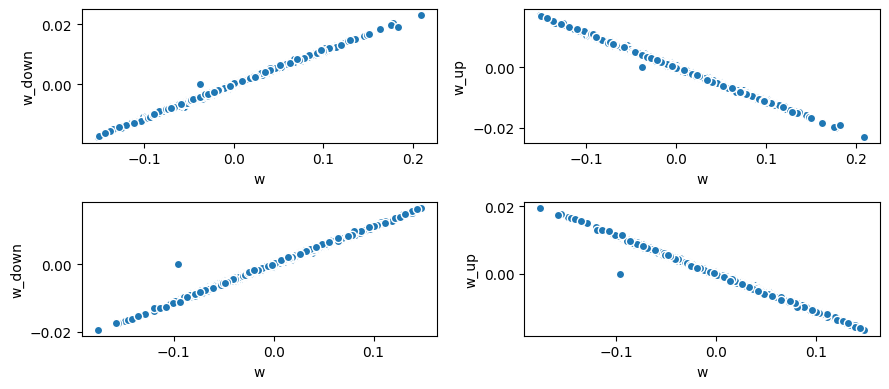

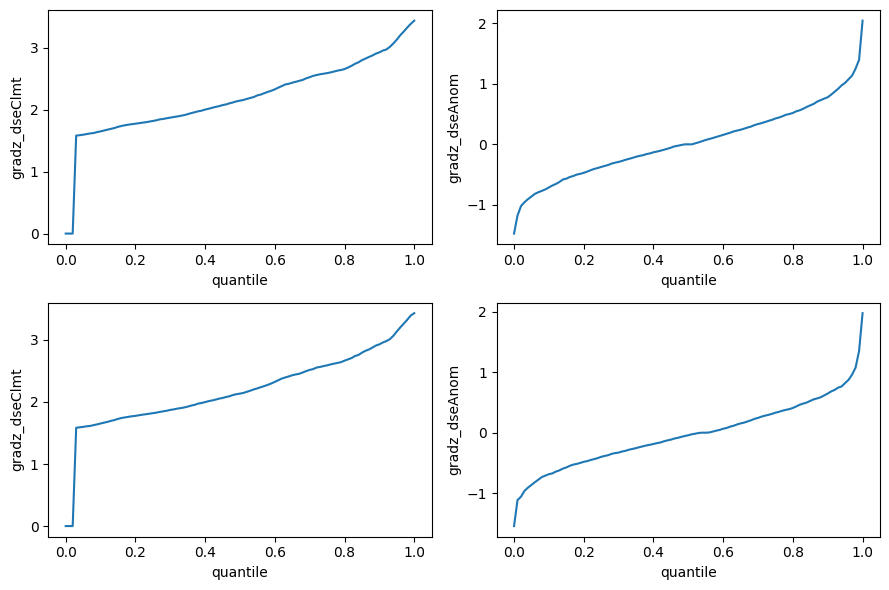

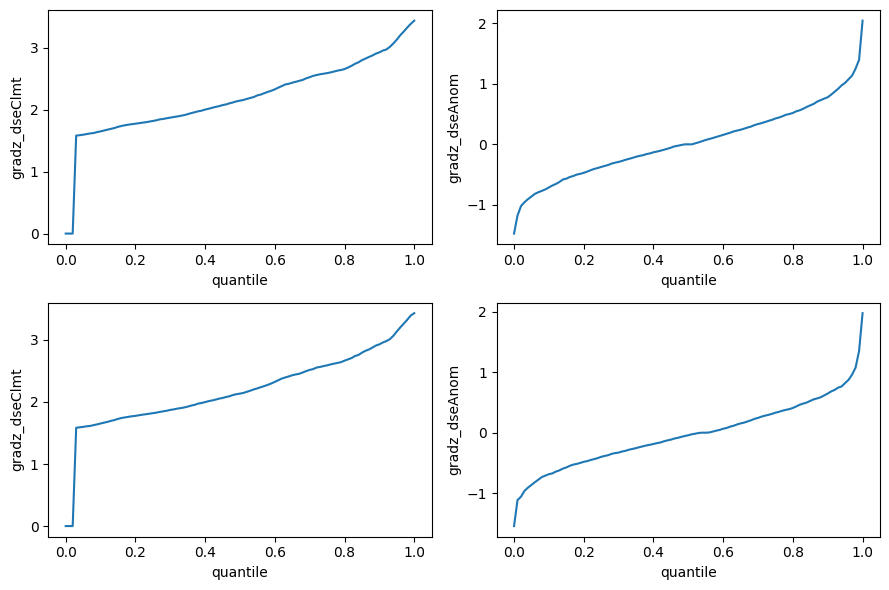

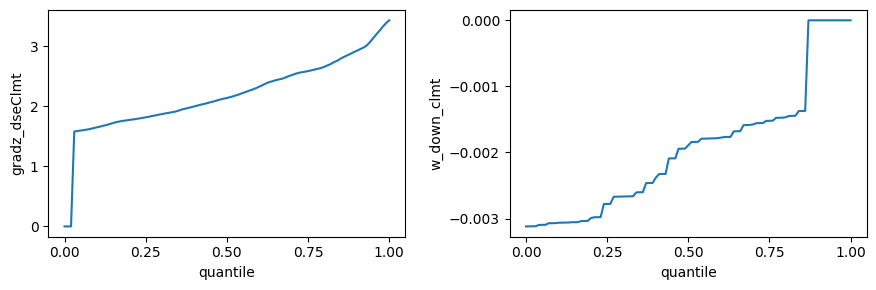

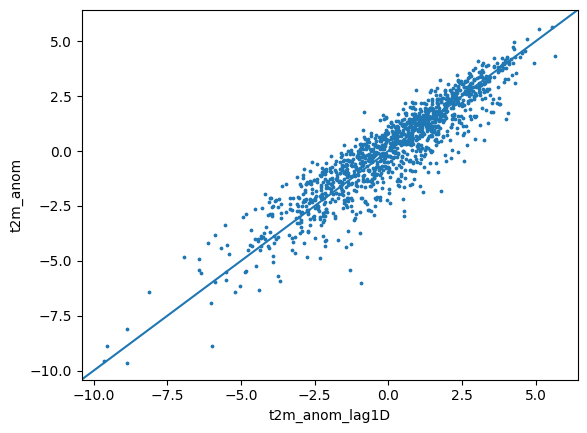

In [688]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *

In [689]:
df_t1.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

In [690]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': 'DejaVu Serif',
#    'lines.markersize': 1,
}

plt.rcParams.update(params)


(467, 56)


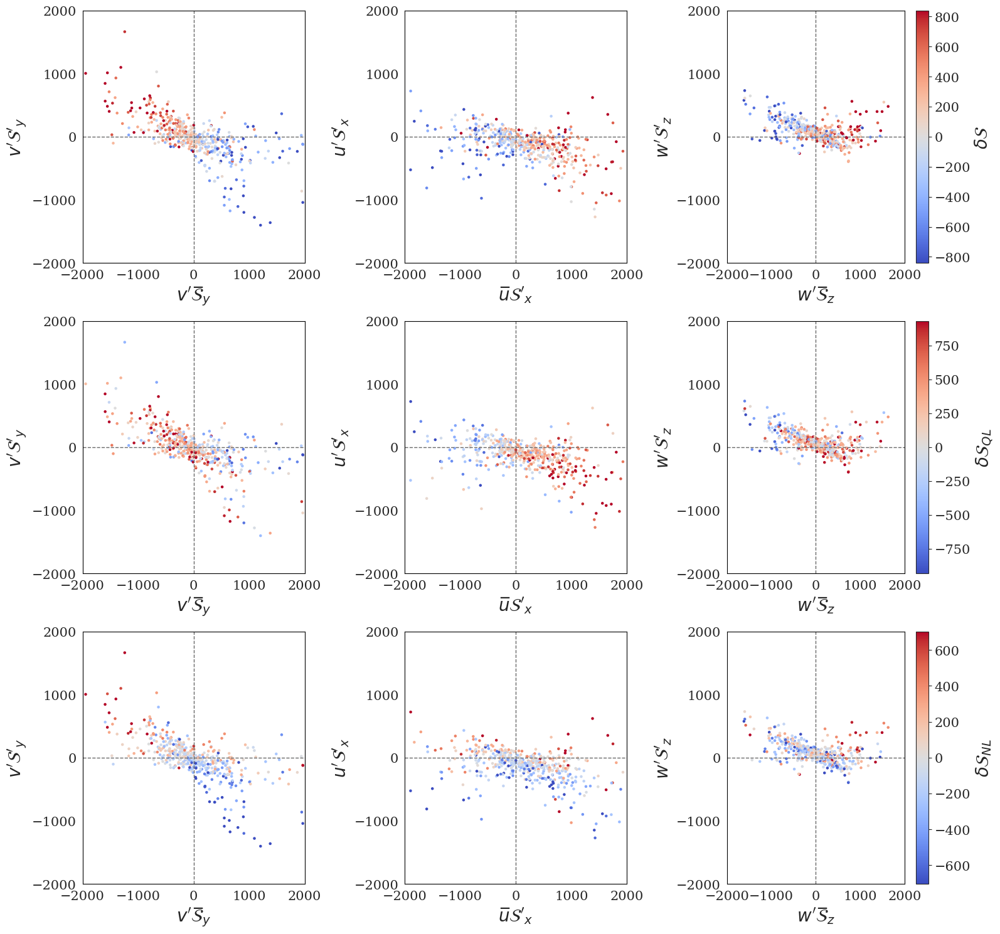

In [691]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(3,3,figsize=(16,15), squeeze=False)

# df_plt = df_t2.copy()
df_plt = df_t1.loc[(df_t1.dse_anom_Lag1 > 0) & (df_t1[dy_s_anom] > 0) & (df_t1.month == 4)].copy()
df_plt.rename({'T_main':tmain_term,'NL_sum': nl_term, 'Net_Adv':netadv_term}, axis=1, inplace=True)
print(df_plt.shape)
plot_breakdowns(df_plt, square_boxes=True, tmain_term=tmain_term, nl_term=nl_term, netadv_term=netadv_term)

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_posBG1_phase_interactions.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


# PosBG scatterplots


## Growth

(678, 56)


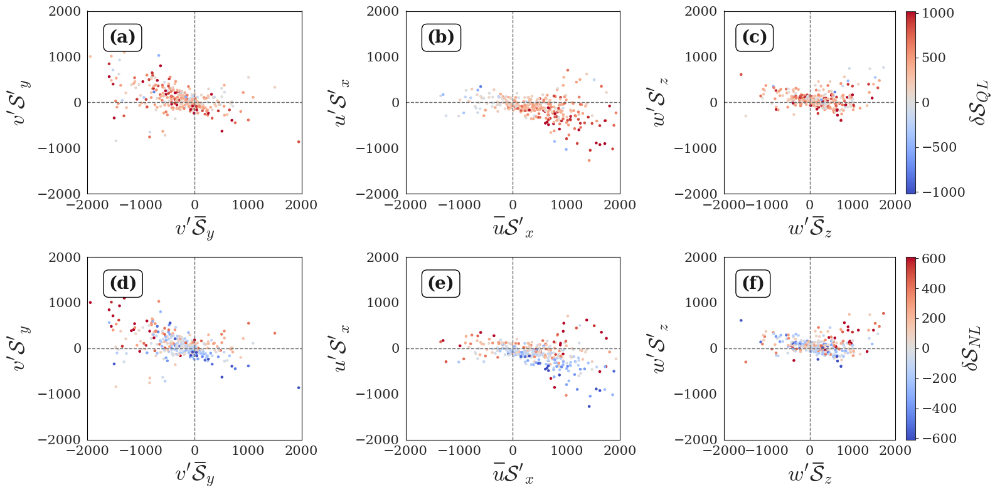

In [298]:

mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['mathtext.fontset'] = 'cm'  # Use Computer Modern font

params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(2,3,figsize=(16,8), squeeze=False)

# df_plt = df_t2.copy()
df_plt = df_t1.loc[(df_t1['dse_anom_Lag1'] > 0) & (df_t1.month == 4)].copy() # & (df_t1[dy_s_anom] > 0) 
df_plt.rename({'T_main':tmain_term,'NL_sum': nl_term, 'Net_Adv':netadv_term}, axis=1, inplace=True)
print(df_plt.shape)
plot_breakdowns_2(df_plt, square_boxes=True, tmain_term=tmain_term, nl_term=nl_term, netadv_term=netadv_term)

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')
base_size = 20
k=0
for r in range(2):
    for c in range(3):
        ax[r][c].text(.1, .9, '({})'.format(chr(k+97)), transform=ax[r][c].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
        k+=1

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_posBG1_growth_phase_interactions.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## Decay

(678, 56)


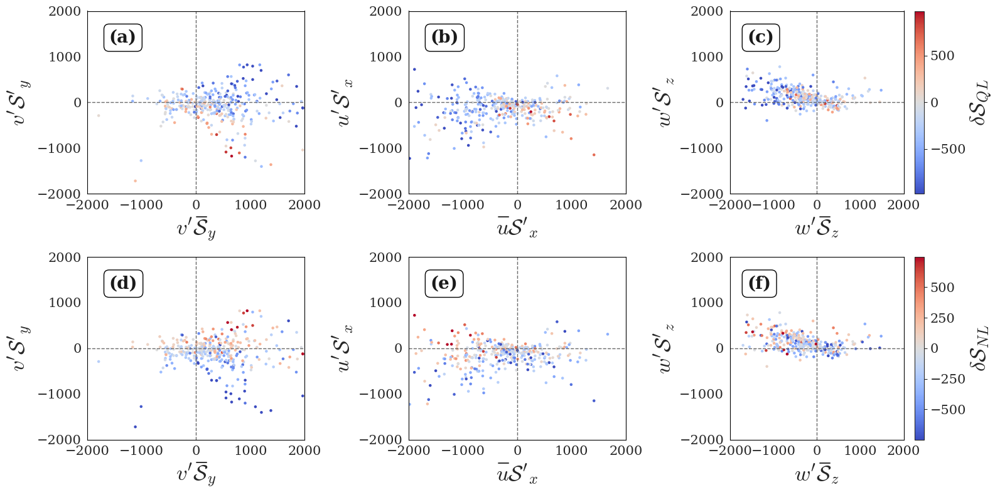

In [297]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(2,3,figsize=(16,8), squeeze=False)

# df_plt = df_t2.copy()
df_plt = df_t1.loc[(df_t1['dse_anom_Lag1'] > 0) & (df_t1.month == 4)].copy() # & (df_t1[dy_s_anom] > 0) 
df_plt.rename({'T_main':tmain_term,'NL_sum': nl_term, 'Net_Adv':netadv_term}, axis=1, inplace=True)
print(df_plt.shape)
plot_breakdowns_3(df_plt, square_boxes=True, tmain_term=tmain_term, nl_term=nl_term, netadv_term=netadv_term)

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')
base_size = 20
k=0
for r in range(2):
    for c in range(3):
        ax[r][c].text(.1, .9, '({})'.format(chr(k+97)), transform=ax[r][c].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
        k+=1

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_posBG1_decay_phase_interactions.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


# NegBG scatterplots


## Growth

(556, 56)


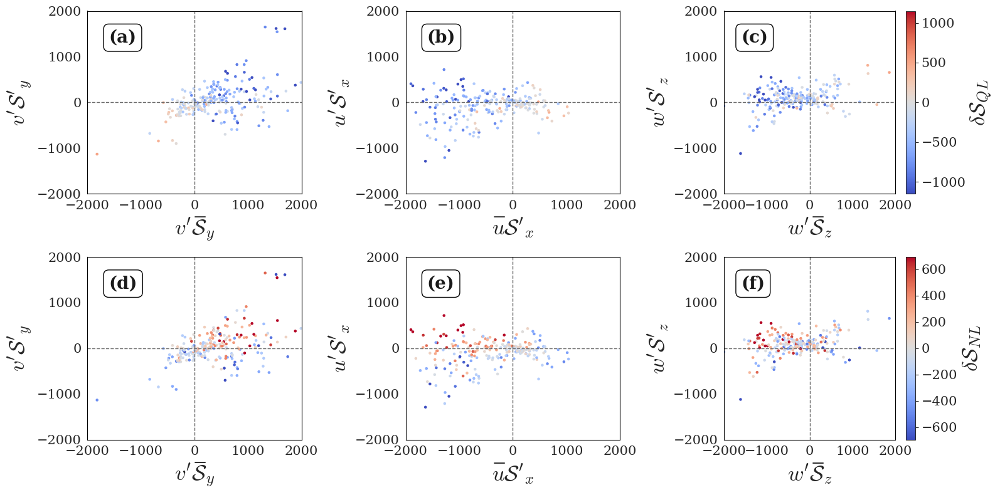

In [296]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(2,3,figsize=(16,8), squeeze=False)

# df_plt = df_t2.copy()
df_plt = df_t1.loc[(df_t1['dse_anom_Lag1'] < 0) & (df_t1.month == 4)].copy() # & (df_t1[dy_s_anom] > 0) 
df_plt.rename({'T_main':tmain_term,'NL_sum': nl_term, 'Net_Adv':netadv_term}, axis=1, inplace=True)
print(df_plt.shape)
plot_breakdowns_3(df_plt, square_boxes=True, tmain_term=tmain_term, nl_term=nl_term, netadv_term=netadv_term)

props = dict(boxstyle='round', facecolor='none', alpha=1, edgecolor='black')
base_size = 20
k=0
for r in range(2):
    for c in range(3):
        ax[r][c].text(.1, .9, '({})'.format(chr(k+97)), transform=ax[r][c].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
        k+=1


pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_negBG_growth_phase_interactions.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## Decay

NameError: name 'tmain_term' is not defined

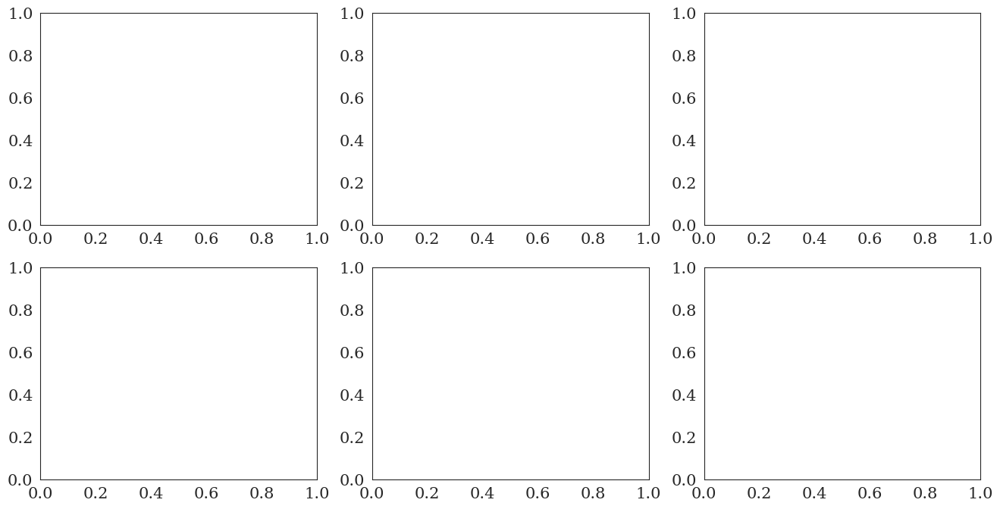

In [681]:
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(2,3,figsize=(16,8), squeeze=False)

# df_plt = df_t2.copy()
df_plt = df_t1.loc[(df_t1['dse_anom_Lag1'] < 0) & (df_t1.month == 4)].copy() # & (df_t1[dy_s_anom] > 0) 
df_plt.rename({'T_main':tmain_term,'NL_sum': nl_term, 'Net_Adv':netadv_term}, axis=1, inplace=True)
print(df_plt.shape)
plot_breakdowns_2(df_plt, square_boxes=True, tmain_term=tmain_term, nl_term=nl_term, netadv_term=netadv_term)

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')
base_size = 20
k=0
for r in range(2):
    for c in range(3):
        ax[r][c].text(.1, .9, '({})'.format(chr(k+97)), transform=ax[r][c].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
        k+=1


pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_negBG_decay_phase_interactions.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## Secondary tree

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    124
1    123
2    123
3    124
4    123
5    123
6    124
7    123
8    123
9    124
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-6.5,-1.2]', 1: '(-1.2,-0.8]', 2: '(-0.8,-0.5]', 3: '(-0.5,-0.2]', 4: '(-0.2,0.0]', 5: '(0.0,0.2]', 6: '(0.2,0.4]', 7: '(0.4,0.7]', 8: '(0.7,1.2]', 9: '(1.2,3.6]'}
['(-6.5,-1.2]', '(1.2,3.6]']
Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$\mathcal{S}'_{Lag1}$', 'adv_recon_2Dave_clss'],
      dtype='object')
Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$\mathcal{S}'_{Lag1}$'],
      dtype='object')
mod accuracy score with criterion entropy: 0.7782
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       124
           1       0.79      0.76      0.77       124

    accu

/tmp/ipykernel_2869403/95241606.py:70: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.


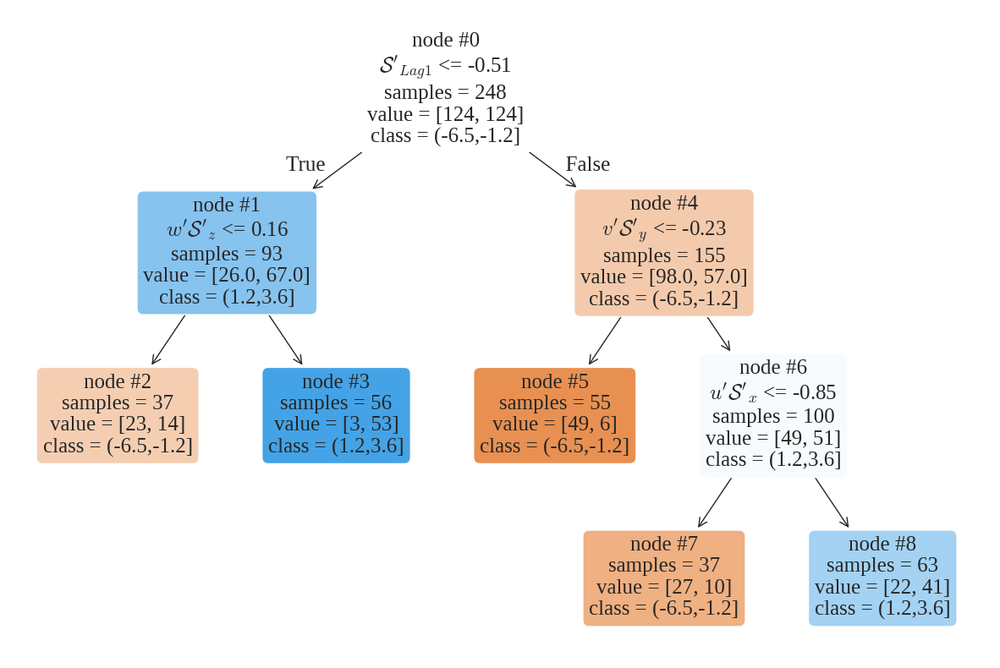

sec_tree_April_DSEdiff_10Cat_depth3_modified
mon_str = 4


In [292]:
import random

# Note: 
# under adv_recon_2Dave as the dependent variable, and only the NL terms as IVs, 
## using df_mst gives clear separation of drivers in the two tails, 
## using df_mst2 (2Daveraged) makes u's' and v's' comparable in the left tail 

k = random.randint(0, 2**20)
# global df_vi
df_to_use = 'df_t1'
# df_to_use = 'df_mst'
df = globals()[f'{df_to_use}'].dropna().copy()
mon_lst=[4]
df = df.rename({'dse_anom_Lag1': '$\mathcal{S}\'_{Lag1}$'}, axis=1)

y_var = 'adv_recon_2Dave' if df_to_use in ['df_mst2', 'df_t1'] else 'adv_recon' if df_to_use == 'df_mst' else np.nan
#     y_var = 'adv_recon_2'
col_arr = eddy_eddy + ['$\mathcal{S}\'_{Lag1}$', ]#dy_s_anom, dz_s_anom+ ['T_main'] + ['t2m_anom'] #+ set_insig #+ mean_mean + set_main #
# col_arr = eddy_eddy + [dy_s_anom]#dy_s_anom, dz_s_anom+ ['T_main'] + ['t2m_anom'] #+ set_insig #+ mean_mean + set_main #

for mon in mon_lst:
    df_vi = pd.DataFrame()
#     mon_lst=[mon]
#     print(mon)

    dir_mods = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/mar_apr/' if mon in [3,4] else \
    '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/may_jun/' if mon in [5,6] else np.nan

    os.chdir(dir_mods)

#     df_dt = df_mst2.loc[(df_mst2['month'] == 4) & (df_mst2['dse_anom_Lag1']>0)].copy()
    
    df_dt = df.loc[(df['month'] == 4)].copy() #  & (df['dse_anom_Lag1']>0)
#     df_dt = df.loc[(df['month'] == 4) & (df['dse_anom_Lag1']<0)].copy()
    
    df_dt['T_main'] = df_dt[[x_main,y_main,z_main]].sum(axis=1)
    
    X = df_dt[col_arr]
    standardize = True
    # X_iv, y_dv = X, y

#     df_dt = df_dt.assign(y_var = ((df_dt[y_var] - df_dt[y_var].mean())/df_dt[y_var].std()).values)

    if standardize == True:
        df_dt.loc[:,y_var] = ((df_dt[y_var] - df_dt[y_var].mean())/df_dt[y_var].std()).values
        X_iv = standardize_df(X)
    else:
        X_iv = X.copy()

    num_classes = 10
    n = num_classes
#     inds = [0,1]
#     inds = [8,9]
    inds = [0,9]
#     inds = [1,2,3]

    df_dt, globals()[f'{y_var}_class_map'] = create_classes(df_dt, y_var = y_var, num_classes = num_classes)

    y = df_dt['{}_clss'.format(y_var)].copy()
    y_dv = y

    df_mod = pd.concat([X_iv,y_dv], axis=1)
    df_mod = df_mod.loc[df_mod['{}_clss'.format(y_var)].isin(inds)]

    labels0 = list(globals()[f'{y_var}_class_map'].values())
    labels = [labels0[i] for i in inds]
    print(labels)
    print(df_mod.columns)
    
    df_mod['{}_clss'.format(y_var)] = df_mod['{}_clss'.format(y_var)].replace(dict(zip(inds, range(len(inds)))))
    
    iv_list, df_vi, expected_y, predicted_y, x_train, y_train, tree_mod = \
    make_tree(
        df_iv = df_mod[col_arr], 
        df_comb = df_mod,
        y_var = '{}_clss'.format(y_var),  
        month = '_'.join([month_map[key] for key in mon_lst]), 

#         entropy_decrease_thresh=0.005, 
#         ccp_alpha=0.015,
        entropy_decrease_thresh=0.03, 
        ccp_alpha=0.03,
        min_samples= round(0.15*df_mod.shape[0]),        
        min_samples_split = round(0.3*df_mod.shape[0]),
        
        precision = 2,
        depth_param=3, 
        fontsize=18,
        vert_lev_str_append= 'sec_tree', # 'LL_dseChange' if y_var == 'coready_dse_del1' else \
#         'LL_dse_flxs' if y_var == 'adv_recon' else np.nan,
        k = k, 
        num_classes=num_classes,
        rotation=False,
        labels = labels, dir_mods = dir_mods, 
        
        nodes_add_class=False, 
        nodes_add_samples=False,
        nodes_add_value=True,
        
        node_id_show=True,

        testing='off',
        test_size=0.25,
        col_param=True,
        return_vimps = True,
             )
    
#     print('outside func', df_vi)
    
    mon_str = '_'.join([str(key) for key in mon_lst])
    print('mon_str =', mon_str)
    globals()[f'df_vi_{mon_str}'] = df_vi.copy()
    globals()[f'df_vi_{mon_str}']['month'] = mon_lst[0]


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    124
1    123
2    123
3    124
4    123
5    123
6    124
7    123
8    123
9    124
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-6.5,-1.2]', 1: '(-1.2,-0.8]', 2: '(-0.8,-0.5]', 3: '(-0.5,-0.2]', 4: '(-0.2,0.0]', 5: '(0.0,0.2]', 6: '(0.2,0.4]', 7: '(0.4,0.7]', 8: '(0.7,1.2]', 9: '(1.2,3.6]'}
['(-6.5,-1.2]', '(1.2,3.6]']
Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$\mathcal{S}'_{Lag1}$', 'adv_recon_2Dave_clss'],
      dtype='object')
Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$\mathcal{S}'_{Lag1}$'],
      dtype='object')
mod accuracy score with criterion entropy: 0.7782
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       124
           1       0.79      0.76      0.77       124

    accu

/tmp/ipykernel_2869403/4289342563.py:70: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.


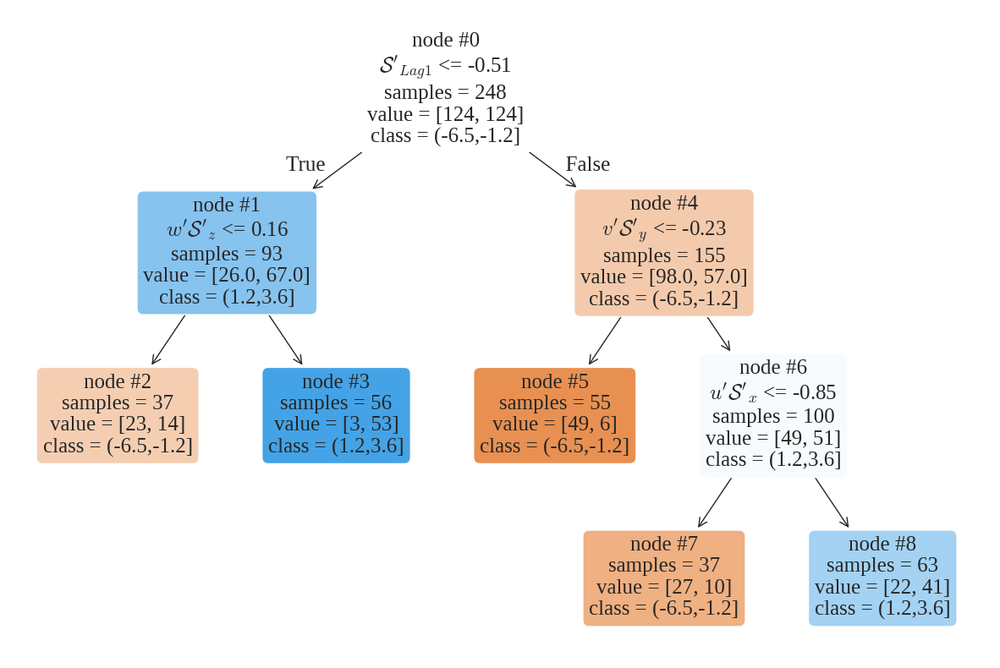

sec_tree_April_DSEdiff_10Cat_depth6_modified
mon_str = 4


In [293]:
import random

# Note: 
# under adv_recon_2Dave as the dependent variable, and only the NL terms as IVs, 
## using df_mst gives clear separation of drivers in the two tails, 
## using df_mst2 (2Daveraged) makes u's' and v's' comparable in the left tail 

k = random.randint(0, 2**20)
# global df_vi
df_to_use = 'df_t1'
# df_to_use = 'df_mst'
df = globals()[f'{df_to_use}'].dropna().copy()

df = df.rename({'dse_anom_Lag1': '$\mathcal{S}\'_{Lag1}$'}, axis=1)

y_var = 'adv_recon_2Dave' if df_to_use in ['df_mst2', 'df_t1'] else 'adv_recon' if df_to_use == 'df_mst' else np.nan
#     y_var = 'adv_recon_2'
col_arr = eddy_eddy + ['$\mathcal{S}\'_{Lag1}$']#dy_s_anom, dz_s_anom+ ['T_main'] + ['t2m_anom'] #+ set_insig #+ mean_mean + set_main #
# col_arr = eddy_eddy + [dy_s_anom]#dy_s_anom, dz_s_anom+ ['T_main'] + ['t2m_anom'] #+ set_insig #+ mean_mean + set_main #

for mon in [4]:
    df_vi = pd.DataFrame()
#     mon_lst=[mon]
#     print(mon)

    dir_mods = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/mar_apr/' if mon in [3,4] else \
    '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/models/may_jun/' if mon in [5,6] else np.nan

    os.chdir(dir_mods)

#     df_dt = df_mst2.loc[(df_mst2['month'] == 4) & (df_mst2['dse_anom_Lag1']>0)].copy()
    
    df_dt = df.loc[(df['month'] == 4)].copy() #  & (df['dse_anom_Lag1']>0)
#     df_dt = df.loc[(df['month'] == 4) & (df['dse_anom_Lag1']<0)].copy()
    
    df_dt['T_main'] = df_dt[[x_main,y_main,z_main]].sum(axis=1)
    
    X = df_dt[col_arr]
    standardize = True
    # X_iv, y_dv = X, y

#     df_dt = df_dt.assign(y_var = ((df_dt[y_var] - df_dt[y_var].mean())/df_dt[y_var].std()).values)

    if standardize == True:
        df_dt.loc[:,y_var] = ((df_dt[y_var] - df_dt[y_var].mean())/df_dt[y_var].std()).values
        X_iv = standardize_df(X)
    else:
        X_iv = X.copy()

    num_classes = 10
    n = num_classes
#     inds = [0,1]
#     inds = [8,9]
    inds = [0,9]
#     inds = [1,2,3]

    df_dt, globals()[f'{y_var}_class_map'] = create_classes(df_dt, y_var = y_var, num_classes = num_classes)

    y = df_dt['{}_clss'.format(y_var)].copy()
    y_dv = y

    df_mod = pd.concat([X_iv,y_dv], axis=1)
    df_mod = df_mod.loc[df_mod['{}_clss'.format(y_var)].isin(inds)]

    labels0 = list(globals()[f'{y_var}_class_map'].values())
    labels = [labels0[i] for i in inds]
    print(labels)
    print(df_mod.columns)
    
    df_mod['{}_clss'.format(y_var)] = df_mod['{}_clss'.format(y_var)].replace(dict(zip(inds, range(len(inds)))))
    
    iv_list, df_vi, expected_y, predicted_y, x_train, y_train, tree_mod = \
    make_tree(
        df_iv = df_mod[col_arr], 
        df_comb = df_mod,
        y_var = '{}_clss'.format(y_var),  
        month = '_'.join([month_map[key] for key in mon_lst]), 

#         entropy_decrease_thresh=0.005, 
#         ccp_alpha=0.015,
        entropy_decrease_thresh=0.03, 
        ccp_alpha=0.03,
        min_samples= round(0.15*df_mod.shape[0]),        
        min_samples_split = round(0.3*df_mod.shape[0]),
        
        precision = 2,
        depth_param=6, 
        fontsize=18,
        vert_lev_str_append= 'sec_tree', # 'LL_dseChange' if y_var == 'coready_dse_del1' else \
#         'LL_dse_flxs' if y_var == 'adv_recon' else np.nan,
        k = k, 
        num_classes=num_classes,
        rotation=False,
        labels = labels, dir_mods = dir_mods, 
        
        nodes_add_class=False, 
        nodes_add_samples=False,
        nodes_add_value=True,
        
        node_id_show=True,

        testing='off',
        test_size=0.25,
        col_param=True,
        return_vimps = True,
             )
    
#     print('outside func', df_vi)
    
    mon_str = '_'.join([str(key) for key in mon_lst])
    print('mon_str =', mon_str)
    globals()[f'df_vi_{mon_str}'] = df_vi.copy()
    globals()[f'df_vi_{mon_str}']['month'] = mon_lst[0]


Text(0.5, 0, '')

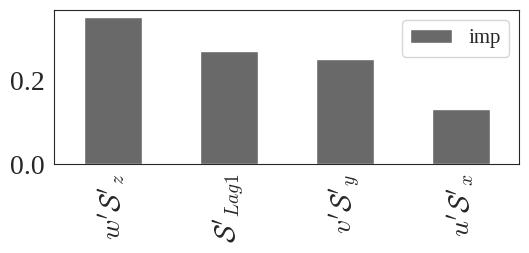

In [294]:
df_vi

params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(1,1,figsize=(6,2))
df_vi.iloc[:4,].plot.bar(x='var_name', y='imp', color='dimgray',ax=ax)
plt.xlabel('')

In [295]:
print(tree_mod.tree_.value)

srs_dt_labs = pd.Series(
    data = tree_mod.tree_.apply(df_mod[X_iv.columns].values.astype('float32')), 
    index = df_mod.index, 
    name = 'node_id')

# print(srs_dt_labs.head())

# max_flx_cls = 9

df_nodelabs = pd.merge(X_iv,y_dv, left_index=True, right_index=True)\
.merge(srs_dt_labs, left_index=True, right_index=True)

print(df_nodelabs.shape)
print(df_nodelabs.columns)


[[[0.5        0.5       ]]

 [[0.27956989 0.72043011]]

 [[0.62162162 0.37837838]]

 [[0.05357143 0.94642857]]

 [[0.63225806 0.36774194]]

 [[0.89090909 0.10909091]]

 [[0.49       0.51      ]]

 [[0.72972973 0.27027027]]

 [[0.34920635 0.65079365]]]
(248, 6)
Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$\mathcal{S}'_{Lag1}$', 'adv_recon_2Dave_clss', 'node_id'],
      dtype='object')


In [296]:
# max_flx_cls = 9
lab_int = 8

dts = df_nodelabs.query('node_id == {}'.format(lab_int)).index
# .query('node_id == {} & {}_clss == {}'.format(lab_int, y_var, max_flx_cls)).index
# 
print(len(dts))
df_filt = df_dt.filter(items = dts, axis=0).copy()
# df_filt[eddy_eddy + ['T_main', 'NL_sum', 'Net_Adv', 'adv_recon_2Dave_clss']].sort_values('T_main')

63


In [297]:

labels[0] = 'Negative: ' + labels[0]
labels[1] = 'Positive: ' + labels[1]


# color_blind_friendly_colors

redcolor = '#ca4842' #'#67001f'
bluecolor = '#3884bb' #'#053061'


In [302]:
import cairosvg
import IPython.display as display
from dtreeviz import colors
from dtreeviz.colors import *
from io import BytesIO

# plt.rcParams['font.family'] = 'DeJavu Serif'
# plt.rcParams['font.serif'] = ['Times New Roman']
# plt.rcdefaults()
plt.rcParams['font.family'] = 'Liberation Serif'
color_blind_friendly_colors[2] = [bluecolor, redcolor]
# color_blind_friendly_colors[3] = [bluecolor, GREY, redcolor]

viz = dtreeviz.model(
    tree_mod, 
    x_train, 
    y_train, 
#     target_name='Decile based extremes of $\mathregular{T_{Net}}$',
    target_name='Extreme Deciles of $\delta \mathcal{S}$',
    feature_names=col_arr,
    class_names=labels,
)

import dtreeviz.utils

# Override the default rounding function
dtreeviz.utils.myround = lambda x: round(x, 1)

v_sec = viz.view(scale=1.8, 
             label_fontsize=25, 
             ticks_fontsize=16, 
#              ticks_fontsize=12, 
             leaftype= 'pie', #'barh', 
             histtype='barstacked', 
              fontname='Liberation Serif',

#              colors=dict(zip([str(s) for s in adv_recon_class_map.values()], ['#FF0000', '#00FF00', '#0000FF'])),
             orientation='TD',
             show_root_edge_labels=True,
             show_node_labels=True,
#              highlight_path= [3,7,10,14]
#              x= x_train[0], #['Node 0', 'Node 8', 'Node 9'], 
#              show_just_path=2
#              depth_range_to_display = range(0,6)
            )

# p = cairosvg.svg2png(v_sec.svg().encode(), scale=2)
# # display.Image(p, retina=True)
svg_text = v_sec.svg()

# with open("/home/data/lab_hardik/Manuscript1/apr_sec_tree_raw.svg", "w") as f:
#     f.write(v_sec.svg())
    

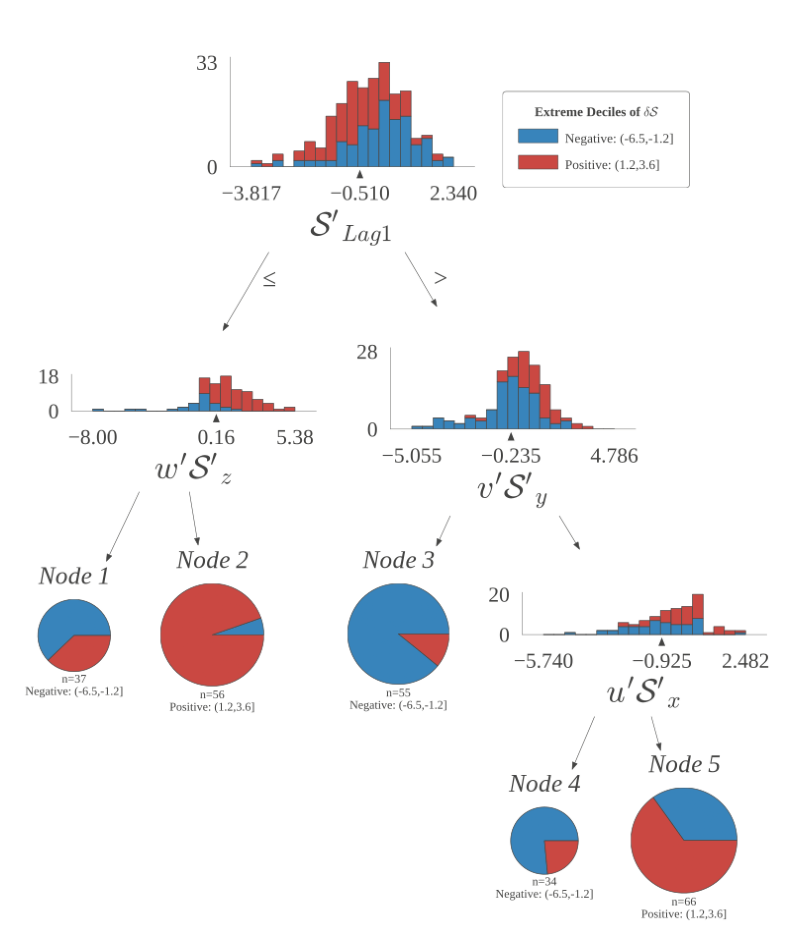

In [333]:
file = "treated_apr_sec_tree_raw.svg" # "NoClasslabs_mar_apr_comb_tree_raw_shortlegendlab"

with open(f"/home/data/lab_hardik/Manuscript1/{file}", "r") as f:
    svg_text = f.read()

# Modify the SVG to update legend's font size
svg_text = svg_text.replace('class="legend"', 'class="legend" style="font-size:50pt;"')  # Adjust the legend font size

# Render the updated SVG using Matplotlib
from PIL import Image
import cairosvg
from io import BytesIO

# Convert SVG to PNG
p_apr_sec = cairosvg.svg2png(bytestring=svg_text.encode('utf-8'))

# Use BytesIO to handle the byte stream 
image_stream = BytesIO(p_apr_sec) 
image_apr_sectree = plt.imread(image_stream, format='png') 
# Create a matplotlib figure 
# fig, ax = plt.subplots(figsize=(12, 15)) 
fig, ax = plt.subplots(figsize=(10, 12)) 
ax.imshow(image_apr_sectree, aspect='auto') 
ax.axis('off') 
# Add the index at the left top of the plot 
# props = dict(boxstyle='round', facecolor='none', alpha=0.8, edgecolor='black')
# ax.text(0, 1, 'a)', transform=ax.transAxes, fontsize=16, fontname ='Liberation Serif', verticalalignment='top', 
#         c='k', bbox=props)

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_DT_secmec_bgcontxt.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF

# Display the image 
plt.show()

## QL-NL relationships wrt bg condition S'Lag1

(4383, 17)
date
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
1980-03-03 00:00:00
2022-06-15 00:00:00
Index(['number', 'step', 'dates_roll_clmt', 'uAnom_AdvFlx_x_dseAnom',
       'vAnom_AdvFlx_y_dseAnom', 'wAnom_AdvFlx_z_dseAnom',
       'uAnom_AdvFlx_x_dseClmt', 'vAnom_AdvFlx_y_dseClmt',
       'wAnom_AdvFlx_z_dseClmt', 'uclmt_AdvFlx_x_dseAnom',
       'vclmt_AdvFlx_y_dseAnom', 'wclmt_AdvFlx_z_dseAnom',
       'uclmt_AdvFlx_x_dseClmt', 'vclmt_AdvFlx_y_dseClmt',
       'wclmt_AdvFlx_z_dseClmt', 'adv_recon', 'coready_dse_del1'],
      dtype='object')
(96, 2)
(4383, 20)
96
(4383, 20)
1980-03-03 00:00:00
(4383, 20)
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_

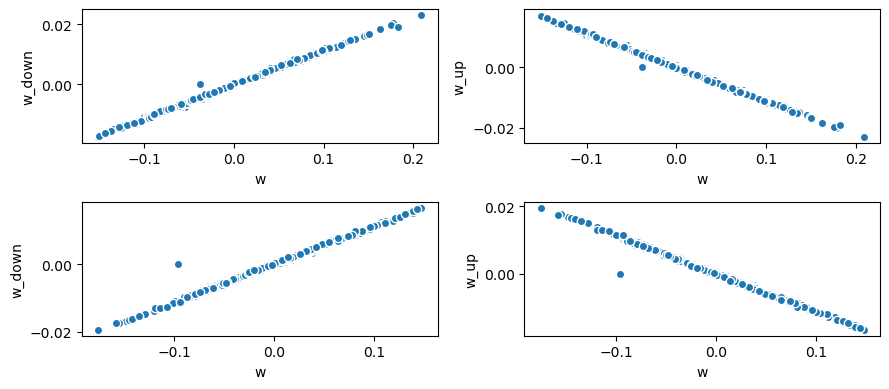

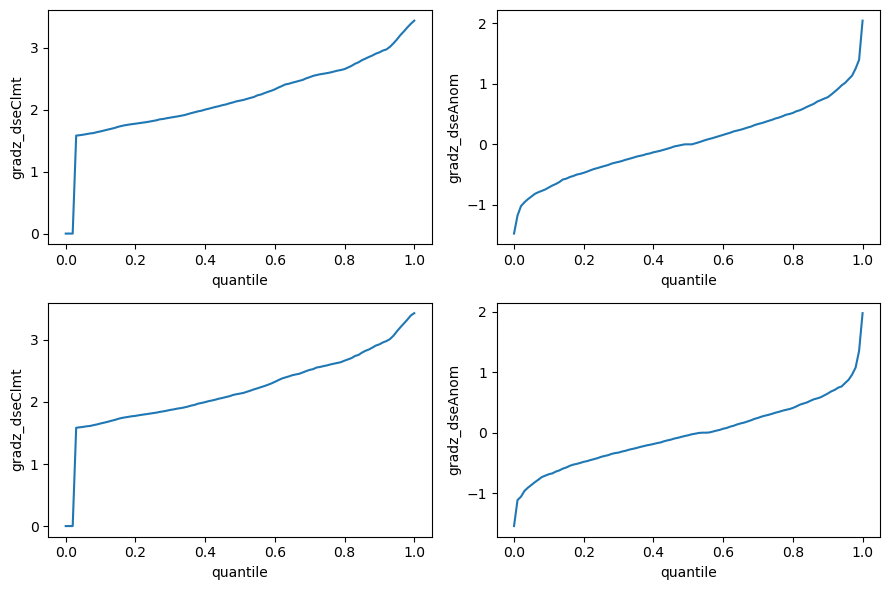

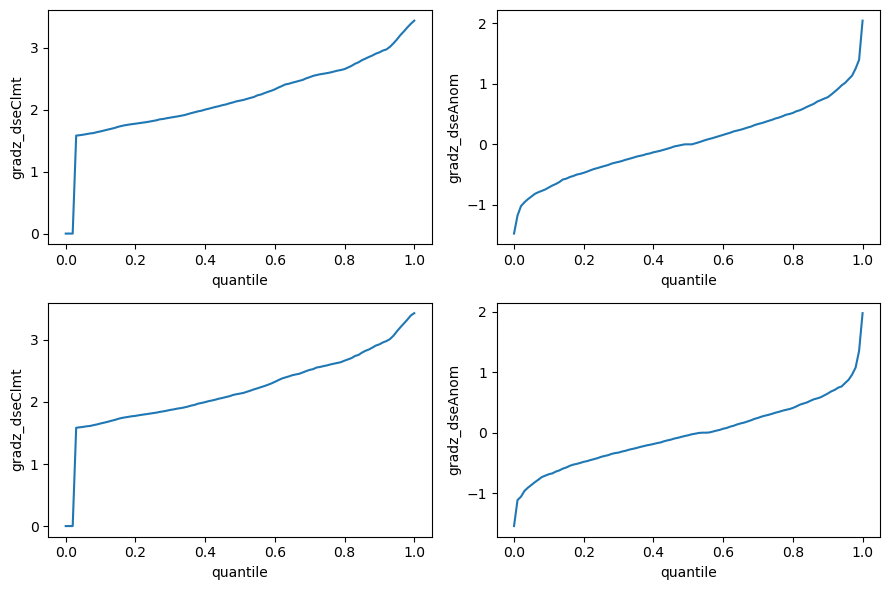

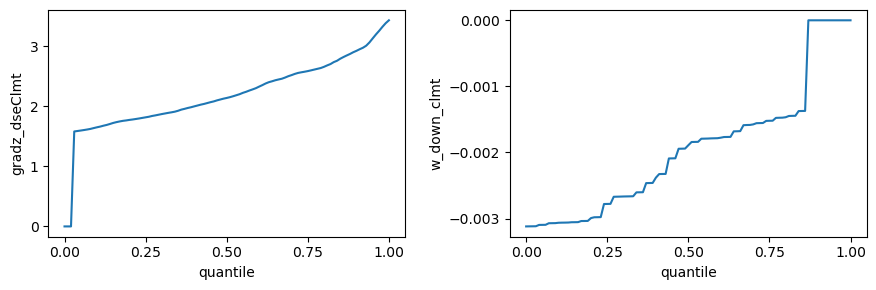

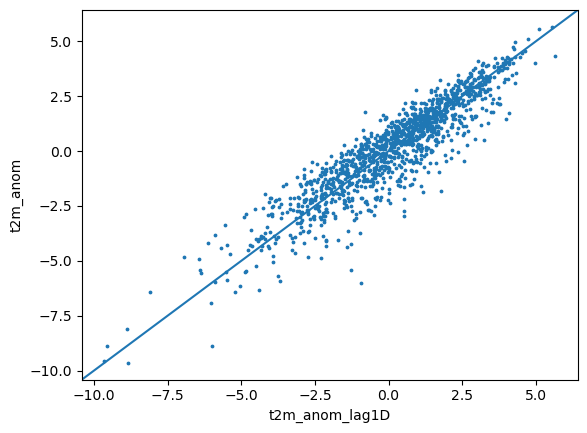

In [137]:
importlib.reload(read_data_DSE_Flux_Trees_1980_2022)
from read_data_DSE_Flux_Trees_1980_2022 import *

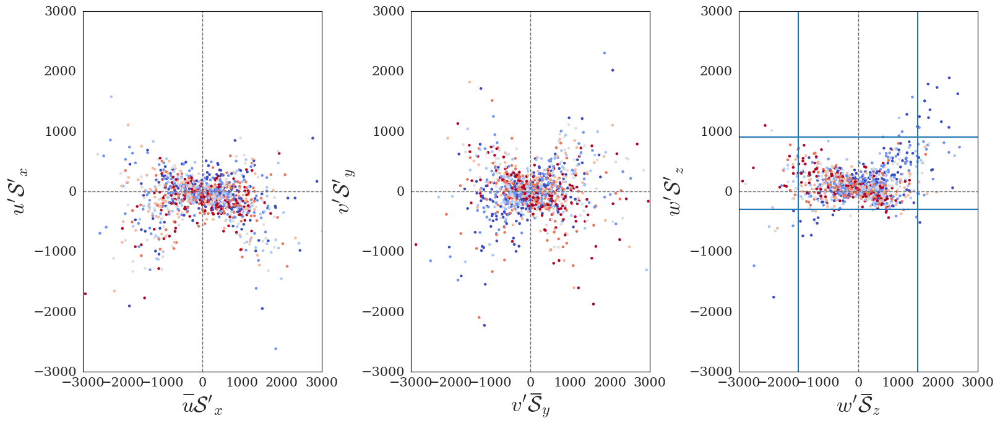

In [334]:
cvar2 = '$\mathcal{S}\'_{Tot, \, Lag1}$'
cvar1 = '$\delta\mathcal{S}_{QL}$'

# df_plt = df_t1.loc[df_t1.month.isin([4])].copy()
df_plt = df_dlyave.loc[df_dlyave.month.isin([4])].copy()

df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)


# interval_arr = [-2500, -850, -150, 150, 850, 2500] if cvar==z_main else [-3000, -300, 300, 3000] if cvar=='adv_recon' else np.nan
interval_arr = (np.round(df_plt[cvar2].quantile(np.linspace(0,1,8))/100)*100).astype(int).values
# interval_arr = np.round(interval_arr/100)*100

ncat = len(interval_arr) - 1
cmap_bgcon = plt.get_cmap('coolwarm', ncat)

norm_bgcon = mpl.colors.BoundaryNorm(interval_arr, cmap_bgcon.N) 


nrow = 1
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

cvar = cvar2

low_qty = np.round(df_plt[cvar].quantile(0.05)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.05)
hi_qty = np.round(df_plt[cvar].quantile(0.95)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(
    x=x_main, y = nl_us, s=5, ax=ax[0,0], 
    colorbar=False, 
#     c='k'
    c=cvar, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=y_main, y = nl_vs, s=5, ax=ax[0,1], 
    colorbar=False, 
#     c='k'
    c=cvar, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=z_main, y = nl_ws, s=5, ax=ax[0,2], 
    colorbar=False, 
#     c='k'
    c=cvar, cmap=cmap_bgcon, norm = norm_bgcon
)

ax[0,2].axhline(900)
ax[0,2].axhline(-300)
ax[0,2].axvline(1500)
ax[0,2].axvline(-1500)

for j in range(3):
#     divider = make_axes_locatable(ax[0,j])
#     cax = divider.append_axes("bottom", size="5%", pad=1) 
#     cbar = fig.colorbar(ax[0,j].collections[0], cax=cax, orientation='horizontal')
#     cbar.set_label(cvar)
#     cbar.ax.tick_params(labelsize=20, rotation=90)

    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_both_bg_NL_QL_ortho_relations.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [335]:
from highlight_text import ax_text


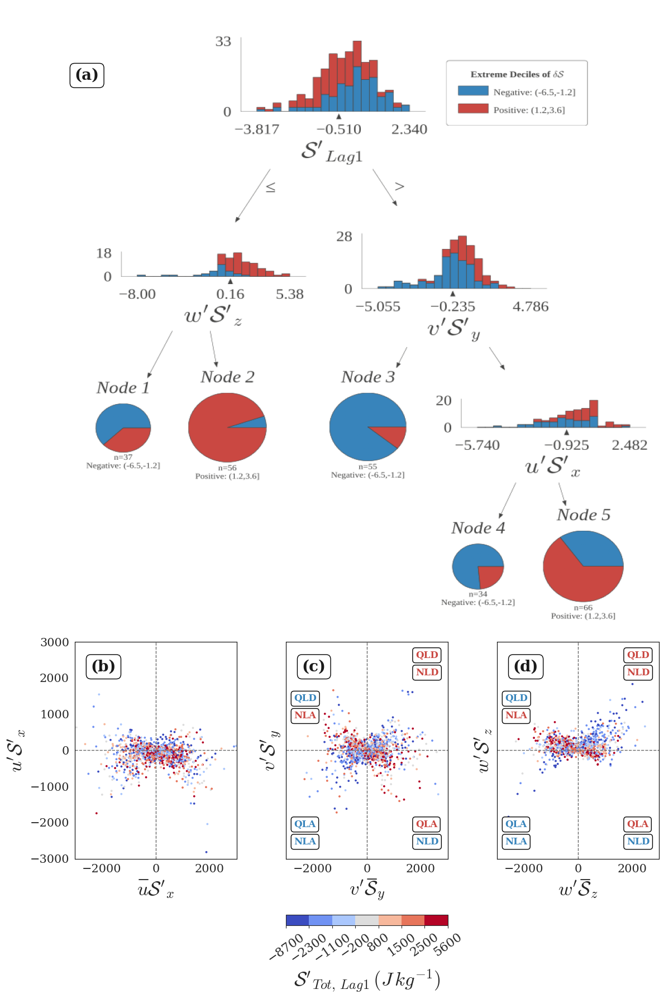

In [338]:
fontname = 'DejaVu Serif'
params = {
    'legend.fontsize': 15,
          'legend.title_fontsize': 20,
#           'figure.figsize': (15, 5),
         'axes.labelsize':25, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
        'font.family': fontname,
#    'lines.markersize': 1,
}

plt.rcParams.update(params)
props = dict(boxstyle='round', facecolor='none', alpha=1, edgecolor='black')

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the overall figure size
fig = plt.figure(figsize=(12, 18))  # Adjust the total size

# Create a GridSpec with 2 rows and 2 columns
gs = gridspec.GridSpec(2, 3, width_ratios=[1,1,1], height_ratios=[1, 1/2.2])

ax = [
    [fig.add_subplot(gs[0, :])], 
    [fig.add_subplot(gs[1, 0]), fig.add_subplot(gs[1, 1]), fig.add_subplot(gs[1, 2])]
]

ax1 = ax[0][0]
ax1.imshow(image_apr_sectree, aspect='auto') 
ax1.axis('off') 

df_plt = df_t1.loc[df_t1.month.isin([4])].copy()
df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)

cvar = cvar2
pt_sz_sctr = 3
df_plt.plot.scatter(
    x=x_main, y = nl_us, c=cvar, s=pt_sz_sctr, ax=ax[1][0], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=y_main, y = nl_vs, c=cvar, s=pt_sz_sctr, ax=ax[1][1], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=z_main, y = nl_ws, c=cvar, s=pt_sz_sctr, ax=ax[1][2], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

sct_phs_annot_fntsz = 12
props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')

c=1
ax[1][c].text(.8, .96, 'QLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .88, 'NLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .18, 'QLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .1, 'NLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')

ax[1][c].text(.05, .18, 'QLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .1, 'NLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .76, 'QLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .68, 'NLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')

c=2
ax[1][c].text(.8, .96, 'QLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .88, 'NLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .18, 'QLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
ax[1][c].text(.8, .1, 'NLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')

ax[1][c].text(.05, .18, 'QLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .1, 'NLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .76, 'QLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
ax[1][c].text(.05, .68, 'NLA', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
              verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')
c=0

# ax[1][c].text(.4, .1, '$\mathcal{S}\'_{Lag1}<0: NLA$', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
#               verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')

# ax[1][c].text(.4, .2, '$<\mathcal{S}\'_{Lag1}>0:> <NLD>$', 
#               highlight_textprops = [{"color":redcolor, "color":bluecolor}], 
#               transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
#               verticalalignment='top', c=bluecolor, bbox=props, fontweight='bold')
# '$\mathcal{S}\'_{Lag1}>0: <NLD>$'
# ax_text(x=.4, y=-.2, s='$\mathcal{S}\'_{Lag1} \lt 0$:, <NLD>', highlight_textprops = [{"color":bluecolor}], 
#        ax=ax[1][c], bbox=props, fontweight='bold')
# ax[1][c].text(.75, .2, 'NLD', transform=ax[1][c].transAxes, fontsize=sct_phs_annot_fntsz, 
#               verticalalignment='top', c=redcolor, bbox=props, fontweight='bold')

for j in range(3):
    
    divider = make_axes_locatable(ax[1][j])
    cax = divider.append_axes("bottom", size="5%", pad=1) 
    
    if j==1:
        cbar = fig.colorbar(ax[1][j].collections[0], cax=cax, orientation='horizontal')
        cbar.set_label(cvar + '$\,(J\,kg^{-1})$', fontsize=25, fontname = fontname)
        cbar.ax.tick_params(labelsize=16, rotation=35)
        
    else:
        cax.set_visible(False)

    ax[1][j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[1][j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[1][j].set_facecolor("white")
    
    ax[1][j].set_xlim(-3000,3000)
    ax[1][j].set_ylim(-3000,3000)
    
    if j>0:
        ax[1][j].set_yticks([])

    for spine in ax[1][j].spines.values():
        spine.set_edgecolor('black')

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='black')
base_size = 20
ax1.text(0, .9, '(a)', transform=ax1.transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1][0].text(.1, .92, '(b)', transform=ax[1][0].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1][1].text(.1, .92, '(c)', transform=ax[1][1].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1][2].text(.1, .92, '(d)', transform=ax[1][2].transAxes, fontsize=base_size, fontname =fontname, 
         verticalalignment='top', c='k', bbox=props, fontweight='bold')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_secDT_bgsctr.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [ ]:
cvar2 = '$\mathcal{S}\'_{Tot, \, Lag1}$'
cvar1 = '$\delta\mathcal{S}_{QL}$'
df_plt = df_t1.loc[df_t1.month.isin([3])].copy()
df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)


# interval_arr = [-2500, -850, -150, 150, 850, 2500] if cvar==z_main else [-3000, -300, 300, 3000] if cvar=='adv_recon' else np.nan
interval_arr = (np.round(df_plt[cvar2].quantile(np.linspace(0,1,8))/100)*100).astype(int).values
# interval_arr = np.round(interval_arr/100)*100

ncat = len(interval_arr) - 1
cmap_bgcon = plt.get_cmap('coolwarm', ncat)

norm_bgcon = mpl.colors.BoundaryNorm(interval_arr, cmap_bgcon.N) 


nrow = 1
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

cvar = cvar2

low_qty = np.round(df_plt[cvar].quantile(0.05)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.05)
hi_qty = np.round(df_plt[cvar].quantile(0.95)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(
    x=x_main, y = nl_us, c=cvar, s=5, ax=ax[0,0], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,1], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=z_main, y = nl_ws, c=cvar, s=5, ax=ax[0,2], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)


for j in range(3):
    divider = make_axes_locatable(ax[0,j])
    cax = divider.append_axes("bottom", size="5%", pad=1) 
    cbar = fig.colorbar(ax[0,j].collections[0], cax=cax, orientation='horizontal')
    cbar.set_label(cvar)
    cbar.ax.tick_params(labelsize=20, rotation=90)

    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-4000,4000)
    ax[0,j].set_ylim(-4000,4000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Mar_both_bg_NL_QL_ortho_relations.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## QL-NL relationships wrt bg condition S'Lag1 and dynamical indicator S'y

In [41]:
Slag1 = '$\\mathcal{S}\'_{Lag1}$'
delS_ql = '$\mathregular{T_{QL}}$'

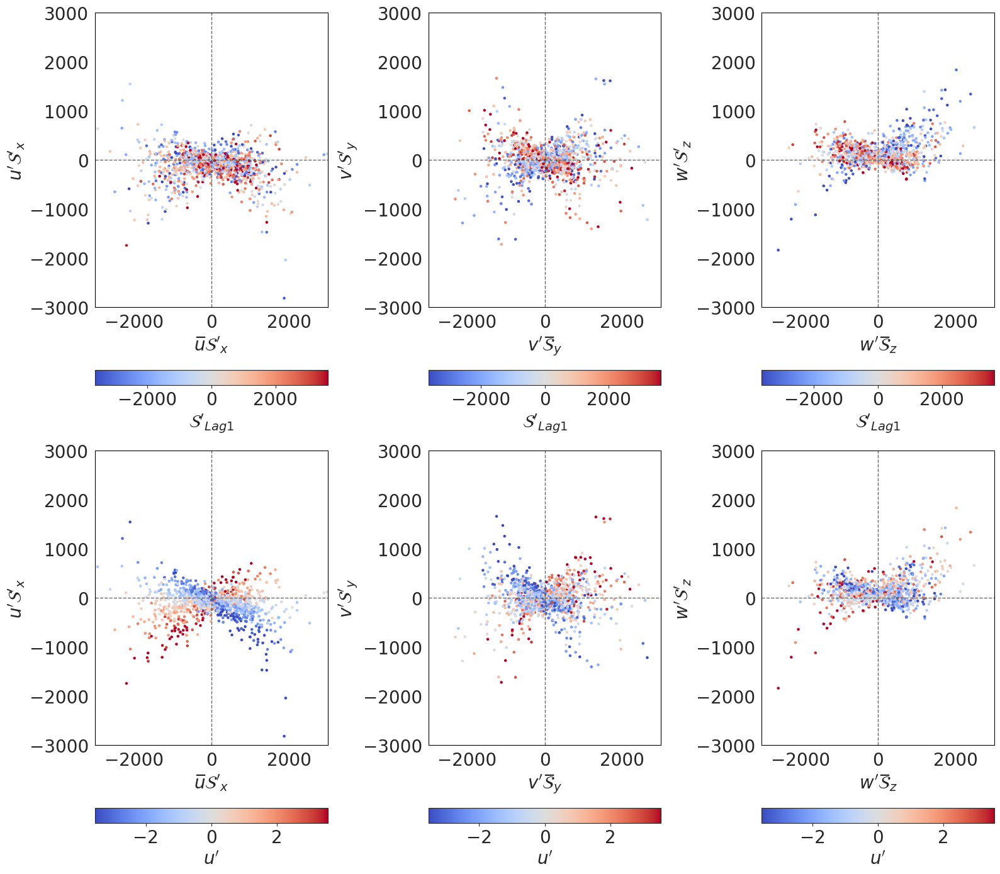

In [36]:
nrow = 2
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

cvar1 = delS_ql
cvar2 = Slag1
cvar3 = dy_s_anom

df_plt = df_t1.loc[df_t1.month.isin([4])].copy()
df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)

cvar = cvar2
# cvar = cvar3

low_qty = np.round(df_plt[cvar].quantile(0.05)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.05)
hi_qty = np.round(df_plt[cvar].quantile(0.95)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[0,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[0,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[0,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[0,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[0,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[0,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[0,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[0,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[0,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

### Row 2
# cvar = cvar2
cvar = uanom #cvar3

low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[1,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[1,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[1,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[1,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[1,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[1,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[1,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[1,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[1,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[1,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[1,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[1,j].set_facecolor("white")
    
    ax[1,j].set_xlim(-3000,3000)
    ax[1,j].set_ylim(-3000,3000)

    for spine in ax[1,j].spines.values():
        spine.set_edgecolor('black')

# ## Row 3
# # cvar = cvar2
# cvar = dy_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[2,1], colorbar=False, vmin=vmin, vmax=vmax)
# divider = make_axes_locatable(ax[2,1])
# cax = divider.append_axes("bottom", size="5%", pad=1) 
# cbar = fig.colorbar(ax[2,1].collections[0], cax=cax, orientation='horizontal') 
# cbar.set_label(cvar)

# cvar = dz_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[2,2], colorbar=False, vmin=vmin, vmax=vmax)
# divider2 = make_axes_locatable(ax[2,2])
# cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
# cbar2 = fig.colorbar(ax[2,2].collections[0], cax=cax2, orientation='horizontal') 
# cbar2.set_label(cvar)

# cvar = dx_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[2,0], colorbar=False, vmin=vmin, vmax=vmax)
# divider3 = make_axes_locatable(ax[2,0])
# cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
# cbar3 = fig.colorbar(ax[2,0].collections[0], cax=cax3, orientation='horizontal') 
# cbar3.set_label(cvar)

# for j in range(3):
#     ax[2,j].axhline(0, ls='--', lw=1, c='dimgrey')
#     ax[2,j].axvline(0, ls='--', lw=1, c='dimgrey')
#     ax[2,j].set_facecolor("white")
    
#     ax[2,j].set_xlim(-3000,3000)
#     ax[2,j].set_ylim(-3000,3000)

#     for spine in ax[2,j].spines.values():
#         spine.set_edgecolor('black')

plt.tight_layout()

# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_bgcontxt_NL_QL_ortho_relations.pdf'
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_sy_bg_NL_QL_ortho_relations.pdf'
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_both_bg_NL_QL_ortho_relations.pdf'
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_NL_QL_mst.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [42]:
df_plt.loc[(df_plt[Slag1] <0) & (df_plt[z_main] < -500)]

,$u'$$\mathcal{S}'_x$,$v'$$\mathcal{S}'_y$,$w'$$\mathcal{S}'_z$,$u'$$\mathcal{S}̅_x$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}'_x$,${v̅}$$\mathcal{S}'_y$,${w̅}$$\mathcal{S}'_z$,${u̅}$$\mathcal{S}̅_x$,...,ed_x_y,ed_y_z,ed_x_z,adv_recon_2Dave_nonmain,adv_recon_2,w',w̅,x_contrib_NL,y_contrib_NL,z_contrib_NL
date,,,,,,,,,,,,,,,,,,,,,
1981-04-02,-91.453571,380.181032,123.413334,-32.107675,1088.256965,-801.275827,-17.252601,-193.461930,128.020522,-33.954178,...,288.727461,503.594366,31.959763,320.913599,412.140796,0.008819,-0.001014,15.369110,63.890824,20.740066
1981-04-03,-258.129693,231.611161,286.375480,-28.531569,926.720497,-928.012486,-157.443089,-214.652312,64.530204,-41.935457,...,-26.518532,517.986641,28.245787,38.312594,259.856948,0.001721,-0.001011,33.259150,29.842325,36.898525
1982-04-05,67.430766,238.376409,54.218300,12.006417,971.379270,-1175.527216,-1067.294924,-120.176756,-11.316215,-44.092778,...,305.807175,292.594708,121.649066,191.513334,360.025475,0.007849,-0.000831,18.729443,66.210984,15.059573
1982-04-06,33.500123,297.686154,315.923402,12.082790,796.341892,-1160.551682,-407.638164,-141.356775,-18.394498,-45.797201,...,331.186277,613.609557,349.423525,415.524390,647.109680,0.004952,-0.000776,5.176885,46.002426,48.820689
1982-04-17,133.032497,242.951259,-8.441364,-47.375634,839.395606,-1416.649919,235.590256,-81.190663,-7.542028,-6.093364,...,375.983757,234.509896,124.591134,57.670476,367.542393,0.008600,-0.000063,34.605568,63.198591,2.195841
1982-04-18,90.957189,75.995418,-18.136084,-17.449867,321.715533,-892.756783,336.270978,-77.364812,-6.266879,12.647677,...,166.952607,57.859335,72.821105,-102.911625,148.816523,0.003305,-0.000072,49.142489,41.058920,9.798591
1982-04-25,25.098644,-435.066012,-295.555363,-77.342528,556.757602,-824.213490,-408.209817,104.350116,-52.736495,239.702692,...,-409.967368,-730.621375,-270.456718,-649.369886,-705.522731,0.006282,0.000095,3.321156,57.569735,39.109109
1982-04-26,173.910145,-203.747878,-464.492567,-31.920163,195.240545,-832.465058,506.421170,85.034090,-120.735988,264.446119,...,-29.837733,-668.240445,-290.582423,-471.531577,-494.330301,0.003713,0.000258,20.650718,24.193758,55.155524
1982-04-27,39.490068,126.963332,-418.736277,96.741082,165.716822,-821.398554,573.468223,24.471276,-177.127702,280.759377,...,166.453400,-291.772945,-379.246210,-231.943518,-252.282878,0.006135,0.000511,6.748251,21.696099,71.555650


In [657]:
df_plt[dy_s_anom].corr(df_plt[dz_s_anom])

-0.4625438073911551

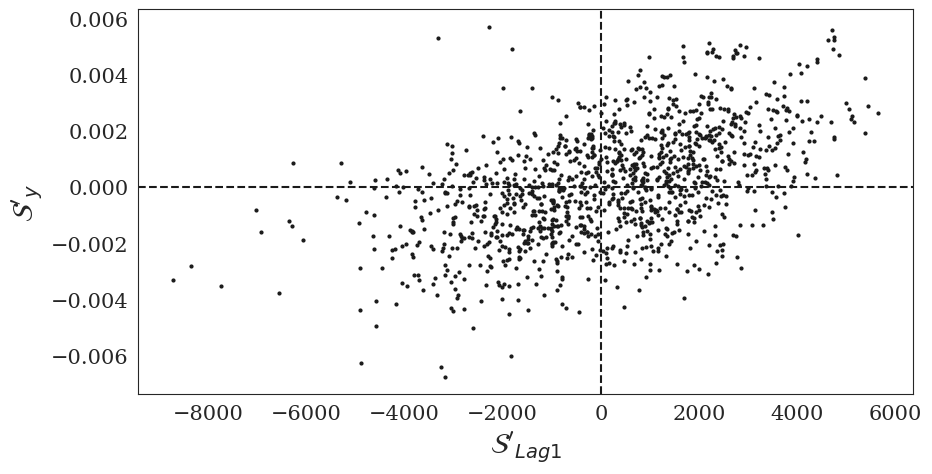

In [658]:
fig, ax = plt.subplots(figsize=(10,5))
df_plt.plot.scatter(x=cvar2, y=cvar3, s=4, c='k', ax=ax)
ax.axhline(0, c='k', ls='--')
ax.axvline(0, c='k', ls='--')


In [319]:
mon_map[4].capitalize()

'Apr'

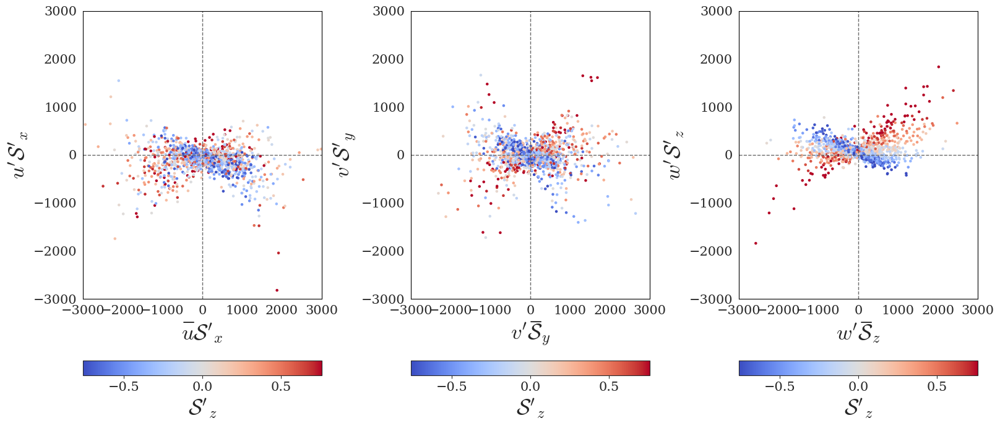

In [326]:
nrow = 1
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

# cvar = cvar2
mon=4
mon_str = mon_map[mon].capitalize()
df_plt = df_t1.loc[df_t1.month.isin([mon])].copy()

cvar = dz_s_anom

low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[0,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[0,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[0,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

# cvar = dy_s_anom
# cvar = dz_s_anom
low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[0,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[0,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[0,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

# cvar = dx_s_anom
# cvar = dy_s_anom

low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[0,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[0,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[0,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

plt.tight_layout()
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_NL_cov_comps_mst.pdf'
pdf_path = f'/home/data/lab_hardik/Manuscript1/Fig_{mon_str}_NL_cov_comps_col_{cvar}.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


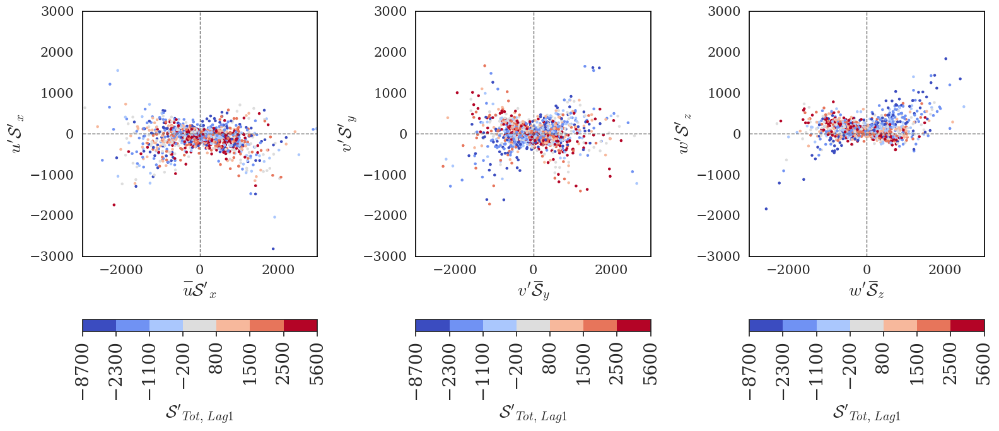

In [272]:
nrow = 1
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

df_plt = df_t1.loc[df_t1.month.isin([4])].copy()
df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)

cvar = cvar2

low_qty = np.round(df_plt[cvar].quantile(0.05)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.05)
hi_qty = np.round(df_plt[cvar].quantile(0.95)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(
    x=x_main, y = nl_us, c=cvar, s=5, ax=ax[0,0], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=y_main, y = nl_vs, c=cvar, s=5, ax=ax[0,1], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)

df_plt.plot.scatter(
    x=z_main, y = nl_ws, c=cvar, s=5, ax=ax[0,2], 
    colorbar=False, cmap=cmap_bgcon, norm = norm_bgcon
)


for j in range(3):
    divider = make_axes_locatable(ax[0,j])
    cax = divider.append_axes("bottom", size="5%", pad=1) 
    cbar = fig.colorbar(ax[0,j].collections[0], cax=cax, orientation='horizontal')
    cbar.set_label(cvar)
    cbar.ax.tick_params(labelsize=20, rotation=90)

    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

plt.tight_layout()

pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_both_bg_NL_QL_ortho_relations.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## QL-NL relationships wrt bg condition S'Lag1 and dynamical indicator S'y

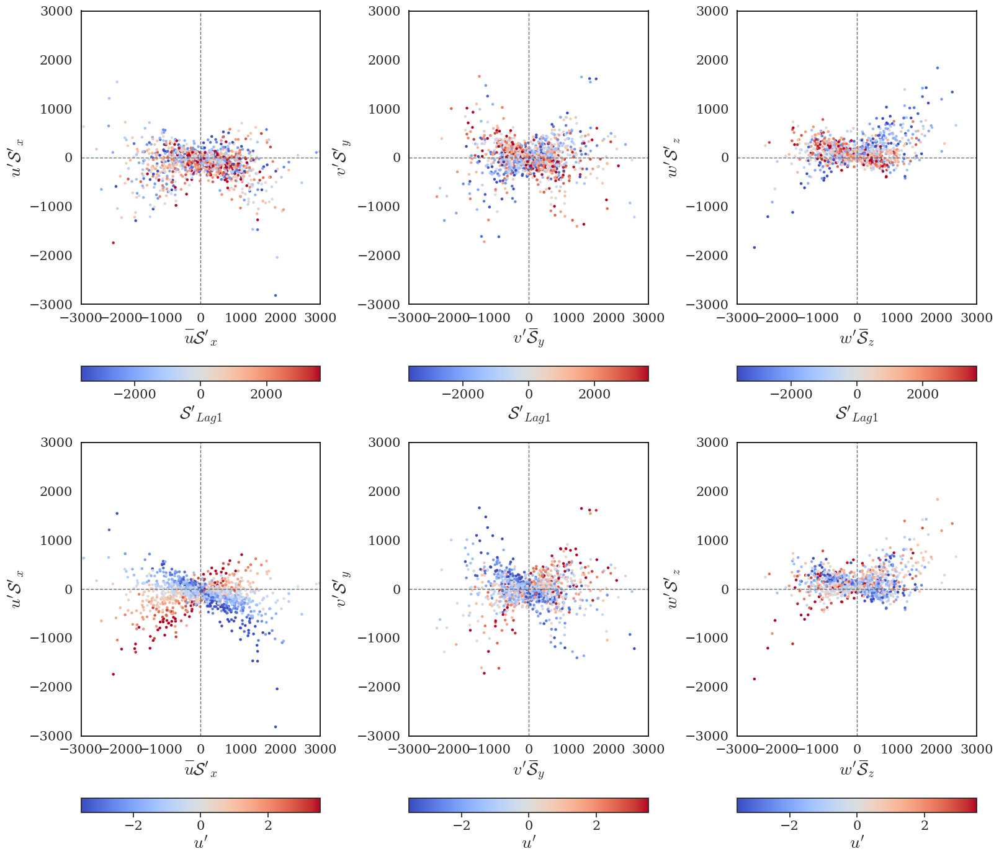

In [273]:
nrow = 2
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

cvar1 = '$\mathregular{T_{QL}}$'
cvar2 = '$\\mathcal{S}\'_{Lag1}$'
cvar3 = dy_s_anom

df_plt = df_t1.loc[df_t1.month.isin([4])].copy()
df_plt.rename({'T_main':cvar1,'dse_anom_Lag1': cvar2}, axis=1, inplace=True)

cvar = cvar2
# cvar = cvar3

low_qty = np.round(df_plt[cvar].quantile(0.05)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.05)
hi_qty = np.round(df_plt[cvar].quantile(0.95)) if cvar != dy_s_anom else df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[0,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[0,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[0,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[0,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[0,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[0,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[0,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[0,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[0,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

### Row 2
# cvar = cvar2
cvar = uanom #cvar3

low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)

vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin

df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[1,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[1,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[1,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[1,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[1,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[1,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[1,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[1,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[1,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[1,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[1,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[1,j].set_facecolor("white")
    
    ax[1,j].set_xlim(-3000,3000)
    ax[1,j].set_ylim(-3000,3000)

    for spine in ax[1,j].spines.values():
        spine.set_edgecolor('black')

# ## Row 3
# # cvar = cvar2
# cvar = dy_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[2,1], colorbar=False, vmin=vmin, vmax=vmax)
# divider = make_axes_locatable(ax[2,1])
# cax = divider.append_axes("bottom", size="5%", pad=1) 
# cbar = fig.colorbar(ax[2,1].collections[0], cax=cax, orientation='horizontal') 
# cbar.set_label(cvar)

# cvar = dz_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[2,2], colorbar=False, vmin=vmin, vmax=vmax)
# divider2 = make_axes_locatable(ax[2,2])
# cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
# cbar2 = fig.colorbar(ax[2,2].collections[0], cax=cax2, orientation='horizontal') 
# cbar2.set_label(cvar)

# cvar = dx_s_anom
# low_qty = df_plt[cvar].quantile(0.05)
# hi_qty = df_plt[cvar].quantile(0.95)
# vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
# vmax = -1*vmin
# df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[2,0], colorbar=False, vmin=vmin, vmax=vmax)
# divider3 = make_axes_locatable(ax[2,0])
# cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
# cbar3 = fig.colorbar(ax[2,0].collections[0], cax=cax3, orientation='horizontal') 
# cbar3.set_label(cvar)

# for j in range(3):
#     ax[2,j].axhline(0, ls='--', lw=1, c='dimgrey')
#     ax[2,j].axvline(0, ls='--', lw=1, c='dimgrey')
#     ax[2,j].set_facecolor("white")
    
#     ax[2,j].set_xlim(-3000,3000)
#     ax[2,j].set_ylim(-3000,3000)

#     for spine in ax[2,j].spines.values():
#         spine.set_edgecolor('black')

plt.tight_layout()

# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_bgcontxt_NL_QL_ortho_relations.pdf'
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_sy_bg_NL_QL_ortho_relations.pdf'
pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_both_bg_NL_QL_ortho_relations.pdf'
# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_NL_QL_mst.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [52]:
df_plt[dy_s_anom].corr(df_plt[dz_s_anom])

-0.4625438073911551

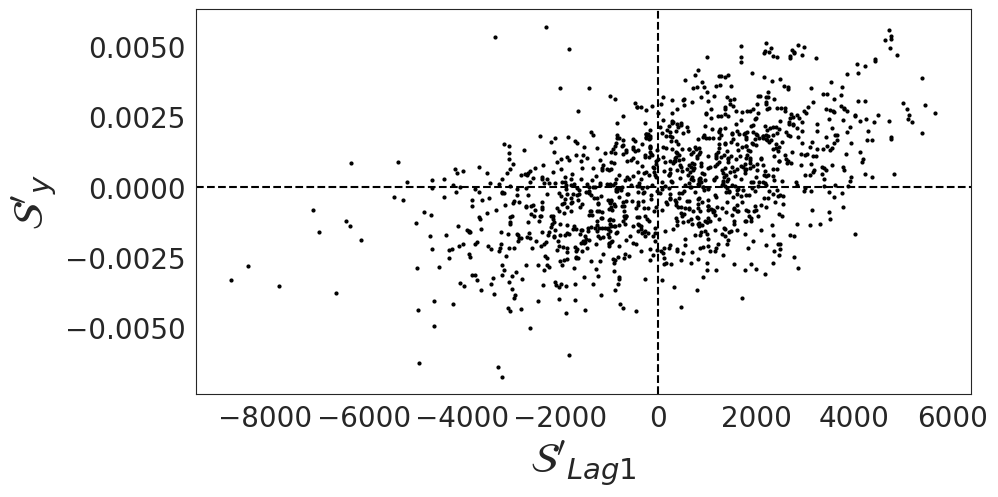

In [53]:
fig, ax = plt.subplots(figsize=(10,5))
df_plt.plot.scatter(x=cvar2, y=cvar3, s=4, c='k', ax=ax)
ax.axhline(0, c='k', ls='--')
ax.axvline(0, c='k', ls='--')


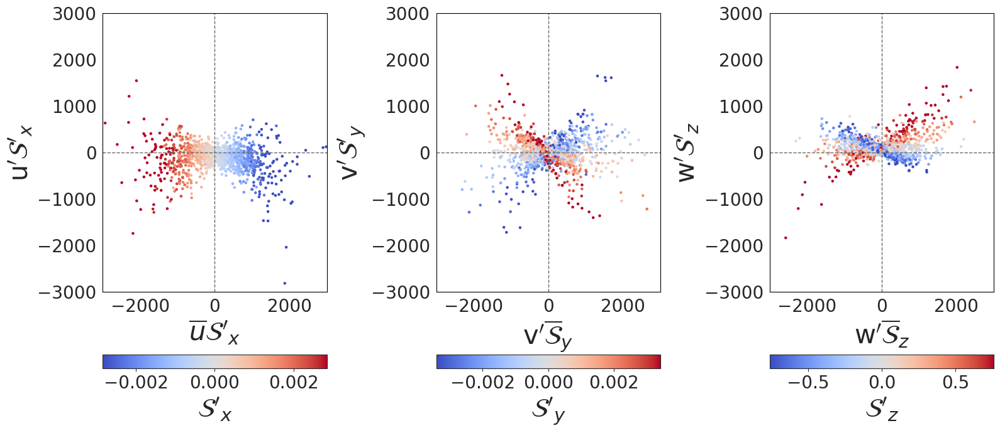

In [55]:
nrow = 1
fig,ax = plt.subplots(nrow,3,figsize=(16,nrow*7), squeeze=False)

# cvar = cvar2
cvar = dy_s_anom
low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=y_main, y = nl_vs, c=cvar, cmap='coolwarm', s=5, ax=ax[0,1], colorbar=False, vmin=vmin, vmax=vmax)
divider = make_axes_locatable(ax[0,1])
cax = divider.append_axes("bottom", size="5%", pad=1) 
cbar = fig.colorbar(ax[0,1].collections[0], cax=cax, orientation='horizontal') 
cbar.set_label(cvar)

cvar = dz_s_anom
low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=z_main, y = nl_ws, c=cvar, cmap='coolwarm', s=5, ax=ax[0,2], colorbar=False, vmin=vmin, vmax=vmax)
divider2 = make_axes_locatable(ax[0,2])
cax2 = divider2.append_axes("bottom", size="5%", pad=1) 
cbar2 = fig.colorbar(ax[0,2].collections[0], cax=cax2, orientation='horizontal') 
cbar2.set_label(cvar)

cvar = dx_s_anom
low_qty = df_plt[cvar].quantile(0.05)
hi_qty = df_plt[cvar].quantile(0.95)
vmin = low_qty if np.abs(low_qty) > hi_qty else -1*hi_qty
vmax = -1*vmin
df_plt.plot.scatter(x=x_main, y = nl_us, c=cvar, cmap='coolwarm', s=5, ax=ax[0,0], colorbar=False, vmin=vmin, vmax=vmax)
divider3 = make_axes_locatable(ax[0,0])
cax3 = divider3.append_axes("bottom", size="5%", pad=1) 
cbar3 = fig.colorbar(ax[0,0].collections[0], cax=cax3, orientation='horizontal') 
cbar3.set_label(cvar)

for j in range(3):
    ax[0,j].axhline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].axvline(0, ls='--', lw=1, c='dimgrey')
    ax[0,j].set_facecolor("white")
    
    ax[0,j].set_xlim(-3000,3000)
    ax[0,j].set_ylim(-3000,3000)

    for spine in ax[0,j].spines.values():
        spine.set_edgecolor('black')

plt.tight_layout()
pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_Apr_NL_cov_comps_mst.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


# Transition Matrix

In [24]:
df_t1.columns

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL'],
      dtype=

In [25]:
# y_var = 'adv_recon'
num_classes = 5

y_var = 'dse_anom_Lag1'
df_intensify, globals()[f'{y_var}_class_map'] = \
create_classes(df_t1.loc[df_t1.month==4,:], y_var = y_var, num_classes = num_classes)
# create_classes(df_mst.loc[df_mst.month==4,:], y_var = y_var, num_classes = num_classes)

labels0 = list(globals()[f'{y_var}_class_map'].values())

[0, 1, 2, 3, 4] [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
dse_anom_Lag1_clss created
dse_anom_Lag1_clss
0    247
1    247
2    246
3    247
4    247
Name: count, dtype: int64
dse_anom_Lag1_class_map created
{0: '(-8707.5,-1774.3]', 1: '(-1774.3,-334.4]', 2: '(-334.4,901.9]', 3: '(901.9,2097.9]', 4: '(2097.9,5646.4]'}


In [26]:
y_var = 'adv_recon_2Dave'
# y_var = 't2m_anom'
df_intensify, globals()[f'{y_var}_class_map'] = \
create_classes(df_intensify, y_var = y_var, num_classes = num_classes)
labels0 = list(globals()[f'{y_var}_class_map'].values())


[0, 1, 2, 3, 4] [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
adv_recon_2Dave_clss created
adv_recon_2Dave_clss
0    247
1    247
2    246
3    247
4    247
Name: count, dtype: int64
adv_recon_2Dave_class_map created
{0: '(-3877.6,-431.2]', 1: '(-431.2,-85.5]', 2: '(-85.5,169.2]', 3: '(169.2,464.2]', 4: '(464.2,2221.1]'}


In [27]:
y_var = 'del_t2m_anom'
# y_var = 't2m_anom'
df_intensify, globals()[f'{y_var}_class_map'] = \
create_classes(df_intensify, y_var = y_var, num_classes = num_classes)
labels0 = list(globals()[f'{y_var}_class_map'].values())


[0, 1, 2, 3, 4] [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
del_t2m_anom_clss created
del_t2m_anom_clss
0    247
1    247
2    246
3    247
4    247
Name: count, dtype: int64
del_t2m_anom_class_map created
{0: '(-3.1,-0.6]', 1: '(-0.6,-0.1]', 2: '(-0.1,0.3]', 3: '(0.3,0.7]', 4: '(0.7,2.6]'}


In [28]:
globals()[f'{y_var}_class_map']

{0: '(-3.1,-0.6]',
 1: '(-0.6,-0.1]',
 2: '(-0.1,0.3]',
 3: '(0.3,0.7]',
 4: '(0.7,2.6]'}

/tmp/ipykernel_1602593/2365867247.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


<Axes: xlabel='adv_recon_2Dave_clss'>

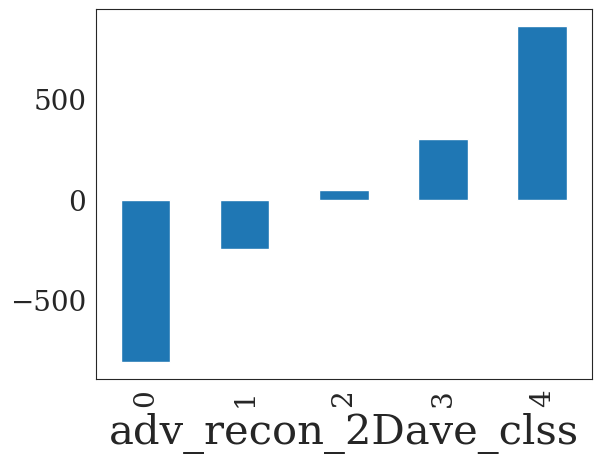

In [29]:
df_intensify.groupby('adv_recon_2Dave_clss')['adv_recon_2Dave'].mean().plot(kind='bar')
# .quantile(np.linspace(0,1,6)).plot()

/tmp/ipykernel_1602593/1571452230.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


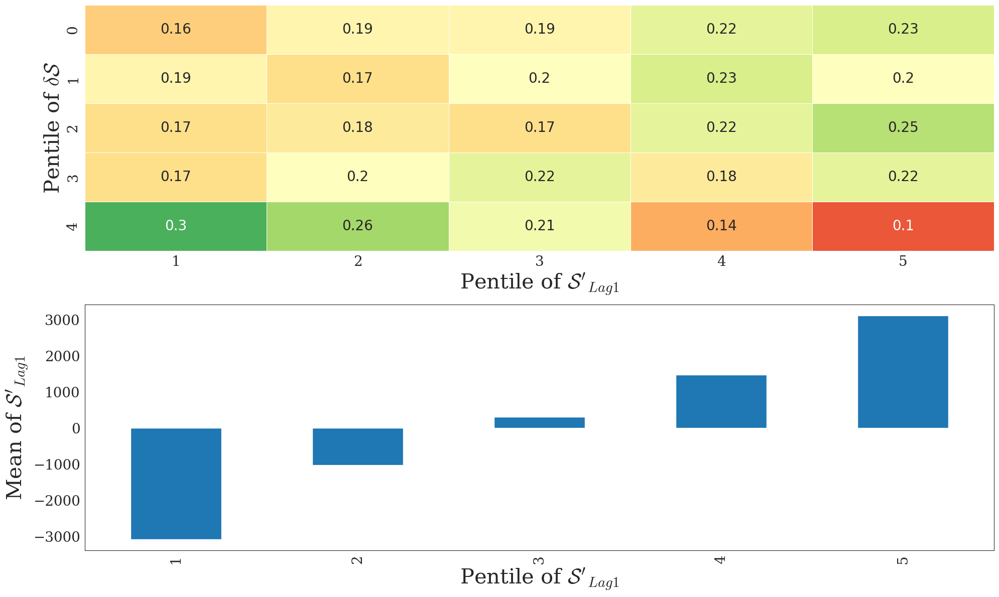

In [31]:
df_crstab = pd.crosstab(df_intensify['adv_recon_2Dave_clss'], columns=df_intensify['dse_anom_Lag1_clss'], )

fig, ax = plt.subplots(2,1,figsize=(20,12))

with sn.axes_style('white'):
    sn.heatmap(
        round(df_crstab.loc[:,].div(df_crstab.sum(axis=1), axis=0),2),
        vmin=0.05, vmax=0.35,
        cbar=False,
        square=False,annot=True,annot_kws={"size": 20},fmt='g',
        cmap = 'RdYlGn',linewidths=0.5,
        ax=ax[0]
    )

ax[0].set_xlabel('Pentile of $\mathcal{S}\'_{Lag1}$')
ax[0].set_ylabel('Pentile of $\delta \mathcal{S}$')
ax[0].set_xticks(ticks = ax[0].get_xticks(),labels=[1,2,3,4,5])

df_intensify.groupby('dse_anom_Lag1_clss')['dse_anom_Lag1'].mean().plot(kind='bar', ax=ax[1])
ax[1].set_xticks(ticks = ax[1].get_xticks(),labels=[1,2,3,4,5])
ax[1].set_ylabel('Pentile of $\delta \mathcal{S}$')
ax[1].set_xlabel('Pentile of $\mathcal{S}\'_{Lag1}$')
ax[1].set_ylabel('Mean of $\mathcal{S}\'_{Lag1}$')

plt.tight_layout()

# pdf_path = '/home/data/lab_hardik/Manuscript1/Suppli_Fig_Apr_Transition_Mat.pdf'
# plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


In [32]:
df_intensify.columns


Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$', 'adv_recon',
       'coready_dse_del1', 'year', 'month', 'day', 't2m_anom', 't2m_anom_Lag1',
       'del_t2m_anom', '$u'$', '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom',
       'w_down_clmt', '$\mathcal{S}'_x$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}'_y$', '$\mathcal{S}̅_y$', '$\mathcal{S}'_z$',
       '$\mathcal{S}̅_z$', 'dse_anom', 'dse_clmt', 'dates_roll_clmt', '$w'$',
       '${w̅}$', 'adv_recon_Lag1', 'dse_anom_Lag1', 'adv_recon_2Dave',
       'Net_Adv', 'T0', 'T_main', 'T2', 'lin_sum', 'NL_sum', 'ed_x_y',
       'ed_y_z', 'ed_x_z', 'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'',
       'w̅', 'x_contrib_NL', 'y_contrib_NL', 'z_contrib_NL',
       'dse_a

In [33]:
df_crstab = pd.crosstab(df_intensify['adv_recon_2Dave_clss'], columns=df_intensify['del_t2m_anom_clss'], )\
.sort_index(ascending=False)

In [34]:
df_crstab

del_t2m_anom_clss,0,1,2,3,4
adv_recon_2Dave_clss,,,,,
4,3,14,26,63,141
3,20,32,49,85,61
2,19,55,78,62,32
1,61,87,61,31,7
0,144,59,32,6,6


In [35]:
# df_crstab.index.values.astype(int)

In [36]:
# df_crstab.index = [f"$P_{{{i}}}$" for i in df_crstab.index.values.astype(int) + 1]
df_crstab.index = df_crstab.index.values.astype(int) + 1
# df_crstab.index = ["$\ll 0$", "$<0$", "$\sim 0$", "$>0$", "$\gg 0$" ]

In [37]:
[f"$P_{{{i}}}$" for i in df_crstab.columns.astype(int) + 1]

['$P_{1}$', '$P_{2}$', '$P_{3}$', '$P_{4}$', '$P_{5}$']

In [38]:
# df_crstab.columns = [f"$P_{{{i}}}$" for i in df_crstab.columns.astype(int) + 1]
df_crstab.columns = np.array(df_crstab.columns.values) + 1
# np.array(df_crstab.columns.values) + 1
# df_crstab.columns = ["$\ll 0$", "$<0$", "$\sim 0$", "$>0$", "$\gg 0$" ]

In [39]:
df_crstab
# .index[::-1]

,1,2,3,4,5
5,3,14,26,63,141
4,20,32,49,85,61
3,19,55,78,62,32
2,61,87,61,31,7
1,144,59,32,6,6


## Fig1

In [40]:
from matplotlib import gridspec

0 0
0 1
1 0


/tmp/ipykernel_1602593/1236107149.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


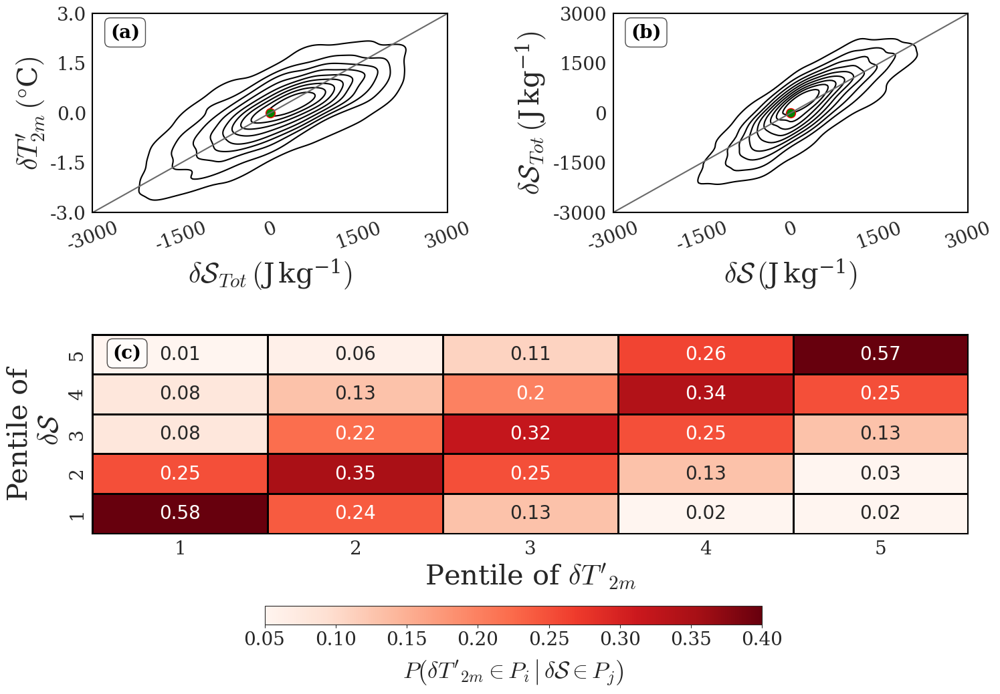

In [57]:
fontname = "DejaVu Serif"
params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':30, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':30, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': fontname,
}

plt.rcParams.update(params)
tot_rows = 2
fig = plt.figure(figsize = (16,tot_rows*5))
gs = gridspec.GridSpec(tot_rows, 2)

# Create subplots using array-style indexing
ax = [[fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])],
      [fig.add_subplot(gs[1, :])],]

df_plt = df_t1.loc[df_t1.month.isin([3,4])]

sns.kdeplot(data=df_plt, x="coready_dse_del1", y="del_t2m_anom", ax=ax[0][0], legend=True, color='k')
ax[0][0].plot(0, 0, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")

# df_plt.plot.scatter(x='coready_dse_del1', y='del_t2m_anom', ax=ax[0][0], s=4, c='k')
# ax[0][0].axhline(0, c='dimgray', ls='--')
# ax[0][0].axvline(0, c='dimgray', ls='--')
ax[0][0].set_ylabel('$\delta T_{2m}\'\,(\degree\mathregular{C})$')
ax[0][0].set_xlabel('$\delta \mathcal{S}_{Tot}\,(\mathregular{J\,kg^{-1}})$')
ax[0][0].axline((0,0), slope=1/1000, c='dimgray',)
# ax[0][0].set_title('$r = {}$'.format(df_plt['coready_dse_del1'].corr(df_plt['del_t2m_anom']).round(2)), fontsize=25)
ax[0][0].set_xlim(-3000,3000)
ax[0][0].set_ylim(-3,3)
ax[0][0].set_xticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), rotation=20)
ax[0][0].set_yticks(ticks=list(np.arange(-3,4,1.5)), labels= list(np.arange(-3,4,1.5)),)

sns.kdeplot(data=df_plt, x="adv_recon_2Dave", y="coready_dse_del1", ax=ax[0][1], legend=True, color='k')
ax[0][1].plot(0, 0, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
# df_plt.plot.scatter(x='adv_recon_2Dave', y='coready_dse_del1', ax=ax[0][1], s=4, c='k')
# ax[0][1].axhline(0, c='dimgray', ls='--')
# ax[0][1].axvline(0, c='dimgray', ls='--')
ax[0][1].set_ylabel('$\delta \mathcal{S}_{Tot}\,(\mathregular{J\,kg^{-1}})$')
ax[0][1].set_xlabel('$\delta \mathcal{S}\,(\mathregular{J\,kg^{-1}})$')
ax[0][1].axline((0,0), slope=1, c='dimgray',)
ax[0][1].set_xlim(-3000,3000)
ax[0][1].set_ylim(-3000,3000)
ax[0][1].set_xticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), rotation=20)
ax[0][1].set_yticks(ticks=list(np.arange(-3000,4000,1500)), labels= list(np.arange(-3000,4000,1500)), )

ax[0][0].set_facecolor("white")
ax[0][1].set_facecolor("white")


# Add the index at the left top of the plot 
props = dict(boxstyle='round', facecolor='white', alpha=.7, edgecolor='black')
basesize=20
ax[0][0].text(.05, .95, '(a)', transform=ax[0][0].transAxes, fontsize=basesize, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[0][1].text(.05, .95, '(b)', transform=ax[0][1].transAxes, fontsize=basesize, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')
ax[1][0].text(.023, .95, '(c)', transform=ax[1][0].transAxes, fontsize=basesize, fontname =fontname, 
              verticalalignment='top', c='k', bbox=props, fontweight='bold')

with sn.axes_style('white'):
    sn.heatmap(
        round(df_crstab.loc[:,].div(df_crstab.sum(axis=1), axis=0),2),
        vmin=0.05, vmax=0.4,
        cbar=False,
#         cbar_kws={'orientation': 'horizontal'},

        square=False,annot=True,annot_kws={"size": 20},fmt='g',
        cmap = 'Reds',
        linewidths=1,
        linecolor='black', 
        ax=ax[1][0]
    )

ax[1][0].set_xlabel('Pentile of $\delta T\'_{2m}$', fontsize = 30) # \'\,(\degree\mathregular{C})
ax[1][0].set_ylabel('Pentile of\n $\delta \mathcal{S}$', fontsize = 30) # \,(\mathregular{J\,kg^{-1}})
# ax.set_xticks(ticks = ax.get_xticks(), )
# ax.set_yticks(ticks = ax.get_yticks())

# ax[1][0].set_yticklabels(df_crstab.index[::-1], rotation=0)
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Create a dummy mappable for the colorbar
norm = Normalize(vmin=0.05, vmax=0.4)
cmap = plt.get_cmap('Reds')
mappable = ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])

# Compute position relative to ax[1][0]
bbox = ax[1][0].get_position(fig)
cbar_height = bbox.height * 0.08
cbar_bottom = bbox.y0 - cbar_height - 0.07
cbar_width = bbox.width * 0.6
cbar_left = bbox.x0 + (bbox.width - cbar_width) / 2

# Add colorbar axis
cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=20)
# cbar.set_label('Joint frequency', fontsize=30, labelpad=10)
cbar.set_label(r"$P\left( \delta T'_{2m} \in P_i \,\middle|\, \delta \mathcal{S} \in P_j \right)$", fontsize=25, labelpad=10)

borderthickness=1.5

for i in range(2):
    for j in range(2):
        if not ((i==1) and (j==1)):
            print(i,j)
            ax[i][j].spines['top'].set_linewidth(borderthickness)
            ax[i][j].spines['bottom'].set_linewidth(borderthickness)
            ax[i][j].spines['right'].set_linewidth(borderthickness)
            ax[i][j].spines['left'].set_linewidth(borderthickness)
            for spine in ax[i][j].spines.values():
                spine.set_color('black')
    
for _, spine in ax[1][0].spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_edgecolor('black')

plt.tight_layout(pad=4.5)

# pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_T2m_corrs.pdf'
pdf_path = '/home/data/lab_hardik/Manuscript1/Fig_T2m_corrs_transmat.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF


## Correlation matrix bw advection components

In [1015]:
df_t1.columns[:12]

Index(['$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$', '$w'$$\mathcal{S}'_z$',
       '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', '${v̅}$$\mathcal{S}'_y$',
       '${w̅}$$\mathcal{S}'_z$', '${u̅}$$\mathcal{S}̅_x$',
       '${v̅}$$\mathcal{S}̅_y$', '${w̅}$$\mathcal{S}̅_z$'],
      dtype='object')

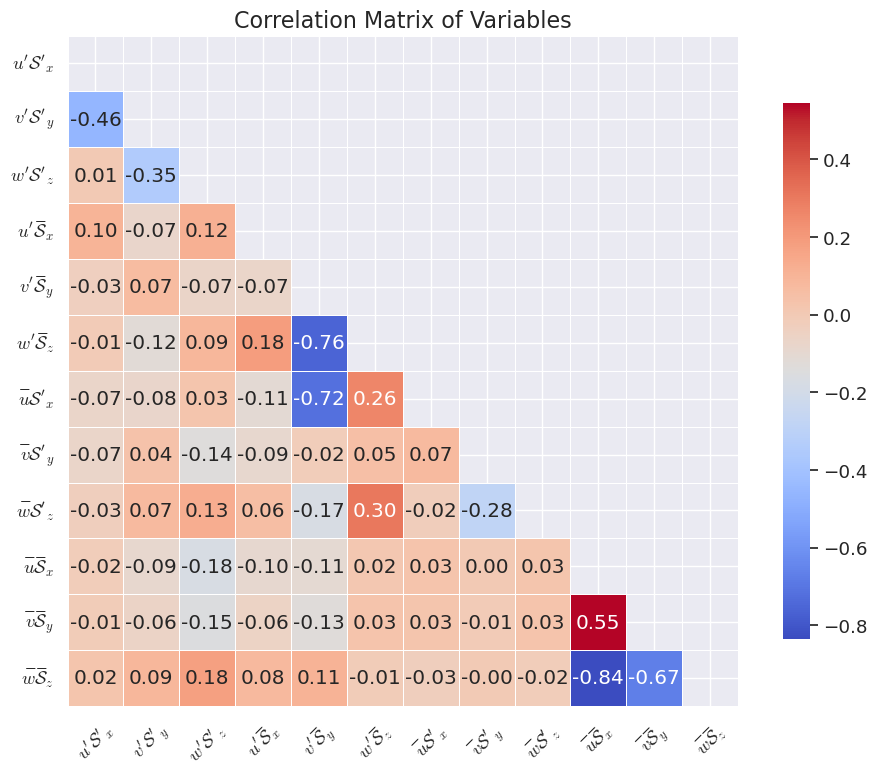

In [1021]:
df = df_t1.loc[df_t1.month.isin([3,4])].iloc[:,:12]
# Assuming your DataFrame is named df
corr_matrix = df.corr()

# Set up the plot
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Create the heatmap
sns.heatmap(corr_matrix,
            mask=mask,
            annot=True, 
            fmt=".2f", 
            cmap="coolwarm", 
            square=True, 
            linewidths=0.5, 
            cbar_kws={"shrink": 0.8})

plt.title("Correlation Matrix of Variables", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [157]:
df_mon['dspc'] = \
     np.where(
         (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
         (df_mon[z_main] > -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node 3', 
              np.where(
                  (df_mon[x_main] < (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                  (df_mon[z_main] < -(0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node 1',
                       np.where(
                           (df_mon[x_main] > ((-0.09*df_mon[x_main].std() + df_mon[x_main].mean()))) & 
                           (df_mon[z_main] > ((0.075*df_mon[z_main].std() + df_mon[z_main].mean()))), 'Node 4', 
                                np.where(
                                    (df_mon[x_main] > (-0.09*df_mon[x_main].std() + df_mon[x_main].mean())) & 
                                    (df_mon[z_main] < (0.075*df_mon[z_main].std() + df_mon[z_main].mean())), 'Node 2', np.nan
                                )
                       )
              )
     )

In [158]:
# Create a flag variable based on the condition
sigma = df_mon['adv_recon_2Dave'].std()
q10 = df_mon['adv_recon_2Dave'].quantile(.9)
q1 = df_mon['adv_recon_2Dave'].quantile(.1)

# df_mon['Net_Adv_sigma_fl'] = df_mon['adv_recon_2Dave'].apply(lambda x: '$> \sigma$' if np.abs(x) > sigma else '$< \sigma$')
df_mon['Net_Adv_sigma_fl'] = df_mon['adv_recon_2Dave'].apply(lambda x: 'Extreme Deciles' if (np.abs(x) > q10) | (np.abs(x) < q1) else 'Body')
df_mon['Net_Adv_ext_cat'] = df_mon['adv_recon_2Dave']\
.apply(lambda x: 'decile 10' if (x > q10) else 'decile 1' if  (x < q1) else np.nan)




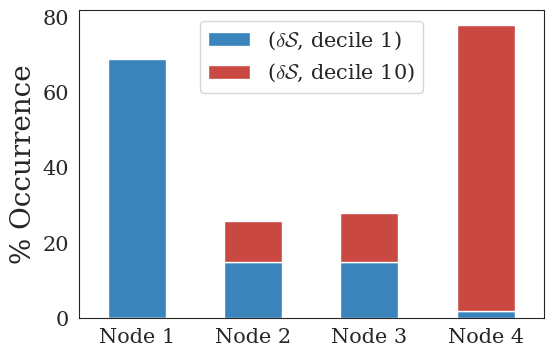

In [164]:
mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['mathtext.fontset'] = 'cm'  # Use Computer Modern font
# redcolor = '#ca4842' #'#67001f'
# bluecolor = '#3884bb' #'#053061'

params = {
#     'legend.fontsize': 10,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
}
plt.rcParams.update(params)

fig,ax = plt.subplots(figsize=(6,4))
df_plt = df_mon.loc[df_mon.Net_Adv_ext_cat == df_mon.Net_Adv_ext_cat]
round(
    (
        df_plt.groupby(['dspc', 'Net_Adv_ext_cat'])['Net_Adv_ext_cat'].count()/
        df_plt.groupby(['Net_Adv_ext_cat',])['Net_Adv_ext_cat'].count()
    )*100
).rename('$\delta \mathcal{S}$')\
.reset_index()\
.set_index('dspc')\
.pivot(columns = 'Net_Adv_ext_cat')\
.plot.bar(stacked=True, color=[bluecolor, redcolor], ax=ax, alpha=1)\
.legend(loc='upper center')

ax.tick_params(axis='x', rotation=0)
ax.set_xlabel('')
ax.set_ylabel('% Occurrence')
# plt.axhline(50, ls='--', c='dimgrey')
pdf_path = '/home/data/lab_hardik/Manuscript1/Supplem_Apr_Ext_NetAdv_Distn.pdf'
plt.savefig(pdf_path, format='pdf', bbox_inches='tight')  # Use savefig to save as PDF
